In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from matplotlib.colors import LinearSegmentedColormap
import pymc as pm
import numpy as np
import matplotlib.pyplot as plt
import arviz as az

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import multivariate_normal

# **OSD_654**

In [2]:
OSD_654 = pd.read_csv('/Users/zhangxiangyu/Desktop/lab/multivariate_analysis/raw_data/OSD_654.csv')

In [29]:
OSD_654.columns

Index(['Sample Name', 'trabecular_separation_millimeter',
       'trabecular_number_1_per_millimeter', 'degree_of_anisotropy',
       'connective_density', 'total_perimeter_millimeter',
       'endocortical_perimeter_millimeter',
       'medullary_area_millimeter_squared', 'eccentricity ',
       'cortical_thickness_millimeter'],
      dtype='object')

In [49]:
# separate the group into ground control and space flight
GC = OSD_654[OSD_654['Sample Name'].str.contains('GC', na=False)]
Viv = OSD_654.iloc[15:20, :]
F = OSD_654.iloc[20:25, :]
F = F.dropna()

## **connective density**

In [50]:
# make a scatter plot of the connective_density 
GC_cd = GC['connective_density']
Viv_cd = Viv['connective_density']
F_cd = F['connective_density']

# combine the GC_cd and Viv_cd
GC_Viv_cd = pd.concat([GC_cd, Viv_cd], axis=0)

In [35]:
print("GC_Viv_cd max:", np.max(GC_Viv_cd))
print("F_cd max:", np.max(F_cd))

GC_Viv_cd max: 0.00038
F_cd max: 0.00047


In [51]:
print((GC_cd.mean() - F_cd.mean())/GC_cd.mean())

-0.12275449101796414


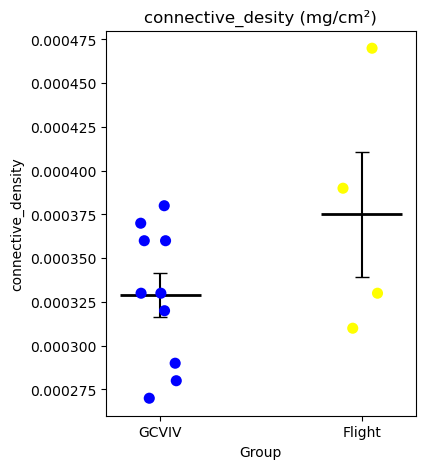

In [8]:
data = pd.DataFrame({
    'Group': ['GCVIV']*len(GC_Viv_cd) + ['Flight']*len(F_cd),
    'connective_density': pd.concat([GC_Viv_cd, F_cd], axis=0)
})

plt.figure(figsize=(4, 5))
sns.stripplot(x='Group', y='connective_density', data=data, hue='Group', jitter=True, marker='o', palette=['blue', 'yellow'], size=8, legend=False)

mean_gc_viv = GC_Viv_cd.mean()
mean_f = F_cd.mean()
sem_gc_viv = GC_Viv_cd.sem()
sem_f = F_cd.sem()
plt.errorbar(x=[0, 1], y=[GC_Viv_cd.mean(), F_cd.mean()], yerr=[GC_Viv_cd.sem(), F_cd.sem()], fmt='none', color='black', capsize=5)
plt.hlines(y=mean_gc_viv, xmin=-0.2, xmax=0.2, colors='black', linewidth=2)
plt.hlines(y=mean_f, xmin=0.8, xmax=1.2, colors='black', linewidth=2)


plt.ylim([np.min(GC_Viv_cd) - 0.00001, np.max(F_cd) + 0.00001])

plt.title('connective_desity (mg/cm²)')
# plt.annotate('****', xy=(0.5, np.max(GC_Viv_cd) + 0.00001), ha='center', fontsize=20)

plt.show()


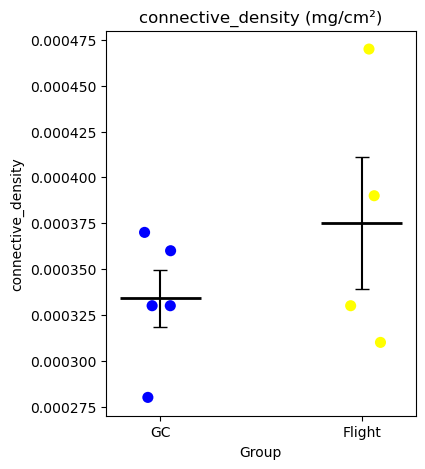

GC_cd mean: 0.000334
GC_cd sem: 1.5684387141358126e-05
Flight mean: 0.000375
Flight sem: 3.593976442141304e-05


In [12]:
data = pd.DataFrame({
    'Group': ['GC']*len(GC_cd) + ['Flight']*len(F_cd),
    'connective_density': pd.concat([GC_cd, F_cd], axis=0)
})

plt.figure(figsize=(4, 5))
sns.stripplot(x='Group', y='connective_density', data=data, hue='Group', jitter=True, marker='o', palette=['blue', 'yellow'], size=8, legend=False)

# get the mean and standard error of the mean
mean_gc = GC_cd.mean()
mean_f = F_cd.mean()
sem_gc = GC_cd.sem()
sem_f = F_cd.sem()
plt.errorbar(x=[0, 1], y=[GC_cd.mean(), F_cd.mean()], yerr=[GC_cd.sem(), F_cd.sem()], fmt='none', color='black', capsize=5)
plt.hlines(y=mean_gc, xmin=-0.2, xmax=0.2, colors='black', linewidth=2)
plt.hlines(y=mean_f, xmin=0.8, xmax=1.2, colors='black', linewidth=2)

plt.ylabel('connective_density')
plt.ylim([np.min(GC_cd) - 0.00001, np.max(F_cd) + 0.00001])
plt.title('connective_density (mg/cm²)')
plt.show()

print("GC_cd mean:", GC_cd.mean())
print("GC_cd sem:", GC_cd.sem())
print('Flight mean:', F_cd.mean())
print('Flight sem:', F_cd.sem())


## **endocortical permimeter**

In [56]:
GC_ep = GC['endocortical_perimeter_millimeter']
Viv_ep = Viv['endocortical_perimeter_millimeter']
F_ep = F['endocortical_perimeter_millimeter']

GCViv_ep = pd.concat([GC_ep, Viv_ep], axis=0)

In [57]:
print("GC_Viv_ep max:", np.max(GCViv_ep))
print("F_ep max:", np.max(F_ep))
print('GCViv_ep min:', np.min(GCViv_ep))
print('F_ep min:', np.min(F_ep))

GC_Viv_ep max: 3.194
F_ep max: 2.856
GCViv_ep min: 2.713
F_ep min: 2.684


In [57]:
print((GC_ep.mean() - F_ep.mean())/GC_ep.mean())

0.049059368822847726


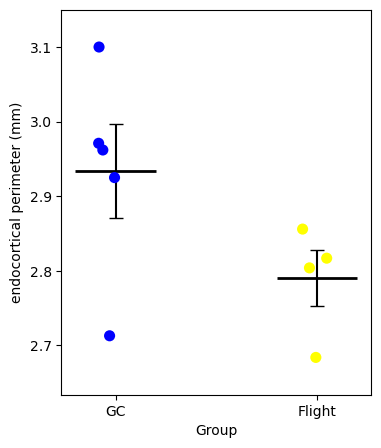

In [65]:
data = pd.DataFrame({
    'Group': ['GC']*len(GC_ep) + ['Flight']*len(F_ep),
    'endocortical perimeter (mm)': pd.concat([GC_ep, F_ep], axis=0)
})

plt.figure(figsize=(4, 5))
sns.stripplot(x='Group', y='endocortical perimeter (mm)', data=data, hue='Group', jitter=True, marker='o', palette=['blue', 'yellow'], size=8, legend=False)

mean_gc_viv = GC_ep.mean()
mean_f = F_ep.mean()
sem_gc_viv = GC_ep.sem()
sem_f = F_ep.sem()
plt.errorbar(x=[0, 1], y=[mean_gc_viv, mean_f], yerr=[sem_gc_viv, sem_f], fmt='none', color='black', capsize=5)
plt.hlines(y=mean_gc_viv, xmin=-0.2, xmax=0.2, colors='black', linewidth=2)
plt.hlines(y=mean_f, xmin=0.8, xmax=1.2, colors='black', linewidth=2)

plt.ylim([np.min(F_ep) - 0.05, np.max(GC_ep) + 0.05])
plt.show()


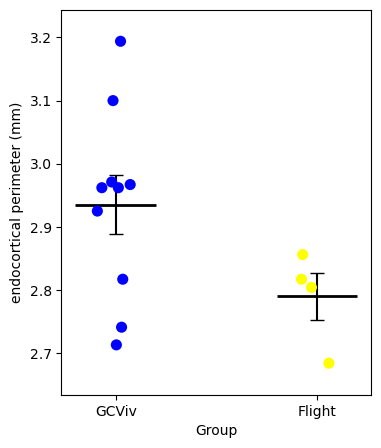

In [66]:
data = pd.DataFrame({
    'Group': ['GCViv']*len(GCViv_ep) + ['Flight']*len(F_ep),
    'endocortical perimeter (mm)': pd.concat([GCViv_ep, F_ep], axis=0)
})

plt.figure(figsize=(4, 5))
sns.stripplot(x='Group', y='endocortical perimeter (mm)', data=data, hue='Group', jitter=True, marker='o', palette=['blue', 'yellow'], size=8, legend=False)

mean_gc_viv = GCViv_ep.mean()
mean_f = F_ep.mean()
sem_gc_viv = GCViv_ep.sem()
sem_f = F_ep.sem()
plt.errorbar(x=[0, 1], y=[mean_gc_viv, mean_f], yerr=[sem_gc_viv, sem_f], fmt='none', color='black', capsize=5)
plt.hlines(y=mean_gc_viv, xmin=-0.2, xmax=0.2, colors='black', linewidth=2)
plt.hlines(y=mean_f, xmin=0.8, xmax=1.2, colors='black', linewidth=2)

plt.ylim([np.min(F_ep) - 0.05, np.max(GCViv_ep) + 0.05])
plt.show()


## **medullary area**

In [58]:
GC_ma = GC['medullary_area_millimeter_squared']
Viv_ma = Viv['medullary_area_millimeter_squared']
F_ma = F['medullary_area_millimeter_squared']

GCViv_ma = pd.concat([GC_ma, Viv_ma], axis=0)

In [68]:
print("GC_Viv_ma max:", np.max(GCViv_ma))
print("F_ma max:", np.max(F_ma))
print('GCViv_ma min:', np.min(GCViv_ma))
print('F_ma min:', np.min(F_ma))

GC_Viv_ma max: 0.683
F_ma max: 0.604
GCViv_ma min: 0.554
F_ma min: 0.55


In [59]:
print((GC_ma.mean() - F_ma.mean())/GC_ma.mean())

0.0528814669286182


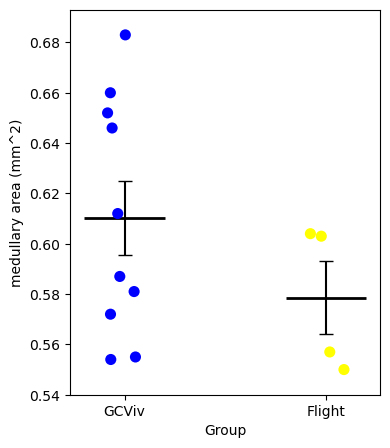

In [74]:
data = pd.DataFrame({
    'Group': ['GCViv']*len(GCViv_ma) + ['Flight']*len(F_ma),
    'medullary area (mm^2)': pd.concat([GCViv_ma, F_ma], axis=0)
})

plt.figure(figsize=(4, 5))
sns.stripplot(x='Group', y='medullary area (mm^2)', data=data, hue='Group', jitter=True, marker='o', palette=['blue', 'yellow'], size=8, legend=False)

mean_gc_viv = GCViv_ma.mean()
mean_f = F_ma.mean()
sem_gc_viv = GCViv_ma.sem()
sem_f = F_ma.sem()
plt.errorbar(x=[0, 1], y=[mean_gc_viv, mean_f], yerr=[sem_gc_viv, sem_f], fmt='none', color='black', capsize=5)
plt.hlines(y=mean_gc_viv, xmin=-0.2, xmax=0.2, colors='black', linewidth=2)
plt.hlines(y=mean_f, xmin=0.8, xmax=1.2, colors='black', linewidth=2)

plt.ylim([np.min(F_ma) - 0.01, np.max(GCViv_ma) + 0.01])
plt.show()

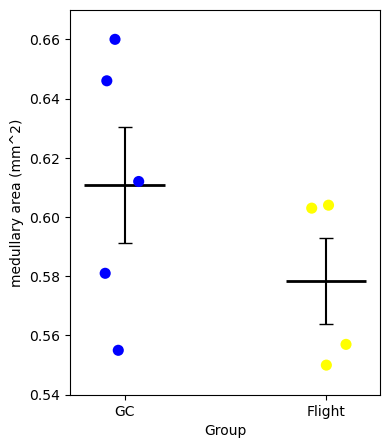

In [75]:
data = pd.DataFrame({
    'Group': ['GC']*len(GC_ma) + ['Flight']*len(F_ma),
    'medullary area (mm^2)': pd.concat([GC_ma, F_ma], axis=0)
})

plt.figure(figsize=(4, 5))
sns.stripplot(x='Group', y='medullary area (mm^2)', data=data, hue='Group', jitter=True, marker='o', palette=['blue', 'yellow'], size=8, legend=False)

mean_gc_viv = GC_ma.mean()
mean_f = F_ma.mean()
sem_gc_viv = GC_ma.sem()
sem_f = F_ma.sem()
plt.errorbar(x=[0, 1], y=[mean_gc_viv, mean_f], yerr=[sem_gc_viv, sem_f], fmt='none', color='black', capsize=5)
plt.hlines(y=mean_gc_viv, xmin=-0.2, xmax=0.2, colors='black', linewidth=2)
plt.hlines(y=mean_f, xmin=0.8, xmax=1.2, colors='black', linewidth=2)

plt.ylim([np.min(F_ma) - 0.01, np.max(GC_ma) + 0.01])
plt.show()

# **OSD_663**

In [3]:
OSD_663 = pd.read_csv('/Users/zhangxiangyu/Desktop/lab/multivariate_analysis/raw_data/OSD_663.csv')

In [4]:
GC_ser9 = OSD_663.iloc[1:6, :]['serine9_phosphorylated_GSK3_beta_content']
GCViv_ser9 = OSD_663.iloc[1:12, :]['serine9_phosphorylated_GSK3_beta_content']
F_ser9 = OSD_663.iloc[12:18, :]['serine9_phosphorylated_GSK3_beta_content']

In [29]:
print('the max of GCViv_ser9:', np.max(GCViv_ser9))
print('the max of F_ser9:', np.max(F_ser9))
print('the min of GCViv_ser9:', np.min(GCViv_ser9))
print('the min of F_ser9:', np.min(F_ser9))

the max of GCViv_ser9: 9.94160666
the max of F_ser9: 2.3656244
the min of GCViv_ser9: 0.62329225
the min of F_ser9: 0.3775553


In [5]:
print((GC_ser9.mean() - F_ser9.mean())/GC_ser9.mean())

0.6363192927583479


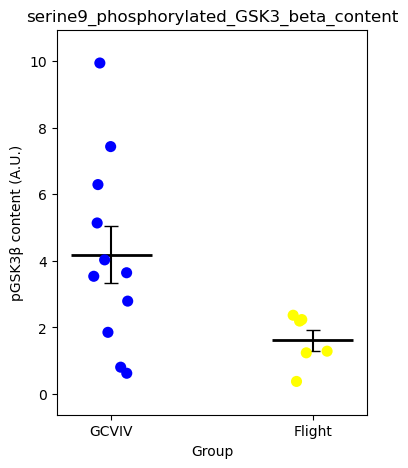

In [45]:
data = pd.DataFrame({
    'Group': ['GCVIV']*len(GCViv_ser9) + ['Flight']*len(F_ser9),
    'pGSK3β content (A.U.)': pd.concat([GCViv_ser9, F_ser9], axis=0)
})

plt.figure(figsize=(4, 5))
sns.stripplot(x='Group', y='pGSK3β content (A.U.)', data=data, hue='Group', jitter=True, marker='o', palette=['blue', 'yellow'], size=8, legend=False)

mean_gc_viv = GCViv_ser9.mean()
mean_f = F_ser9.mean()
sem_gc_viv = GCViv_ser9.sem()
sem_f = F_ser9.sem()
plt.errorbar(x=[0, 1], y=[mean_gc_viv, mean_f], yerr=[sem_gc_viv, sem_f], fmt='none', color='black', capsize=5)
plt.hlines(y=mean_gc_viv, xmin=-0.2, xmax=0.2, colors='black', linewidth=2)
plt.hlines(y=mean_f, xmin=0.8, xmax=1.2, colors='black', linewidth=2)

plt.ylim([np.min(F_ser9) - 1, np.max(GCViv_ser9) + 1])

plt.title('serine9_phosphorylated_GSK3_beta_content')
# plt.annotate('****', xy=(0.5, np.max(GC_Viv_cd) + 0.00001), ha='center', fontsize=20)

plt.show()



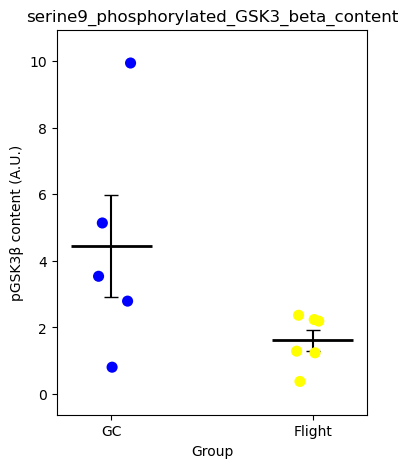

In [44]:
data = pd.DataFrame({
    'Group': ['GC']*len(GC_ser9) + ['Flight']*len(F_ser9),
    'pGSK3β content (A.U.)': pd.concat([GC_ser9, F_ser9], axis=0)
})

plt.figure(figsize=(4, 5))
sns.stripplot(x='Group', y='pGSK3β content (A.U.)', data=data, hue='Group', jitter=True, marker='o', palette=['blue', 'yellow'], size=8, legend=False)

mean_gc_viv = GC_ser9.mean()
mean_f = F_ser9.mean()
sem_gc_viv = GC_ser9.sem()
sem_f = F_ser9.sem()
plt.errorbar(x=[0, 1], y=[mean_gc_viv, mean_f], yerr=[sem_gc_viv, sem_f], fmt='none', color='black', capsize=5)
plt.hlines(y=mean_gc_viv, xmin=-0.2, xmax=0.2, colors='black', linewidth=2)
plt.hlines(y=mean_f, xmin=0.8, xmax=1.2, colors='black', linewidth=2)

plt.ylim([np.min(F_ser9) - 1, np.max(GC_ser9) + 1])

plt.title('serine9_phosphorylated_GSK3_beta_content')
# plt.annotate('****', xy=(0.5, np.max(GC_Viv_cd) + 0.00001), ha='center', fontsize=20)

plt.show()



In [54]:
GC_ratio = OSD_663.iloc[1:6, :]['ratio_of_phosphorylated_serine_9_to_total_GSK3_beta_content_']
GCViv_ratio = OSD_663.iloc[1:12, :]['ratio_of_phosphorylated_serine_9_to_total_GSK3_beta_content_']
F_ratio = OSD_663.iloc[12:18, :]['ratio_of_phosphorylated_serine_9_to_total_GSK3_beta_content_']

In [47]:
print('the max of GCViv_ratio:', np.max(GCViv_ratio))
print('the max of F_ratio:', np.max(F_ratio))
print('the min of GCViv_ratio:', np.min(GCViv_ratio))
print('the min of F_ratio:', np.min(F_ratio))

the max of GCViv_ratio: 10.2077925
the max of F_ratio: 2.9294283
the min of GCViv_ratio: 0.4854548
the min of F_ratio: 0.19197541


In [55]:
print((GC_ratio.mean() - F_ratio.mean()) / GC_ratio.mean())

0.39998331584326235


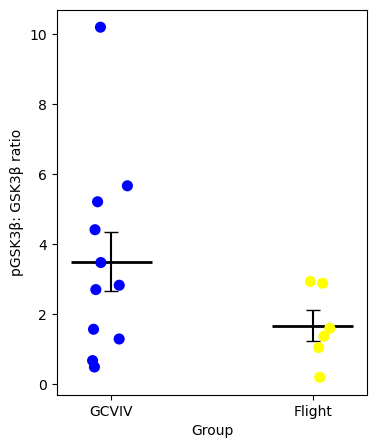

In [50]:
data = pd.DataFrame({
    'Group': ['GCVIV']*len(GCViv_ratio) + ['Flight']*len(F_ratio),
    'pGSK3β: GSK3β ratio': pd.concat([GCViv_ratio, F_ratio], axis=0)
})

plt.figure(figsize=(4, 5))
sns.stripplot(x='Group', y='pGSK3β: GSK3β ratio', data=data, hue='Group', jitter=True, marker='o', palette=['blue', 'yellow'], size=8, legend=False)

mean_gc_viv = GCViv_ratio.mean()
mean_f = F_ratio.mean()
sem_gc_viv = GCViv_ratio.sem()
sem_f = F_ratio.sem()
plt.errorbar(x=[0, 1], y=[mean_gc_viv, mean_f], yerr=[sem_gc_viv, sem_f], fmt='none', color='black', capsize=5)
plt.hlines(y=mean_gc_viv, xmin=-0.2, xmax=0.2, colors='black', linewidth=2)
plt.hlines(y=mean_f, xmin=0.8, xmax=1.2, colors='black', linewidth=2)

plt.ylim([np.min(F_ratio) - 0.5, np.max(GCViv_ratio) + 0.5])
plt.show()


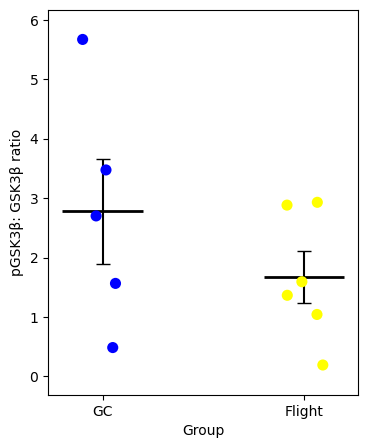

In [51]:
data = pd.DataFrame({
    'Group': ['GC']*len(GC_ratio) + ['Flight']*len(F_ratio),
    'pGSK3β: GSK3β ratio': pd.concat([GC_ratio, F_ratio], axis=0)
})

plt.figure(figsize=(4, 5))
sns.stripplot(x='Group', y='pGSK3β: GSK3β ratio', data=data, hue='Group', jitter=True, marker='o', palette=['blue', 'yellow'], size=8, legend=False)

mean_gc_viv = GC_ratio.mean()
mean_f = F_ratio.mean()
sem_gc_viv = GC_ratio.sem()
sem_f = F_ratio.sem()
plt.errorbar(x=[0, 1], y=[mean_gc_viv, mean_f], yerr=[sem_gc_viv, sem_f], fmt='none', color='black', capsize=5)
plt.hlines(y=mean_gc_viv, xmin=-0.2, xmax=0.2, colors='black', linewidth=2)
plt.hlines(y=mean_f, xmin=0.8, xmax=1.2, colors='black', linewidth=2)

plt.ylim([np.min(F_ratio) - 0.5, np.max(GC_ratio) + 0.5])
plt.show()


# **OSD_662**

In [5]:
OSD_662 = pd.read_csv('/Users/zhangxiangyu/Desktop/lab/multivariate_analysis/raw_data/OSD662.csv')

In [6]:
GC = OSD_662.iloc[22:32, :]
Viv = OSD_662.iloc[12:22, :]
F = OSD_662.iloc[32:42, :]

In [7]:
GC_gsk3 = GC['GSK3_beta_content']
Viv_gsk3 = Viv['GSK3_beta_content']
F_gsk3 = F['GSK3_beta_content']

GCViv_gsk3 = pd.concat([GC_gsk3, Viv_gsk3], axis=0)

In [86]:
print('the max of GCViv_gsk3:', np.max(GCViv_gsk3))
print('the max of F_gsk3:', np.max(F_gsk3))
print('the min of GCViv_gsk3:', np.min(GCViv_gsk3))
print('the min of F_gsk3:', np.min(F_gsk3))

the max of GCViv_gsk3: 1.40184834
the max of F_gsk3: 0.923811152
the min of GCViv_gsk3: 0.478188615
the min of F_gsk3: 0.51846808


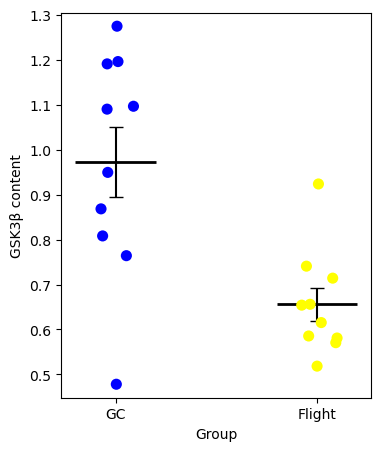

The decrease of GSK3β content in flight group: 0.3249076631194137


In [89]:
data = pd.DataFrame({
    'Group': ['GC']*len(GC_gsk3) + ['Flight']*len(F_gsk3),
    'GSK3β content': pd.concat([GC_gsk3, F_gsk3], axis=0)
})

plt.figure(figsize=(4, 5))
sns.stripplot(x='Group', y='GSK3β content', data=data, hue='Group', jitter=True, marker='o', palette=['blue', 'yellow'], size=8, legend=False)

mean_gc_viv = GC_gsk3.mean()
mean_f = F_gsk3.mean()
sem_gc_viv = GC_gsk3.sem()
sem_f = F_gsk3.sem()
plt.errorbar(x=[0, 1], y=[mean_gc_viv, mean_f], yerr=[sem_gc_viv, sem_f], fmt='none', color='black', capsize=5)
plt.hlines(y=mean_gc_viv, xmin=-0.2, xmax=0.2, colors='black', linewidth=2)
plt.hlines(y=mean_f, xmin=0.8, xmax=1.2, colors='black', linewidth=2)

plt.ylim([np.min(GC_gsk3) - 0.03, np.max(GC_gsk3) + 0.03])
plt.show()

print('The decrease of GSK3β content in flight group:', (GC_gsk3.mean() - F_gsk3.mean())/GC_gsk3.mean())

## **mhc_iix**

In [11]:
GC_mhcx = GC['mhc_iix']
F_mhcx = F['mhc_iix']
Viv_mhcx = Viv['mhc_iix']

GCViv_mhcx = pd.concat([GC_mhcx, Viv_mhcx], axis=0)

In [6]:
print('The max of GC_mhcx:', np.max(GC_mhcx))
print('The max of F_mhcx:', np.max(F_mhcx))
print('The min of GC_mhcx:', np.min(GC_mhcx))
print('The min of F_mhcx:', np.min(F_mhcx))

The max of GC_mhcx: 2.06879104
The max of F_mhcx: 7.88774
The min of GC_mhcx: 0.32701609
The min of F_mhcx: 0.98297173


In [13]:
print((GCViv_mhcx.mean() - F_mhcx.mean())/GCViv_mhcx.mean())

-3.481749315541047


In [15]:
# p-value
t_stat, p_value = stats.ttest_ind(GC_mhcx, F_mhcx, equal_var=False)

# Print the p-value
print(f"P-value: {p_value}")

P-value: nan


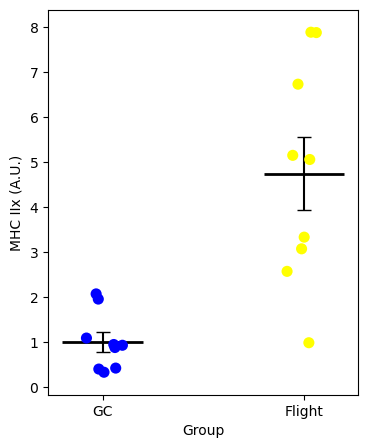

-3.740195089711329


In [12]:
data = pd.DataFrame({
    'Group': ['GC']*len(GC_mhcx) + ['Flight']*len(F_mhcx),
    'MHC IIx (A.U.)': pd.concat([GC_mhcx, F_mhcx], axis=0)
})

plt.figure(figsize=(4, 5))
sns.stripplot(x='Group', y='MHC IIx (A.U.)', data=data, hue='Group', jitter=True, marker='o', palette=['blue', 'yellow'], size=8, legend=False)

mean_gc_viv = GC_mhcx.mean()
mean_f = F_mhcx.mean()
sem_gc_viv = GC_mhcx.sem()
sem_f = F_mhcx.sem()
plt.errorbar(x=[0, 1], y=[mean_gc_viv, mean_f], yerr=[sem_gc_viv, sem_f], fmt='none', color='black', capsize=5)
plt.hlines(y=mean_gc_viv, xmin=-0.2, xmax=0.2, colors='black', linewidth=2)
plt.hlines(y=mean_f, xmin=0.8, xmax=1.2, colors='black', linewidth=2)

plt.ylim([np.min(GC_mhcx) - 0.5, np.max(F_mhcx) + 0.5])
plt.show()

print((GC_mhcx.mean() - F_mhcx.mean())/GC_mhcx.mean())

# **OSD_660**

In [16]:
OSD_660 = pd.read_csv('/Users/zhangxiangyu/Desktop/lab/multivariate_analysis/raw_data/OSD_660.csv')

In [19]:
GC = OSD_660.iloc[0:10, :]
F = OSD_660.iloc[20:30, :]

In [21]:
GC_ratio = GC['ratio_of_phosphorylated_serine_9_to_total_GSK3_beta_content_']  
F_ratio = F['ratio_of_phosphorylated_serine_9_to_total_GSK3_beta_content_']

GC_ratio = GC_ratio.dropna()

In [22]:
print('The max of GC_ratio:', np.max(GC_ratio))
print('The max of F_ratio:', np.max(F_ratio))
print('The min of GC_ratio:', np.min(GC_ratio))
print('The min of F_ratio:', np.min(F_ratio))

The max of GC_ratio: 1.03543224
The max of F_ratio: 1.34239411
The min of GC_ratio: 0.6418006
The min of F_ratio: 0.64230133


In [23]:
print((GC_ratio.mean() - F_ratio.mean())/GC_ratio.mean())

-0.0037293966817683794


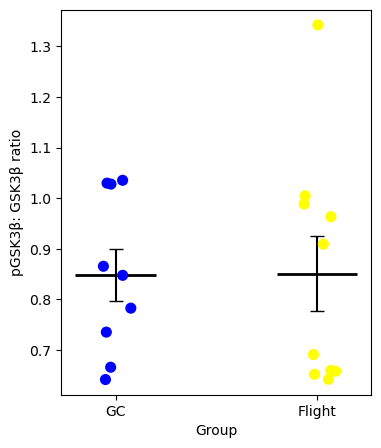

In [26]:
data = pd.DataFrame({
    'Group': ['GC']*len(GC_ratio) + ['Flight']*len(F_ratio),
    'pGSK3β: GSK3β ratio': pd.concat([GC_ratio, F_ratio], axis=0)
})

plt.figure(figsize=(4, 5))
sns.stripplot(x='Group', y='pGSK3β: GSK3β ratio', data=data, hue='Group', jitter=True, marker='o', palette=['blue', 'yellow'], size=8, legend=False)

mean_gc_viv = GC_ratio.mean()
mean_f = F_ratio.mean()
sem_gc_viv = GC_ratio.sem()
sem_f = F_ratio.sem()
plt.errorbar(x=[0, 1], y=[mean_gc_viv, mean_f], yerr=[sem_gc_viv, sem_f], fmt='none', color='black', capsize=5)
plt.hlines(y=mean_gc_viv, xmin=-0.2, xmax=0.2, colors='black', linewidth=2)
plt.hlines(y=mean_f, xmin=0.8, xmax=1.2, colors='black', linewidth=2)

plt.ylim([np.min(GC_ratio) - 0.03, np.max(F_ratio) + 0.03])
plt.show()

# **OSD_583**

In [27]:
OSD_583 = pd.read_csv('/Users/zhangxiangyu/Desktop/lab/multivariate_analysis/raw_data/OSD_583.csv')

In [28]:
F = OSD_583.iloc[0:20, :]
GC = OSD_583.iloc[40:60, :]

In [31]:
F_left = F['Avg_Left']
GC_left = GC['Avg_Left']

In [32]:
print('The max of F_left:', np.max(F_left))
print('The max of GC_left:', np.max(GC_left))
print('The min of F_left:', np.min(F_left))
print('The min of GC_left:', np.min(GC_left))

The max of F_left: 21.33333333
The max of GC_left: 23.0
The min of F_left: 13.0
The min of GC_left: 15.33333333


In [33]:
print((GC_left.mean() - F_left.mean())/GC_left.mean())

0.11342785663791975


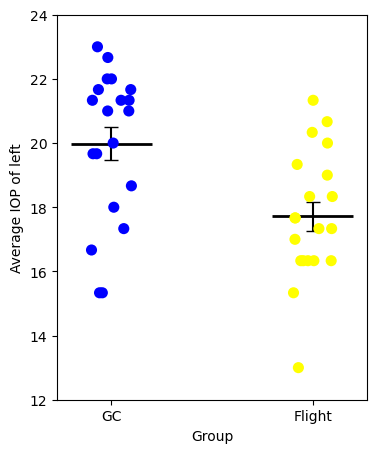

In [34]:
data = pd.DataFrame({
    'Group': ['GC']*len(GC_left) + ['Flight']*len(F_left),
    'Average IOP of left': pd.concat([GC_left, F_left], axis=0)
})

plt.figure(figsize=(4, 5))
sns.stripplot(x='Group', y='Average IOP of left', data=data, hue='Group', jitter=True, marker='o', palette=['blue', 'yellow'], size=8, legend=False)

mean_gc_viv = GC_left.mean()
mean_f = F_left.mean()
sem_gc_viv = GC_left.sem()
sem_f = F_left.sem()
plt.errorbar(x=[0, 1], y=[mean_gc_viv, mean_f], yerr=[sem_gc_viv, sem_f], fmt='none', color='black', capsize=5)
plt.hlines(y=mean_gc_viv, xmin=-0.2, xmax=0.2, colors='black', linewidth=2)
plt.hlines(y=mean_f, xmin=0.8, xmax=1.2, colors='black', linewidth=2)

plt.ylim([np.min(F_left) - 1, np.max(GC_left) + 1])
plt.show()

# **OSD_568**

In [119]:
OSD_568 = pd.read_csv('/Users/zhangxiangyu/Desktop/lab/multivariate_analysis/raw_data/OSD_568.csv')

In [120]:
F = OSD_568.iloc[0:6, :]
GC = OSD_568.iloc[6:12, :]

In [121]:
F_density = F['Density']
GC_density = GC['Density']

In [122]:
print('The max of F_density:', np.max(F_density))
print('The max of GC_density:', np.max(GC_density)) 
print('The min of F_density:', np.min(F_density))
print('The min of GC_density:', np.min(GC_density))

The max of F_density: 171.2009863
The max of GC_density: 112.5636003
The min of F_density: 131.7820478
The min of GC_density: 56.64075249


In [44]:
print((GC_density.mean() - F_density.mean())/GC_density.mean())

-0.9269616857458146


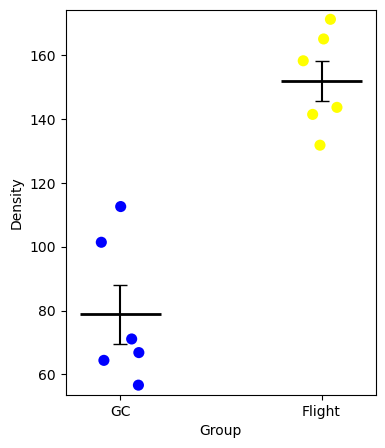

In [47]:
data = pd.DataFrame({
    'Group': ['GC']*len(GC_density) + ['Flight']*len(F_density),
    'Density': pd.concat([GC_density, F_density], axis=0)
})

plt.figure(figsize=(4, 5))
sns.stripplot(x='Group', y='Density', data=data, hue='Group', jitter=True, marker='o', palette=['blue', 'yellow'], size=8, legend=False)

mean_gc_viv = GC_density.mean()
mean_f = F_density.mean()
sem_gc_viv = GC_density.sem()
sem_f = F_density.sem()
plt.errorbar(x=[0, 1], y=[mean_gc_viv, mean_f], yerr=[sem_gc_viv, sem_f], fmt='none', color='black', capsize=5)
plt.hlines(y=mean_gc_viv, xmin=-0.2, xmax=0.2, colors='black', linewidth=2)
plt.hlines(y=mean_f, xmin=0.8, xmax=1.2, colors='black', linewidth=2)

plt.ylim([np.min(GC_density) - 3, np.max(F_density) + 3])
plt.show()

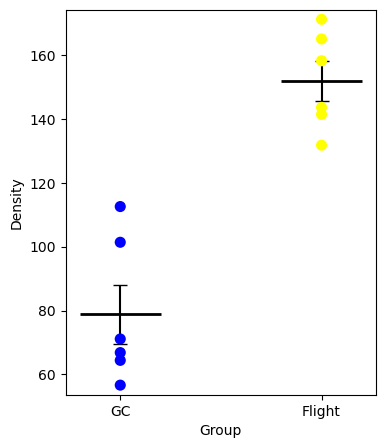

In [123]:
data = pd.DataFrame({
    'Group': ['GC']*len(GC_density) + ['Flight']*len(F_density),
    'Density': pd.concat([GC_density, F_density], axis=0)
})

plt.figure(figsize=(4, 5))
sns.stripplot(x='Group', y='Density', data=data, hue='Group', jitter=False, marker='o', palette=['blue', 'yellow'], size=8, legend=False)

mean_gc_viv = GC_density.mean()
mean_f = F_density.mean()
sem_gc_viv = GC_density.sem()
sem_f = F_density.sem()
plt.errorbar(x=[0, 1], y=[mean_gc_viv, mean_f], yerr=[sem_gc_viv, sem_f], fmt='none', color='black', capsize=5)
plt.hlines(y=mean_gc_viv, xmin=-0.2, xmax=0.2, colors='black', linewidth=2)
plt.hlines(y=mean_f, xmin=0.8, xmax=1.2, colors='black', linewidth=2)

plt.ylim([np.min(GC_density) - 3, np.max(F_density) + 3])
plt.show()

# **OSD_557**

In [2]:
OSD_557 = pd.read_csv('/Users/zhangxiangyu/Desktop/lab/multivariate_analysis/raw_data/OSD_557.csv')

In [7]:
GC = OSD_557.iloc[8:12, :]
F = OSD_557.iloc[0:4, :]

In [9]:
OSD_557

,Source Name,Sample Name,Treatment,Ant-Post,Sup-Inf,Retina,Pigment Layer,Choroid,Sclera,Ant-Post.1,Right-left,Retina.1,Pigment Layer.1,Choroid.1,Sclera.1
0,F10,F10_Mouse_Eye,Flight,1.765000,2.044000,0.077,0.038,0.041000,0.059000,1.748000,1.997000,0.144000,0.051000,0.041000,0.073000
1,F12,F12_Mouse_Eye,Flight,1.724000,2.028000,0.091,0.048,0.036000,0.054000,1.720000,1.980000,0.087000,0.041000,0.039000,0.057000
2,F13,F13_Mouse_Eye,Flight,1.754333,2.043667,0.089,0.044,0.036333,0.054333,1.750333,1.969667,0.113667,0.053667,0.038333,0.065333
3,F14,F14_Mouse_Eye,Flight,1.774000,2.059000,0.099,0.046,0.032000,0.050000,1.783000,1.932000,0.110000,0.069000,0.035000,0.066000
4,V10,V10_Mouse_Eye,Vivarium,1.771000,2.119000,0.145,0.076,0.083000,0.109000,1.755000,2.089000,0.118000,0.055000,0.061000,0.067000
5,V12,V12_Mouse_Eye,Vivarium,1.741000,1.971000,0.102,0.050,0.049000,0.097000,1.752000,1.980000,0.128000,0.059000,0.045000,0.066000
6,V13,V13_Mouse_Eye,Vivarium,1.811000,2.087000,0.093,0.052,0.043000,0.059000,1.700000,1.898000,0.093000,0.050000,0.040000,0.070000
7,V14,V14_Mouse_Eye,Vivarium,1.741000,1.971000,0.093,0.050,0.043000,0.059000,1.700000,1.980000,0.093000,0.050000,0.040000,0.066000
8,GC10,GC10_Mouse_Eye,Ground Control,1.824000,2.043000,0.135,0.050,0.042000,0.096000,1.841000,2.024000,0.119000,0.066000,0.054000,0.093000
9,GC11,GC11_Mouse_Eye,Ground Control,1.771000,2.021000,0.127,0.057,0.050000,0.075000,1.803000,2.059000,0.119000,0.053000,0.046000,0.070000


In [14]:
GC_p = GC['Pigment Layer']
F_p = F['Pigment Layer']

In [16]:
print('The max of GC_p:', np.max(GC_p)) 
print('The max of F_p:', np.max(F_p))
print('The min of GC_p:', np.min(GC_p))
print('The min of F_p:', np.min(F_p))

The max of GC_p: 0.07
The max of F_p: 0.048
The min of GC_p: 0.048
The min of F_p: 0.038


In [18]:
print((GC_p.mean() - F_p.mean())/GC_p.mean())   

0.21777777777777793


In [19]:
print(GC_p.mean())
print(F_p.mean())

0.05625000000000001
0.044


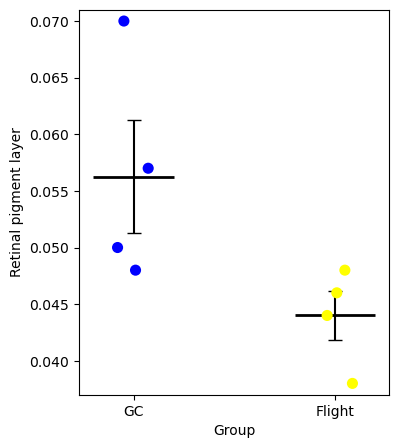

In [17]:
data = pd.DataFrame({
    'Group': ['GC']*len(GC_p) + ['Flight']*len(F_p),
    'Retinal pigment layer': pd.concat([GC_p, F_p], axis=0)
})

plt.figure(figsize=(4, 5))
sns.stripplot(x='Group', y='Retinal pigment layer', data=data, hue='Group', jitter=True, marker='o', palette=['blue', 'yellow'], size=8, legend=False)

mean_gc_viv = GC_p.mean()
mean_f = F_p.mean()
sem_gc_viv = GC_p.sem()
sem_f = F_p.sem()
plt.errorbar(x=[0, 1], y=[mean_gc_viv, mean_f], yerr=[sem_gc_viv, sem_f], fmt='none', color='black', capsize=5)
plt.hlines(y=mean_gc_viv, xmin=-0.2, xmax=0.2, colors='black', linewidth=2)
plt.hlines(y=mean_f, xmin=0.8, xmax=1.2, colors='black', linewidth=2)

plt.ylim([np.min(F_p) - 0.001, np.max(GC_p) + 0.001])
plt.show()

# **Analyze the Relation within the dataset**

In [2]:
bone_modified = pd.read_excel('/Users/zhangxiangyu/Desktop/lab/multivariate_analysis/imputed_data/modified_bone.xlsx')
bone_modified.iloc[:, 2:].columns

Index(['trabecular_separation_millimeter',
       'trabecular_number_1_per_millimeter', 'degree_of_anisotropy',
       'connective_density', 'total_perimeter_millimeter',
       'endocortical_perimeter_millimeter',
       'medullary_area_millimeter_squared', 'eccentricity ',
       'cortical_thickness_millimeter', 'GSK3_beta_content_LSDS-70',
       'serine9_phosphorylated_GSK3_beta_content_LSDS-70',
       'ratio_of_phosphorylated_serine_9_to_total_GSK3_beta_content__LSDS-70'],
      dtype='object')

In [3]:
bone_f = bone_modified.iloc[0:11, 2:]
bone_gc = bone_modified.iloc[11: 22, 2:]

In [52]:
bone_modified

,Unnamed: 0,Sample Name,trabecular_separation_millimeter,trabecular_number_1_per_millimeter,degree_of_anisotropy,connective_density,total_perimeter_millimeter,endocortical_perimeter_millimeter,medullary_area_millimeter_squared,eccentricity,cortical_thickness_millimeter,GSK3_beta_content_LSDS-70,serine9_phosphorylated_GSK3_beta_content_LSDS-70,ratio_of_phosphorylated_serine_9_to_total_GSK3_beta_content__LSDS-70
0,0,RR9_F_F10,0.201433,2.814993,2.067250,0.000392,4.474408,2.784645,0.535799,0.649160,0.184279,0.630699,1.528045,0.845619
1,1,RR9_F_F11,0.198394,2.824698,1.916936,0.000543,4.474436,2.699188,0.594860,0.636512,0.186056,0.429095,1.236799,2.882344
2,2,RR9_F_F12,0.194307,2.571972,1.775078,0.000302,4.461125,2.777842,0.510127,0.635344,0.185204,1.966686,0.377555,0.191975
3,3,RR9_F_F13,0.207373,2.815310,1.997590,0.000421,4.469396,2.862995,0.571723,0.645851,0.186131,0.807538,2.365624,2.929428
4,4,RR9_F_F14,0.190960,2.519631,1.889341,0.000369,4.527711,2.699075,0.570910,0.644678,0.186832,1.234262,1.286460,1.042291
5,5,RR9_F_F15,0.203978,2.894082,1.984385,0.000317,4.453539,2.771635,0.522706,0.644002,0.187759,1.374979,2.190323,1.592986
6,6,RR9_F_F16,0.198000,2.999000,1.943480,0.000470,4.481000,2.817000,0.604000,0.641000,0.185000,1.637892,2.235801,1.365048
7,7,RR9_F_F17,0.188000,3.070000,1.877300,0.000390,4.420000,2.804000,0.557000,0.651000,0.180000,2.548342,1.238734,4.391019
8,8,RR9_F_F18,0.201361,3.158703,1.853442,0.000378,4.459487,2.869860,0.601349,0.647076,0.194178,0.780074,3.047792,0.381863
9,9,RR9_F_F19,0.199000,2.588000,1.865150,0.000330,4.506000,2.856000,0.603000,0.650000,0.183000,0.685860,3.806914,1.689003


In [4]:
ocular = pd.read_excel('/Users/zhangxiangyu/Desktop/lab/multivariate_analysis/imputed_data/ocular/modified_ocular.xlsx')

In [5]:
ocular.iloc[:, 3:].columns

Index(['Left_1', 'Left_2', 'Left_3', 'Avg_Left', 'Right_1', 'Right_2',
       'Right_3', 'Avg_Right', 'Ant-Post', 'Sup-Inf', 'Retina',
       'Pigment Layer', 'Choroid', 'Sclera', 'Ant-Post-left', 'Right-left',
       'Retina-left', 'Pigment Layer-left', 'Choroid-left', 'Sclera-left',
       'totct', 'totarea', 'density', 'Average HNE Fluorescent Intensity',
       'sumcount', 'sumEC', 'sunarea', 'dentotal', 'denEC',
       'LSDS-5_immunostaining_microscopy_Zo-1tr_TRANSFORMED_Average',
       'LSDS-5_immunostaining_microscopy_PECAMtr_TRANSFORMED_Average', 'Total',
       'Total_EC', 'Total_Area', 'Density', 'Density_EC'],
      dtype='object')

In [6]:
ocular_f = ocular.iloc[0:11, 3:]
ocular_gc = ocular.iloc[11:22, 3:]

In [7]:
bone_gc_trab = bone_gc['trabecular_separation_millimeter']
bone_f_trab = bone_f['trabecular_separation_millimeter']
ocular_gc_avg = ocular_gc['Avg_Left']
ocular_f_avg = ocular_f['Avg_Left']

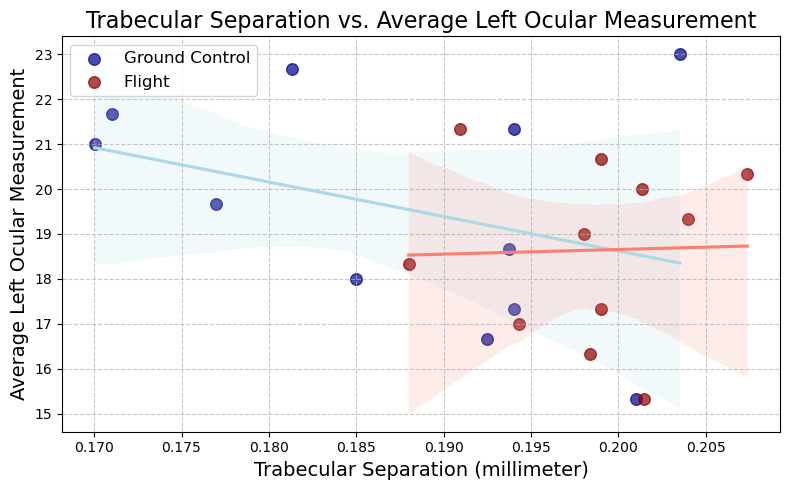

Ground Control - Correlation: -0.3442, p-value: 0.2999
Flight - Correlation: 0.0299, p-value: 0.9304


In [56]:
plt.figure(figsize=(8, 5))

# 绘制 gc 组的散点图和回归线
sns.regplot(x=bone_gc_trab, y=ocular_gc_avg, scatter=True, 
            scatter_kws={"color": "darkblue", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "lightblue"}, 
            label="Ground Control")



# 绘制 f 组的散点图和回归线
sns.regplot(x=bone_f_trab, y=ocular_f_avg, scatter=True, 
            scatter_kws={"color": "darkred", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "salmon"}, 
            label="Flight")

# 设置图表标题和标签
plt.title('Trabecular Separation vs. Average Left Ocular Measurement', fontsize=16)
plt.xlabel('Trabecular Separation (millimeter)', fontsize=14)
plt.ylabel('Average Left Ocular Measurement', fontsize=14)

# 添加图例
plt.legend(fontsize=12)

# 显示网格
plt.grid(True, linestyle='--', alpha=0.7)

# 显示图表
plt.tight_layout()
plt.show()

# 计算相关系数和 p 值
r_gc, p_gc = stats.pearsonr(bone_gc_trab, ocular_gc_avg)
r_f, p_f = stats.pearsonr(bone_f_trab, ocular_f_avg)

print(f"Ground Control - Correlation: {r_gc:.4f}, p-value: {p_gc:.4f}")
print(f"Flight - Correlation: {r_f:.4f}, p-value: {p_f:.4f}")

In [57]:
bone_gc_trab = bone_gc['trabecular_separation_millimeter']
bone_f_trab = bone_f['trabecular_separation_millimeter']
ocular_gc_sup = ocular_gc['Sup-Inf']
ocular_f_sup = ocular_f['Sup-Inf']

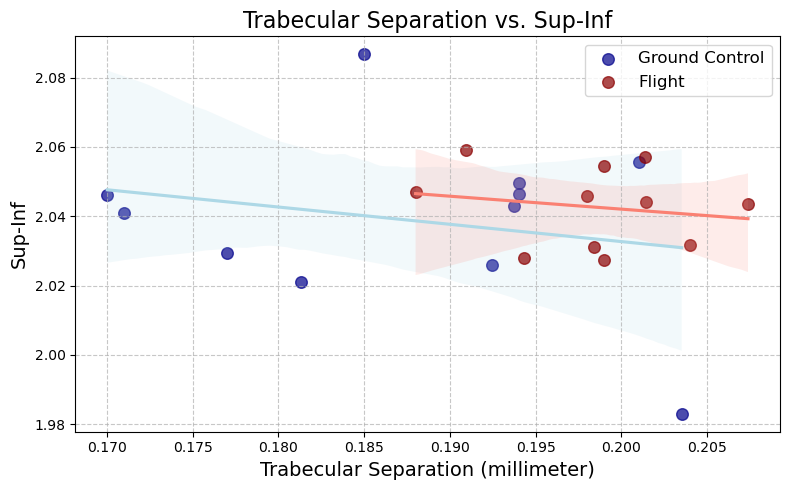

Ground Control - Correlation: -0.2245, p-value: 0.5069
Flight - Correlation: -0.1790, p-value: 0.5985


In [58]:
plt.figure(figsize=(8, 5))

# 绘制 gc 组的散点图和回归线
sns.regplot(x=bone_gc_trab, y=ocular_gc_sup, scatter=True, 
            scatter_kws={"color": "darkblue", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "lightblue"}, 
            label="Ground Control")



# 绘制 f 组的散点图和回归线
sns.regplot(x=bone_f_trab, y=ocular_f_sup, scatter=True, 
            scatter_kws={"color": "darkred", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "salmon"}, 
            label="Flight")

# 设置图表标题和标签
plt.title('Trabecular Separation vs. Sup-Inf', fontsize=16)
plt.xlabel('Trabecular Separation (millimeter)', fontsize=14)
plt.ylabel('Sup-Inf', fontsize=14)

# 添加图例
plt.legend(fontsize=12)

# 显示网格
plt.grid(True, linestyle='--', alpha=0.7)

# 显示图表
plt.tight_layout()
plt.show()

# 计算相关系数和 p 值
r_gc, p_gc = stats.pearsonr(bone_gc_trab, ocular_gc_sup)
r_f, p_f = stats.pearsonr(bone_f_trab, ocular_f_sup)

print(f"Ground Control - Correlation: {r_gc:.4f}, p-value: {p_gc:.4f}")
print(f"Flight - Correlation: {r_f:.4f}, p-value: {p_f:.4f}")

In [59]:
bone_gc_trab = bone_gc['trabecular_separation_millimeter']
bone_f_trab = bone_f['trabecular_separation_millimeter']
ocular_gc_sup = ocular_gc['Pigment Layer-left']
ocular_f_sup = ocular_f['Pigment Layer-left']

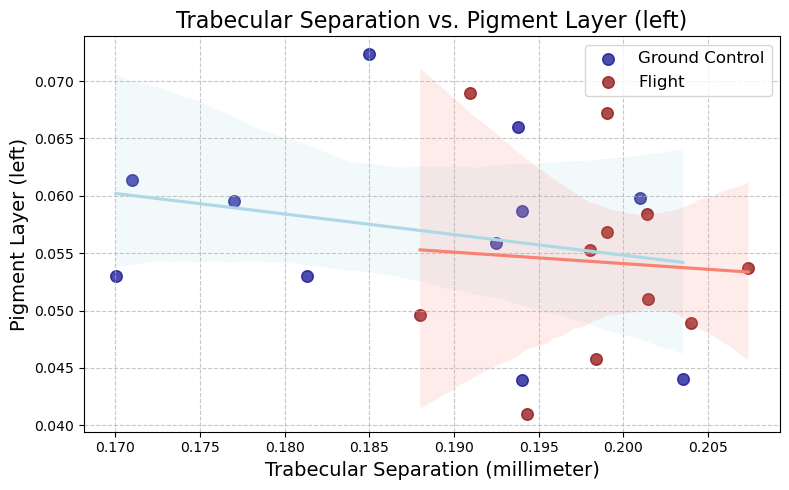

Ground Control - Correlation: -0.2420, p-value: 0.4734
Flight - Correlation: -0.0656, p-value: 0.8481


In [60]:
plt.figure(figsize=(8, 5))

# 绘制 gc 组的散点图和回归线
sns.regplot(x=bone_gc_trab, y=ocular_gc_sup, scatter=True, 
            scatter_kws={"color": "darkblue", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "lightblue"}, 
            label="Ground Control")

# 绘制 f 组的散点图和回归线
sns.regplot(x=bone_f_trab, y=ocular_f_sup, scatter=True, 
            scatter_kws={"color": "darkred", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "salmon"}, 
            label="Flight")

# 设置图表标题和标签
plt.title('Trabecular Separation vs. Pigment Layer (left)', fontsize=16)
plt.xlabel('Trabecular Separation (millimeter)', fontsize=14)
plt.ylabel('Pigment Layer (left)', fontsize=14)

# 添加图例
plt.legend(fontsize=12)

# 显示网格
plt.grid(True, linestyle='--', alpha=0.7)

# 显示图表
plt.tight_layout()
plt.show()

# 计算相关系数和 p 值
r_gc, p_gc = stats.pearsonr(bone_gc_trab, ocular_gc_sup)
r_f, p_f = stats.pearsonr(bone_f_trab, ocular_f_sup)

print(f"Ground Control - Correlation: {r_gc:.4f}, p-value: {p_gc:.4f}")
print(f"Flight - Correlation: {r_f:.4f}, p-value: {p_f:.4f}")

In [61]:
bone_gc_trab = bone_gc['trabecular_separation_millimeter']
bone_f_trab = bone_f['trabecular_separation_millimeter']
ocular_gc_sup = ocular_gc['density']
ocular_f_sup = ocular_f['density']

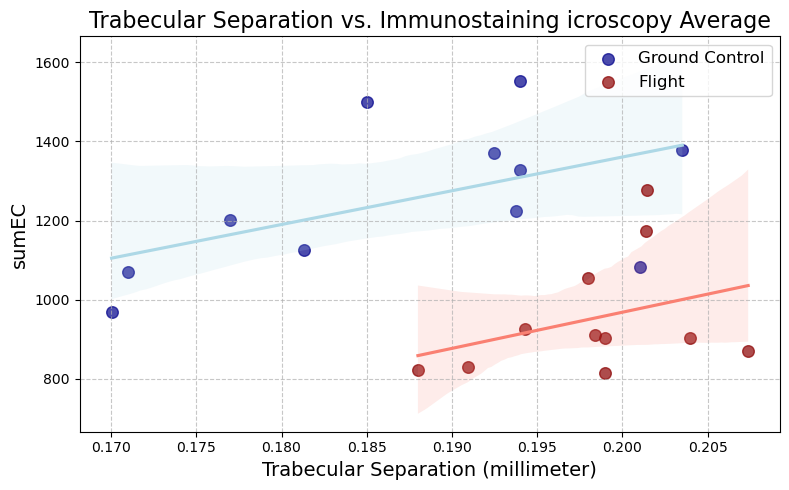

Ground Control - Correlation: 0.5251, p-value: 0.0972
Flight - Correlation: 0.3369, p-value: 0.3110


In [62]:
plt.figure(figsize=(8, 5))

# 绘制 gc 组的散点图和回归线
sns.regplot(x=bone_gc_trab, y=ocular_gc_sup, scatter=True, 
            scatter_kws={"color": "darkblue", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "lightblue"}, 
            label="Ground Control")

# 绘制 f 组的散点图和回归线
sns.regplot(x=bone_f_trab, y=ocular_f_sup, scatter=True, 
            scatter_kws={"color": "darkred", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "salmon"}, 
            label="Flight")

# 设置图表标题和标签
plt.title('Trabecular Separation vs. Immunostaining icroscopy Average', fontsize=16)
plt.xlabel('Trabecular Separation (millimeter)', fontsize=14)
plt.ylabel('sumEC', fontsize=14)

# 添加图例
plt.legend(fontsize=12)

# 显示网格
plt.grid(True, linestyle='--', alpha=0.7)

# 显示图表
plt.tight_layout()
plt.show()

# 计算相关系数和 p 值
r_gc, p_gc = stats.pearsonr(bone_gc_trab, ocular_gc_sup)
r_f, p_f = stats.pearsonr(bone_f_trab, ocular_f_sup)

print(f"Ground Control - Correlation: {r_gc:.4f}, p-value: {p_gc:.4f}")
print(f"Flight - Correlation: {r_f:.4f}, p-value: {p_f:.4f}")

In [93]:
bone_gc_trab = bone_gc['total_perimeter_millimeter']
bone_f_trab = bone_f['total_perimeter_millimeter']
ocular_gc_avg = ocular_gc['LSDS-5_immunostaining_microscopy_PECAMtr_TRANSFORMED_Average']
ocular_f_avg = ocular_f['LSDS-5_immunostaining_microscopy_PECAMtr_TRANSFORMED_Average']

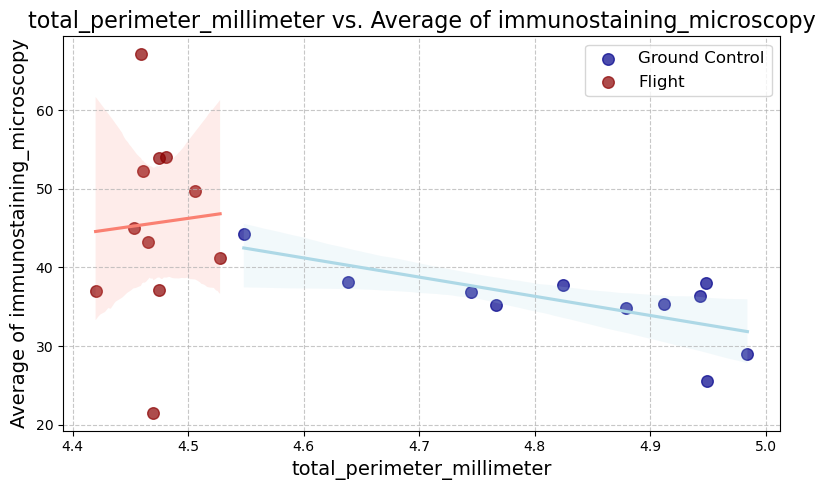

Ground Control - Correlation: -0.7077, p-value: 0.0148
Flight - Correlation: 0.0488, p-value: 0.8866


In [94]:
plt.figure(figsize=(8, 5))

# 绘制 gc 组的散点图和回归线
sns.regplot(x=bone_gc_trab, y=ocular_gc_avg, scatter=True, 
            scatter_kws={"color": "darkblue", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "lightblue"}, 
            label="Ground Control")

# 绘制 f 组的散点图和回归线
sns.regplot(x=bone_f_trab, y=ocular_f_avg, scatter=True, 
            scatter_kws={"color": "darkred", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "salmon"}, 
            label="Flight")

# 设置图表标题和标签
plt.title('total_perimeter_millimeter vs. Average of immunostaining_microscopy', fontsize=16)
plt.xlabel('total_perimeter_millimeter', fontsize=14)
plt.ylabel('Average of immunostaining_microscopy', fontsize=14)

# 添加图例
plt.legend(fontsize=12)

# 显示网格
plt.grid(True, linestyle='--', alpha=0.7)

# 0
plt.tight_layout()
plt.show()

# 计算相关系数和 p 值
r_gc, p_gc = stats.pearsonr(bone_gc_trab, ocular_gc_avg)
r_f, p_f = stats.pearsonr(bone_f_trab, ocular_f_avg)

print(f"Ground Control - Correlation: {r_gc:.4f}, p-value: {p_gc:.4f}")
print(f"Flight - Correlation: {r_f:.4f}, p-value: {p_f:.4f}")

In [35]:
muscle = pd.read_excel('/Users/zhangxiangyu/Desktop/lab/multivariate_analysis/imputed_data/muscle_modified.xlsx')

In [39]:
muscle.columns

Index(['Sample Name', 'GSK3_beta_content',
       'serine9_phosphorylated_GSK3_beta_content',
       'ratio_of_phosphorylated_serine_9_to_total_GSK3_beta_content_',
       'GSK3_alpha_content', 'serine_21_phosphorylated_GSK3_alpha_content',
       'ratio_of_serine_21_phosphorylated_to_total_GSK3_alpha_content',
       'mhc_i', 'mhc_iia', 'mhc_iix', 'mhc_iib',
       'serine9_phosphorylated_GSK3_beta_content_LSDS-68',
       'ratio_of_phosphorylated_serine_9_to_total_GSK3_beta_content__LSDS-68',
       'GSK3_alpha_content_LSDS-68',
       'serine_21_phosphorylated_GSK3_alpha_content_LSDS-68',
       'ratio_of_serine_21_phosphorylated_to_total_GSK3_alpha_content_LSDS-68'],
      dtype='object')

In [49]:
muscle

,Sample Name,GSK3_beta_content,serine9_phosphorylated_GSK3_beta_content,ratio_of_phosphorylated_serine_9_to_total_GSK3_beta_content_,GSK3_alpha_content,serine_21_phosphorylated_GSK3_alpha_content,ratio_of_serine_21_phosphorylated_to_total_GSK3_alpha_content,mhc_i,mhc_iia,mhc_iix,mhc_iib,serine9_phosphorylated_GSK3_beta_content_LSDS-68,ratio_of_phosphorylated_serine_9_to_total_GSK3_beta_content__LSDS-68,GSK3_alpha_content_LSDS-68,serine_21_phosphorylated_GSK3_alpha_content_LSDS-68,ratio_of_serine_21_phosphorylated_to_total_GSK3_alpha_content_LSDS-68
0,RR9_F_F10,0.654140,0.907465,0.838390,0.074955,0.523606,0.028951,1.141923,0.147533,7.007370,1.851307,0.796932,0.825468,0.935660,0.797413,0.708533
1,RR9_F_F11,0.714231,0.653553,0.915045,0.010022,1.068536,0.516380,0.582298,0.105617,7.887740,2.758820,0.899609,0.691205,1.047886,0.501074,0.478176
2,RR9_F_F12,0.654187,0.610679,0.933493,0.028829,0.739330,2.132197,0.971928,0.181133,5.149855,3.152901,0.832640,0.988471,1.994558,0.715402,0.358677
3,RR9_F_F13,0.740907,0.441620,0.596054,0.029234,1.405125,3.996296,0.996513,0.071185,2.570080,3.769309,1.024036,1.004846,1.656985,0.687672,0.415014
4,RR9_F_F14,0.656093,0.529965,0.807759,0.046275,1.512131,2.716864,1.219773,0.215183,0.982972,3.503549,0.945750,1.342394,0.910369,0.465586,0.511426
5,RR9_F_F15,0.615391,0.800520,1.300831,0.058235,0.477065,15.195593,0.802055,0.058841,3.974226,1.049854,0.509642,0.642301,0.308005,1.383460,0.708533
6,RR9_F_F16,0.570637,0.704529,1.234636,0.366569,1.185702,0.051369,0.846318,0.163158,7.879373,1.765584,0.510196,0.658198,0.593182,1.354594,2.283608
7,RR9_F_F17,0.518468,0.561261,1.082538,0.894261,0.766449,0.071260,0.914165,0.571296,5.057480,1.565483,0.361020,0.659962,0.773919,1.080354,1.395952
8,RR9_F_F18,0.585565,0.756815,1.292453,0.702275,0.248786,0.029454,1.049979,0.472495,3.330931,2.095444,0.515692,0.652087,0.628288,0.826167,1.314950
9,RR9_F_F19,0.923811,0.455379,0.492935,0.377382,0.393926,0.086788,0.848007,0.098082,3.071147,8.109870,1.909307,0.963501,1.249853,0.325526,0.260451


In [95]:
muscle_f = muscle.iloc[0:11, 1:]
muscle_gc = muscle.iloc[11: 22, 1:]

In [104]:
bone_gc_trab = bone_gc['serine9_phosphorylated_GSK3_beta_content_LSDS-70']
bone_f_trab = bone_f['serine9_phosphorylated_GSK3_beta_content_LSDS-70']
muscle_gc_avg = muscle_gc['GSK3_beta_content']
muscle_f_avg = muscle_f['GSK3_beta_content']

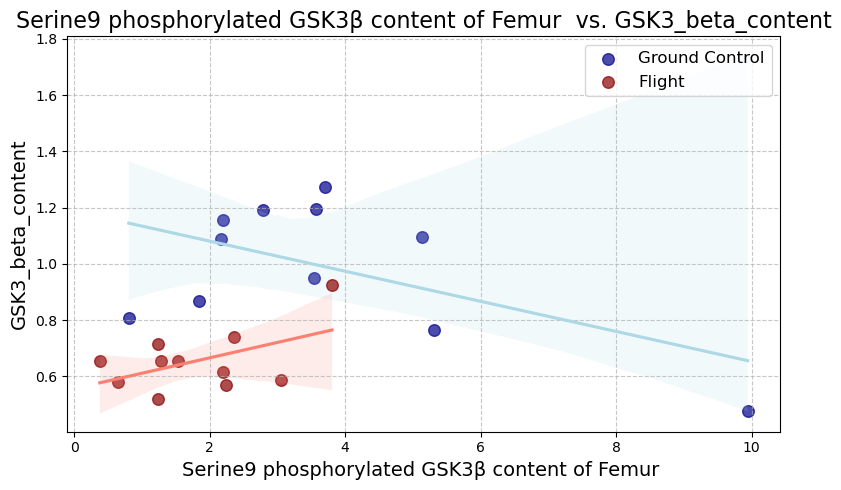

Ground Control - Correlation: -0.5506, p-value: 0.0792
Flight - Correlation: 0.5120, p-value: 0.1074


In [105]:
plt.figure(figsize=(8, 5))

# 绘制 gc 组的散点图和回归线
sns.regplot(x=bone_gc_trab, y=muscle_gc_avg, scatter=True, 
            scatter_kws={"color": "darkblue", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "lightblue"}, 
            label="Ground Control")

# 绘制 f 组的散点图和回归线
sns.regplot(x=bone_f_trab, y=muscle_f_avg, scatter=True, 
            scatter_kws={"color": "darkred", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "salmon"}, 
            label="Flight")

# 设置图表标题和标签
plt.title('Serine9 phosphorylated GSK3β content of Femur  vs. GSK3_beta_content', fontsize=16)
plt.xlabel('Serine9 phosphorylated GSK3β content of Femur ', fontsize=14)
plt.ylabel('GSK3_beta_content', fontsize=14)

# 添加图例
plt.legend(fontsize=12)

# 显示网格
plt.grid(True, linestyle='--', alpha=0.7)

# 0
plt.tight_layout()
plt.show()

# 计算相关系数和 p 值
r_gc, p_gc = stats.pearsonr(bone_gc_trab, muscle_gc_avg)
r_f, p_f = stats.pearsonr(bone_f_trab, muscle_f_avg)

print(f"Ground Control - Correlation: {r_gc:.4f}, p-value: {p_gc:.4f}")
print(f"Flight - Correlation: {r_f:.4f}, p-value: {p_f:.4f}")

In [50]:
ocular_gc_sup = ocular_gc['density']
ocular_f_sup = ocular_f['density']
muscle_gc_avg = muscle_gc['ratio_of_phosphorylated_serine_9_to_total_GSK3_beta_content__LSDS-68']
muscle_f_avg = muscle_f['ratio_of_phosphorylated_serine_9_to_total_GSK3_beta_content__LSDS-68']

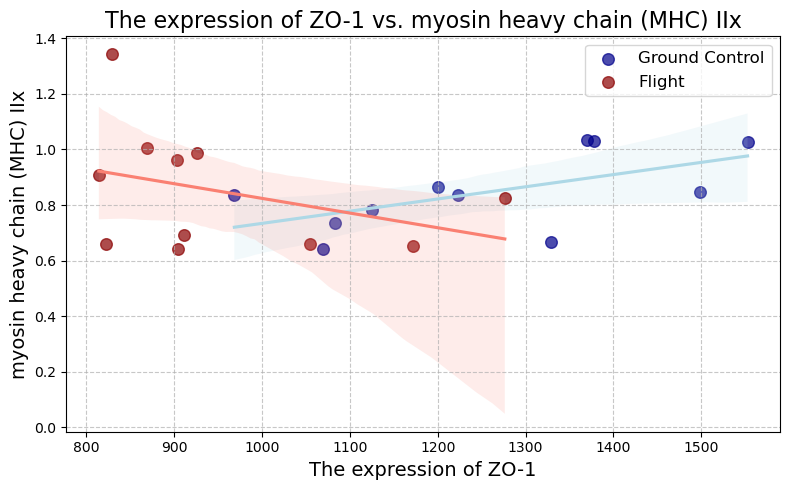

Ground Control - Correlation: 0.5890, p-value: 0.0566
Flight - Correlation: -0.3638, p-value: 0.2714


In [51]:
plt.figure(figsize=(8, 5))

# 绘制 gc 组的散点图和回归线
sns.regplot(x=ocular_gc_sup, y=muscle_gc_avg, scatter=True, 
            scatter_kws={"color": "darkblue", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "lightblue"}, 
            label="Ground Control")

# 绘制 f 组的散点图和回归线
sns.regplot(x=ocular_f_sup, y=muscle_f_avg, scatter=True, 
            scatter_kws={"color": "darkred", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "salmon"}, 
            label="Flight")

# 设置图表标题和标签
plt.title('The expression of ZO-1 vs. myosin heavy chain (MHC) IIx', fontsize=16)
plt.xlabel('The expression of ZO-1', fontsize=14)
plt.ylabel('myosin heavy chain (MHC) IIx', fontsize=14)

# 添加图例
plt.legend(fontsize=12)

# 显示网格
plt.grid(True, linestyle='--', alpha=0.7)

# 0
plt.tight_layout()
plt.show()

# 计算相关系数和 p 值
r_gc, p_gc = stats.pearsonr(ocular_gc_sup, muscle_gc_avg)
r_f, p_f = stats.pearsonr(ocular_f_sup, muscle_f_avg)

print(f"Ground Control - Correlation: {r_gc:.4f}, p-value: {p_gc:.4f}")
print(f"Flight - Correlation: {r_f:.4f}, p-value: {p_f:.4f}")

# **Bayesian Analysis**

In [8]:
bone_gc_trab = bone_gc['total_perimeter_millimeter']
bone_f_trab = bone_f['total_perimeter_millimeter']
ocular_gc_avg = ocular_gc['Pigment Layer-left']
ocular_f_avg = ocular_f['Pigment Layer-left']

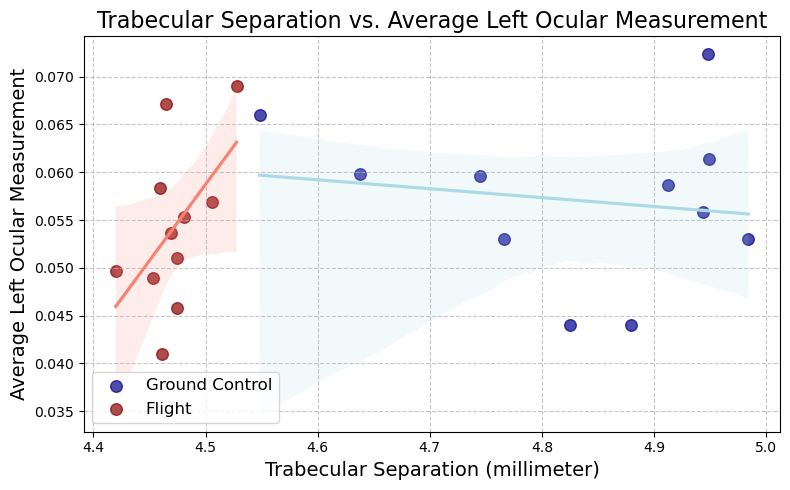

Ground Control - Correlation: -0.1551, p-value: 0.6488
Flight - Correlation: 0.5235, p-value: 0.0984


In [74]:
plt.figure(figsize=(8, 5))

# 绘制 gc 组的散点图和回归线
sns.regplot(x=bone_gc_trab, y=ocular_gc_avg, scatter=True, 
            scatter_kws={"color": "darkblue", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "lightblue"}, 
            label="Ground Control")



# 绘制 f 组的散点图和回归线
sns.regplot(x=bone_f_trab, y=ocular_f_avg, scatter=True, 
            scatter_kws={"color": "darkred", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "salmon"}, 
            label="Flight")

# 设置图表标题和标签
plt.title('Trabecular Separation vs. Average Left Ocular Measurement', fontsize=16)
plt.xlabel('Trabecular Separation (millimeter)', fontsize=14)
plt.ylabel('Average Left Ocular Measurement', fontsize=14)

# 添加图例
plt.legend(fontsize=12)

# 显示网格
plt.grid(True, linestyle='--', alpha=0.7)

# 显示图表
plt.tight_layout()
plt.show()

# 计算相关系数和 p 值
r_gc, p_gc = stats.pearsonr(bone_gc_trab, ocular_gc_avg)
r_f, p_f = stats.pearsonr(bone_f_trab, ocular_f_avg)

print(f"Ground Control - Correlation: {r_gc:.4f}, p-value: {p_gc:.4f}")
print(f"Flight - Correlation: {r_f:.4f}, p-value: {p_f:.4f}")

In [9]:
import pymc as pm
import numpy as np
import matplotlib.pyplot as plt
import arviz as az

In [12]:
bone_gc_trab = bone_gc['total_perimeter_millimeter'].values
bone_f_trab = bone_f['total_perimeter_millimeter'].values
ocular_gc_avg = ocular_gc['sumEC'].values
ocular_f_avg = ocular_f['sumEC'].values

data_gc = np.vstack([bone_gc_trab, ocular_gc_avg]).T
data_f = np.vstack([bone_f_trab, ocular_f_avg]).T

In [9]:
print(data_gc.shape)
print(data_f.shape)

(11, 2)
(11, 2)


### Inverse Wishart Variance 

In [11]:
from sklearn.preprocessing import StandardScaler

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_gc, mu_f, chol_gc, chol_f]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 10 seconds.


               mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
mu_gc[0]     -0.001  0.341  -0.660    0.640      0.004    0.004    8129.0   
mu_gc[1]      0.002  0.344  -0.641    0.678      0.004    0.004    8785.0   
mu_f[0]       0.001  0.334  -0.622    0.623      0.004    0.004    8826.0   
mu_f[1]       0.011  0.338  -0.602    0.666      0.003    0.004    9420.0   
cov_gc[0, 0]  1.526  0.863   0.474    3.012      0.012    0.009    8782.0   
cov_gc[0, 1] -0.109  0.407  -0.878    0.665      0.005    0.004    6745.0   
cov_gc[1, 0] -0.109  0.407  -0.878    0.665      0.005    0.004    6745.0   
cov_gc[1, 1]  1.535  0.845   0.422    3.034      0.011    0.008    7105.0   
cov_f[0, 0]   1.423  0.789   0.434    2.782      0.010    0.009    8848.0   
cov_f[0, 1]   0.389  0.398  -0.317    1.154      0.005    0.004    8611.0   
cov_f[1, 0]   0.389  0.398  -0.317    1.154      0.005    0.004    8611.0   
cov_f[1, 1]   1.426  0.845   0.442    2.711      0.012    0.008    6601.0   

array([[<Axes: title={'center': 'cov_gc\n0, 0'}>,
        <Axes: title={'center': 'cov_gc\n0, 1'}>,
        <Axes: title={'center': 'cov_gc\n1, 0'}>,
        <Axes: title={'center': 'cov_gc\n1, 1'}>],
       [<Axes: title={'center': 'cov_f\n0, 0'}>,
        <Axes: title={'center': 'cov_f\n0, 1'}>,
        <Axes: title={'center': 'cov_f\n1, 0'}>,
        <Axes: title={'center': 'cov_f\n1, 1'}>]], dtype=object)

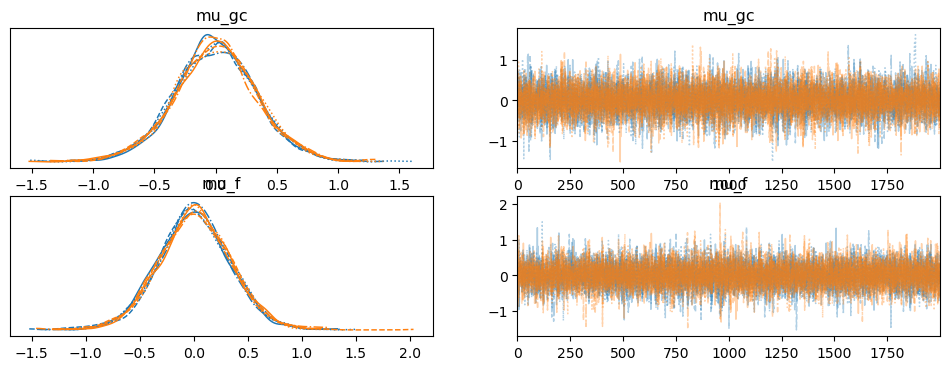

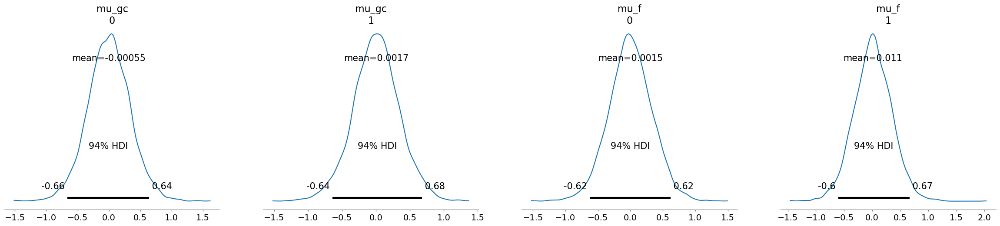

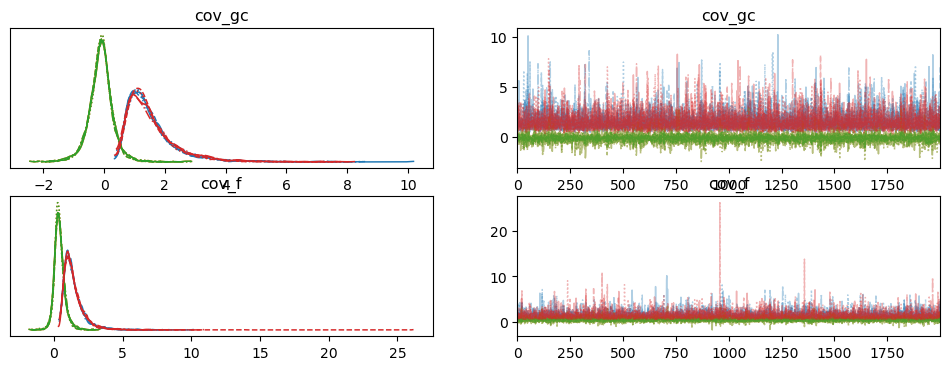

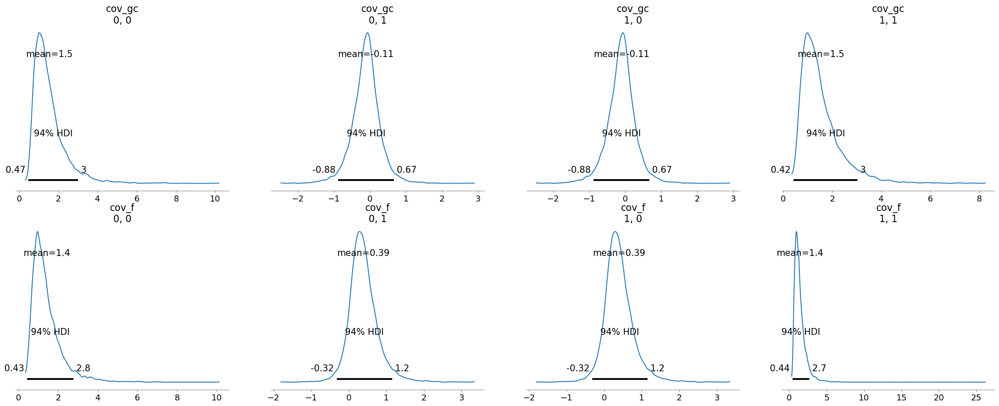

In [18]:
n_features = 2
n_chains = 4  
n_draws = 2000


scaler = StandardScaler()
data_gc = scaler.fit_transform(np.vstack([bone_gc_trab, ocular_gc_avg]).T)
data_f = scaler.fit_transform(np.vstack([bone_f_trab, ocular_f_avg]).T)
# Creating the model
with pm.Model() as model:
    # Mean priors based on data mean and standard deviation
    mu_gc = pm.Normal('mu_gc', mu=np.mean(data_gc, axis=0), sigma=np.std(data_gc, axis=0), shape=n_features)
    mu_f = pm.Normal('mu_f', mu=np.mean(data_f, axis=0), sigma=np.std(data_f, axis=0), shape=n_features)
    
    # Defining the covariance matrix prior using LKJCholeskyCov
    # LKJCholeskyCov prior parameters
    sd_dist = pm.HalfCauchy.dist(beta=2.5, shape=n_features)

    # For GC group
    chol_gc, corr_gc, stds_gc = pm.LKJCholeskyCov(
        'chol_gc', n=n_features, eta=4, sd_dist=sd_dist, compute_corr=True
    )
    cov_gc = pm.Deterministic('cov_gc', chol_gc @ chol_gc.T)

    # For F group
    chol_f, corr_f, stds_f = pm.LKJCholeskyCov(
        'chol_f', n=n_features, eta=4, sd_dist=sd_dist, compute_corr=True
    )
    cov_f = pm.Deterministic('cov_f', chol_f @ chol_f.T)

    # Defining the likelihood using the covariance matrix from the LKJCholeskyCov
    likelihood_gc = pm.MvNormal('likelihood_gc', mu=mu_gc, chol=chol_gc, observed=data_gc)
    likelihood_f = pm.MvNormal('likelihood_f', mu=mu_f, chol=chol_f, observed=data_f)

    # MCMC sampling using the NUTS sampler
    trace = pm.sample(draws=2000, tune=1000, chains=n_chains, return_inferencedata=True)

# Print summary statistics
print(az.summary(trace, var_names=['mu_gc', 'mu_f', 'cov_gc', 'cov_f']))

# Visualize the results
az.plot_trace(trace, var_names=['mu_gc', 'mu_f'])
az.plot_posterior(trace, var_names=['mu_gc', 'mu_f'])
az.plot_trace(trace, var_names=['cov_gc', 'cov_f'])
az.plot_posterior(trace, var_names=['cov_gc', 'cov_f'])

In [19]:
cov_gc_samples = trace.posterior['cov_gc'].values
cov_f_samples = trace.posterior['cov_f'].values

cov_gc_mean = cov_gc_samples.mean(axis=(0, 1)) 
cov_f_mean = cov_f_samples.mean(axis=(0, 1))

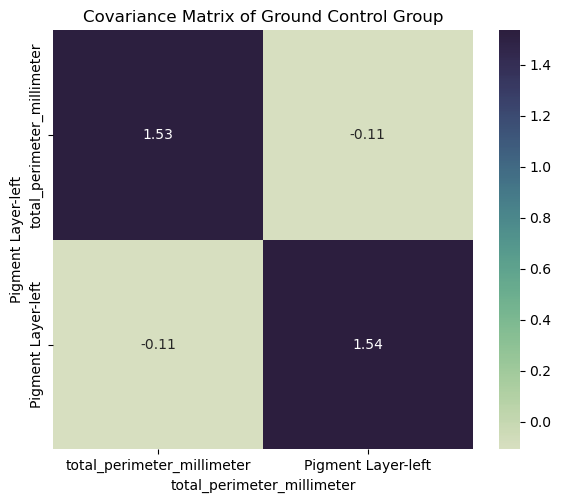

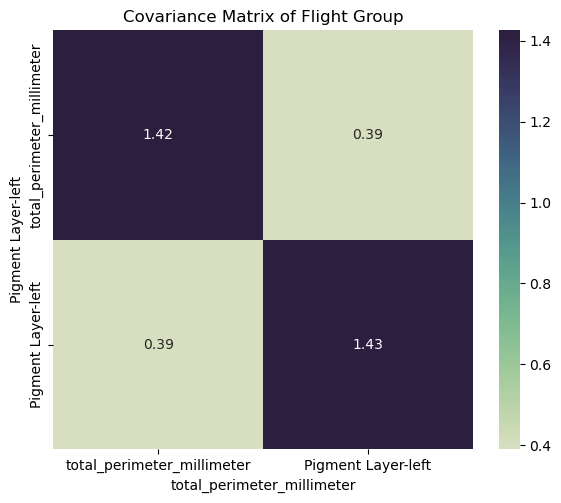

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# 创建自定义的 cubehelix 颜色映射
colors = sns.cubehelix_palette(start=0.5, rot=-0.75, as_cmap=True)
n_bins = 100
color_array = colors(np.linspace(0, 1, n_bins))
color_array[:, 3] = 1.0  # 设置 alpha 通道为不透明
custom_cmap = LinearSegmentedColormap.from_list("custom_cubehelix", color_array)

feature_names = ['total_perimeter_millimeter', 'Pigment Layer-left']

# 绘制 GC 组的协方差矩阵热力图
plt.figure(figsize=(6, 5))
sns.heatmap(cov_gc_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Covariance Matrix of Ground Control Group')
plt.xlabel('total_perimeter_millimeter')
plt.ylabel('Pigment Layer-left')
plt.tight_layout()
plt.show()

# 绘制 F 组的协方差矩阵热力图
plt.figure(figsize=(6, 5))
sns.heatmap(cov_f_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Covariance Matrix of Flight Group')
plt.xlabel('total_perimeter_millimeter')
plt.ylabel('Pigment Layer-left')
plt.tight_layout()
plt.show()

## To capture the correlation difference 

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_gc, mu_f, chol_gc, chol_f]


Output()

/Users/zhangxiangyu/miniconda3/envs/pymc_env/lib/python3.12/site-packages/pytensor/compile/function/types.py:970: RuntimeWarning: invalid value encountered in accumulate
  self.vm()


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 10 seconds.


               mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
mu_gc[0]     -0.006  0.346  -0.705    0.627      0.004    0.004    9623.0   
mu_gc[1]     -0.005  0.339  -0.661    0.629      0.003    0.004   10119.0   
mu_f[0]       0.001  0.326  -0.592    0.637      0.003    0.004    9051.0   
mu_f[1]      -0.006  0.328  -0.646    0.603      0.003    0.004    9416.0   
cov_gc[0, 0]  1.552  0.926   0.442    3.000      0.013    0.011    9324.0   
cov_gc[0, 1]  0.017  0.401  -0.714    0.807      0.005    0.005    8599.0   
cov_gc[1, 0]  0.017  0.401  -0.714    0.807      0.005    0.005    8599.0   
cov_gc[1, 1]  1.537  0.859   0.440    3.003      0.011    0.008    6838.0   
cov_f[0, 0]   1.463  0.807   0.443    2.866      0.010    0.007    9047.0   
cov_f[0, 1]  -0.307  0.395  -1.064    0.412      0.005    0.004    7879.0   
cov_f[1, 0]  -0.307  0.395  -1.064    0.412      0.005    0.004    7879.0   
cov_f[1, 1]   1.450  0.783   0.455    2.801      0.010    0.007    7786.0   

array([[<Axes: title={'center': 'cov_gc\n0, 0'}>,
        <Axes: title={'center': 'cov_gc\n0, 1'}>,
        <Axes: title={'center': 'cov_gc\n1, 0'}>],
       [<Axes: title={'center': 'cov_gc\n1, 1'}>,
        <Axes: title={'center': 'cov_f\n0, 0'}>,
        <Axes: title={'center': 'cov_f\n0, 1'}>],
       [<Axes: title={'center': 'cov_f\n1, 0'}>,
        <Axes: title={'center': 'cov_f\n1, 1'}>,
        <Axes: title={'center': 'corr_diff'}>]], dtype=object)

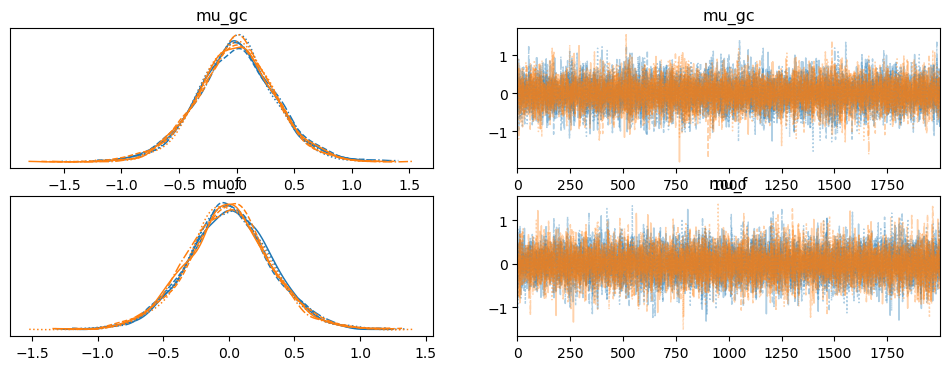

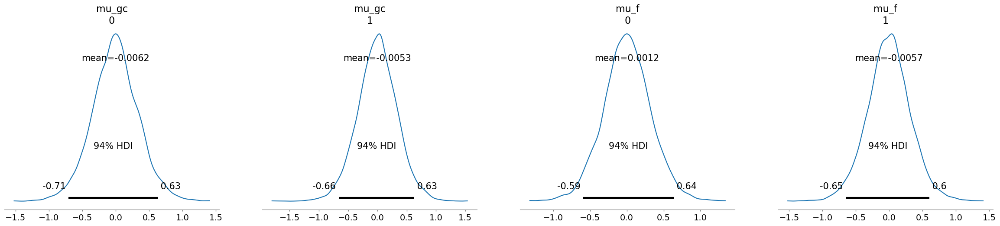

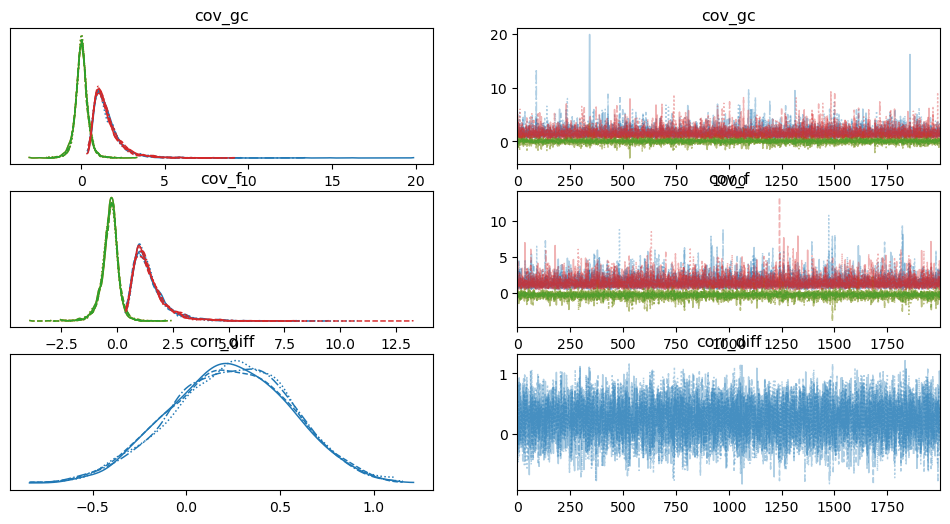

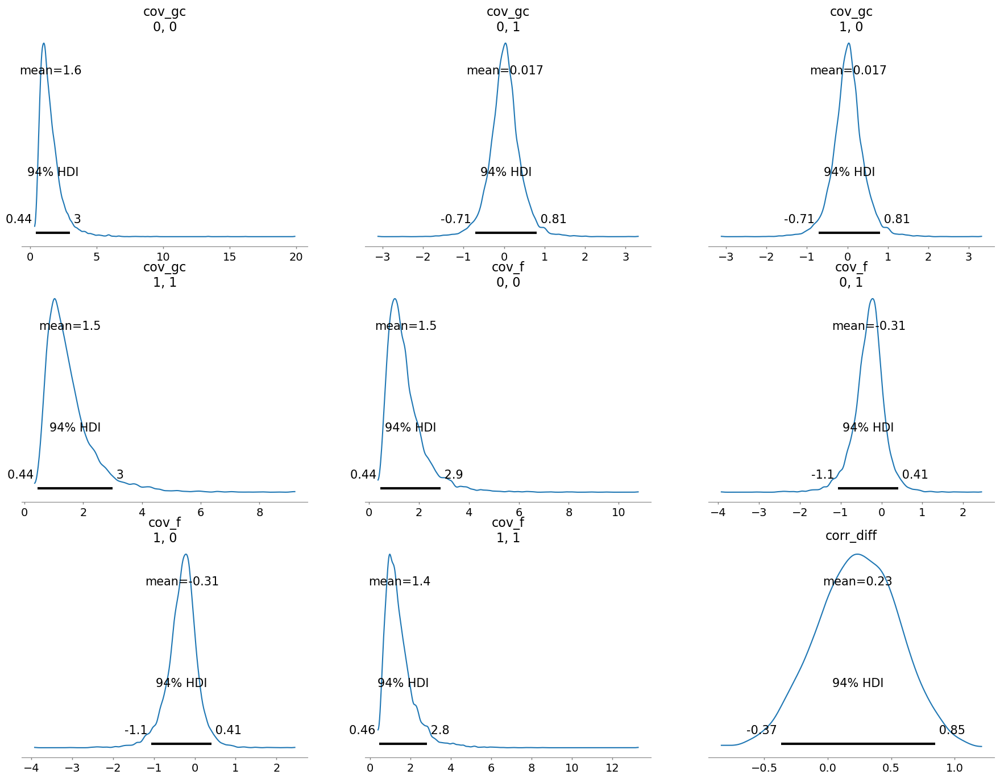

In [26]:
# Creating the model
n_features = 2
n_chains = 4  
n_draws = 2000


scaler = StandardScaler()
data_gc = scaler.fit_transform(np.vstack([bone_gc_trab, ocular_gc_avg]).T)
data_f = scaler.fit_transform(np.vstack([bone_f_trab, ocular_f_avg]).T)

with pm.Model() as model:
    # Mean priors based on data mean and standard deviation
    mu_gc = pm.Normal('mu_gc', mu=np.mean(data_gc, axis=0), sigma=np.std(data_gc, axis=0), shape=n_features)
    mu_f = pm.Normal('mu_f', mu=np.mean(data_f, axis=0), sigma=np.std(data_f, axis=0), shape=n_features)
    
    # Defining the covariance matrix prior using LKJCholeskyCov
    sd_dist = pm.HalfCauchy.dist(beta=2.5, shape=n_features)

    # For GC group
    chol_gc, corr_gc, stds_gc = pm.LKJCholeskyCov(
        'chol_gc', n=n_features, eta=4, sd_dist=sd_dist, compute_corr=True
    )
    cov_gc = pm.Deterministic('cov_gc', chol_gc @ chol_gc.T)

    # For F group
    chol_f, corr_f, stds_f = pm.LKJCholeskyCov(
        'chol_f', n=n_features, eta=4, sd_dist=sd_dist, compute_corr=True
    )
    cov_f = pm.Deterministic('cov_f', chol_f @ chol_f.T)

    # Compute the difference between the off-diagonal correlations
    corr_diff = pm.Deterministic('corr_diff', corr_gc[0, 1] - corr_f[0, 1])

    # Defining the likelihood using the covariance matrix from the LKJCholeskyCov
    likelihood_gc = pm.MvNormal('likelihood_gc', mu=mu_gc, chol=chol_gc, observed=data_gc)
    likelihood_f = pm.MvNormal('likelihood_f', mu=mu_f, chol=chol_f, observed=data_f)

    # MCMC sampling using the NUTS sampler
    trace = pm.sample(draws=2000, tune=1000, chains=n_chains, return_inferencedata=True)

# Print summary statistics, including the difference in correlations
print(az.summary(trace, var_names=['mu_gc', 'mu_f', 'cov_gc', 'cov_f', 'corr_diff']))

# Visualize the results
az.plot_trace(trace, var_names=['mu_gc', 'mu_f'])
az.plot_posterior(trace, var_names=['mu_gc', 'mu_f'])
az.plot_trace(trace, var_names=['cov_gc', 'cov_f', 'corr_diff'])
az.plot_posterior(trace, var_names=['cov_gc', 'cov_f', 'corr_diff'])


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_gc, mu_f, chol_gc, chol_f]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 11 seconds.


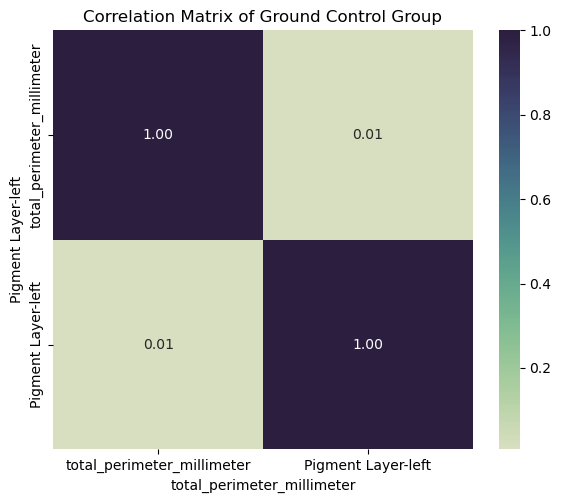

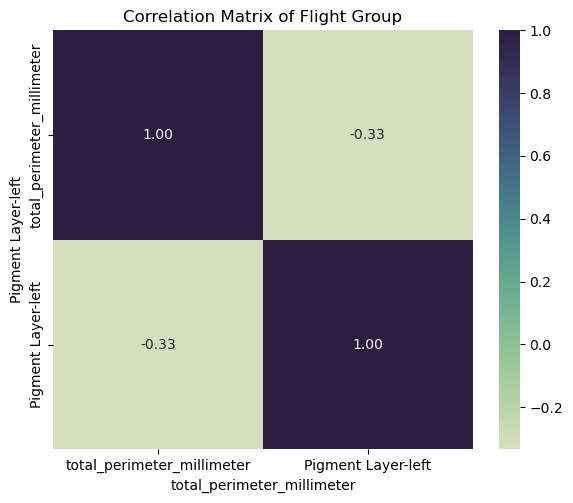

/Users/zhangxiangyu/miniconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:592: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/zhangxiangyu/miniconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:592: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                       mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  \
mu_gc[0]             -0.007  0.344  -0.660    0.654      0.004    0.004   
mu_gc[1]              0.000  0.338  -0.627    0.653      0.004    0.004   
mu_f[0]               0.005  0.343  -0.654    0.637      0.004    0.004   
mu_f[1]              -0.004  0.342  -0.651    0.650      0.004    0.004   
corr_gc_matrix[0, 0]  1.000  0.000   1.000    1.000      0.000    0.000   
corr_gc_matrix[0, 1]  0.007  0.233  -0.408    0.455      0.002    0.003   
corr_gc_matrix[1, 0]  0.007  0.233  -0.408    0.455      0.002    0.003   
corr_gc_matrix[1, 1]  1.000  0.000   1.000    1.000      0.000    0.000   
corr_f_matrix[0, 0]   1.000  0.000   1.000    1.000      0.000    0.000   
corr_f_matrix[0, 1]  -0.334  0.269  -0.762    0.215      0.003    0.002   
corr_f_matrix[1, 0]  -0.334  0.269  -0.762    0.215      0.003    0.002   
corr_f_matrix[1, 1]   1.000  0.000   1.000    1.000      0.000    0.000   
corr_diff             0.3

array([<Axes: title={'center': 'mu_gc\n0'}>,
       <Axes: title={'center': 'mu_gc\n1'}>,
       <Axes: title={'center': 'mu_f\n0'}>,
       <Axes: title={'center': 'mu_f\n1'}>], dtype=object)

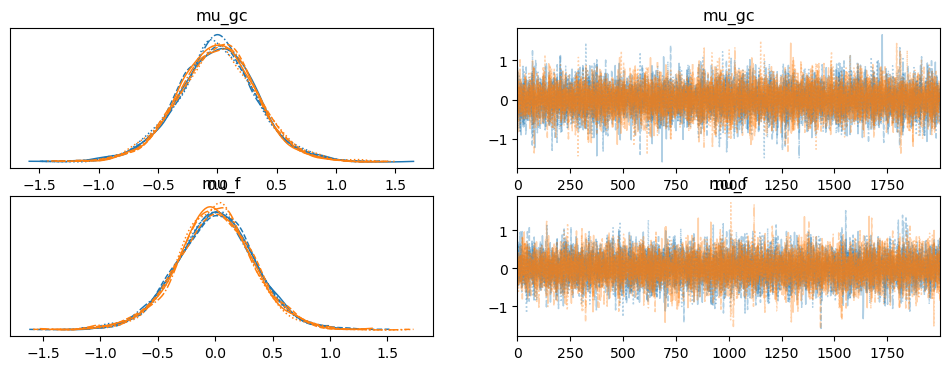

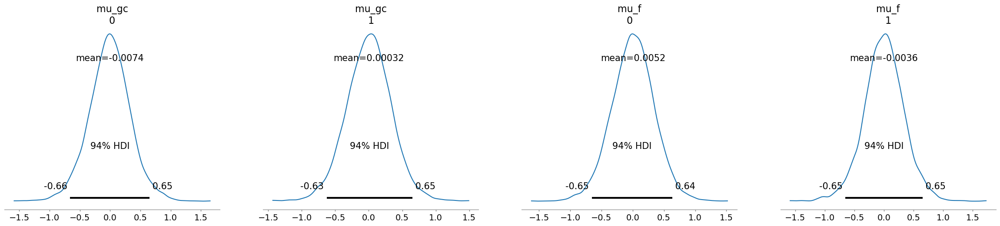

In [49]:
from matplotlib.colors import LinearSegmentedColormap
# Assuming bone_gc_trab, ocular_gc_avg, bone_f_trab, and ocular_f_avg are already defined
n_features = 2
n_chains = 4  
n_draws = 2000

# Standardizing the data
scaler = StandardScaler()
data_gc = scaler.fit_transform(np.vstack([bone_gc_trab, ocular_gc_avg]).T)
data_f = scaler.fit_transform(np.vstack([bone_f_trab, ocular_f_avg]).T)

with pm.Model() as model:
    # Priors for the means
    mu_gc = pm.Normal('mu_gc', mu=np.mean(data_gc, axis=0), sigma=np.std(data_gc, axis=0), shape=n_features)
    mu_f = pm.Normal('mu_f', mu=np.mean(data_f, axis=0), sigma=np.std(data_f, axis=0), shape=n_features)
    
    # LKJCholeskyCov for covariance matrices
    sd_dist = pm.HalfCauchy.dist(beta=2.5, shape=n_features)

    # For GC group
    chol_gc, corr_gc, stds_gc = pm.LKJCholeskyCov('chol_gc', n=n_features, eta=4, sd_dist=sd_dist, compute_corr=True)
    cov_gc = pm.Deterministic('cov_gc', chol_gc @ chol_gc.T)
    
    # Store the correlation matrix for GC group
    corr_gc_matrix = pm.Deterministic('corr_gc_matrix', corr_gc)

    # For F group
    chol_f, corr_f, stds_f = pm.LKJCholeskyCov('chol_f', n=n_features, eta=0.8, sd_dist=sd_dist, compute_corr=True)
    cov_f = pm.Deterministic('cov_f', chol_f @ chol_f.T)

    # Store the correlation matrix for F group
    corr_f_matrix = pm.Deterministic('corr_f_matrix', corr_f)

    # Compute the difference between the off-diagonal correlations
    corr_diff = pm.Deterministic('corr_diff', corr_gc[0, 1] - corr_f[0, 1])

    # Defining the likelihood using the covariance matrix from LKJCholeskyCov
    likelihood_gc = pm.MvNormal('likelihood_gc', mu=mu_gc, chol=chol_gc, observed=data_gc)
    likelihood_f = pm.MvNormal('likelihood_f', mu=mu_f, chol=chol_f, observed=data_f)

    # MCMC sampling using the NUTS sampler
    trace = pm.sample(draws=2000, tune=1000, chains=n_chains, return_inferencedata=True)

# Extract correlation matrices
corr_gc_values = trace.posterior['corr_gc_matrix'].values
corr_f_values = trace.posterior['corr_f_matrix'].values

# Filter out any NaN or infinity values by replacing them with 0
corr_gc_values = np.nan_to_num(corr_gc_values, nan=0.0, posinf=0.0, neginf=0.0)
corr_f_values = np.nan_to_num(corr_f_values, nan=0.0, posinf=0.0, neginf=0.0)

# Compute the mean correlation matrices
corr_gc_mean = corr_gc_values.mean(axis=(0, 1))
corr_f_mean = corr_f_values.mean(axis=(0, 1))

# Creating custom cubehelix colormap
colors = sns.cubehelix_palette(start=0.5, rot=-0.75, as_cmap=True)
n_bins = 100
color_array = colors(np.linspace(0, 1, n_bins))
color_array[:, 3] = 1.0  # Set alpha channel to opaque
custom_cmap = LinearSegmentedColormap.from_list("custom_cubehelix", color_array)

# Feature names for the axes
feature_names = ['total_perimeter_millimeter', 'Pigment Layer-left']

# Plot the correlation matrix heatmap for the GC group
plt.figure(figsize=(6, 5))
sns.heatmap(corr_gc_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Correlation Matrix of Ground Control Group')
plt.xlabel('total_perimeter_millimeter')
plt.ylabel('Pigment Layer-left')
plt.tight_layout()
plt.show()

# Plot the correlation matrix heatmap for the F group
plt.figure(figsize=(6, 5))
sns.heatmap(corr_f_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Correlation Matrix of Flight Group')
plt.xlabel('total_perimeter_millimeter')
plt.ylabel('Pigment Layer-left')
plt.tight_layout()
plt.show()

# Print summary statistics for correlation and correlation difference
print(az.summary(trace, var_names=['mu_gc', 'mu_f', 'corr_gc_matrix', 'corr_f_matrix', 'corr_diff']))

# Plot trace and posterior for the correlations and difference
az.plot_trace(trace, var_names=['mu_gc', 'mu_f'])
az.plot_posterior(trace, var_names=['mu_gc', 'mu_f'])

<Axes: title={'center': 'corr_diff'}>

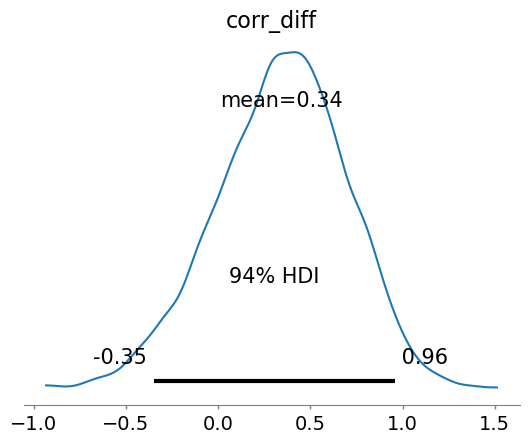

In [50]:
az.plot_posterior(trace, var_names=['corr_diff'])

In [51]:
corr_gc_values = trace.posterior['corr_gc_matrix'].values
corr_f_values = trace.posterior['corr_f_matrix'].values

gc_greater_f = (corr_gc_values[:, :, 0, 1] > corr_f_values[:, :, 0, 1]).mean()

print(f"P(corr_gc > corr_f) = {gc_greater_f:.4f}")


P(corr_gc > corr_f) = 0.8320


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# Extract covariance samples
cov_gc_samples = trace.posterior['cov_gc'].values
cov_f_samples = trace.posterior['cov_f'].values

# Compute mean covariance matrices
cov_gc_mean = cov_gc_samples.mean(axis=(0, 1)) 
cov_f_mean = cov_f_samples.mean(axis=(0, 1))

# Compute correlation matrices from covariance matrices
# Covariance to correlation: Corr(X, Y) = Cov(X, Y) / (std(X) * std(Y))
std_gc = np.sqrt(np.diag(cov_gc_mean))
corr_gc_mean = cov_gc_mean / np.outer(std_gc, std_gc)

std_f = np.sqrt(np.diag(cov_f_mean))
corr_f_mean = cov_f_mean / np.outer(std_f, std_f)

# Creating custom cubehelix colormap
colors = sns.cubehelix_palette(start=0.5, rot=-0.75, as_cmap=True)
n_bins = 100
color_array = colors(np.linspace(0, 1, n_bins))
color_array[:, 3] = 1.0  # Set alpha channel to opaque
custom_cmap = LinearSegmentedColormap.from_list("custom_cubehelix", color_array)

# Feature names for the axes
feature_names = ['total_perimeter_millimeter', 'Pigment Layer-left']

# Plot the correlation matrix heatmap for the GC group
plt.figure(figsize=(6, 5))
sns.heatmap(corr_gc_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Correlation Matrix of Ground Control Group')
plt.xlabel('total_perimeter_millimeter')
plt.ylabel('Pigment Layer-left')
plt.tight_layout()
plt.show()

# Plot the correlation matrix heatmap for the F group
plt.figure(figsize=(6, 5))
sns.heatmap(corr_f_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Correlation Matrix of Flight Group')
plt.xlabel('total_perimeter_millimeter')
plt.ylabel('Pigment Layer-left')
plt.tight_layout()
plt.show()


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_gc, mu_f, chol_gc, chol_f]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 10 seconds.


           mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
x[0, 0]   0.359  0.047   0.268    0.446      0.000    0.000   10592.0   
x[0, 1] -19.944  2.337 -24.306  -15.523      0.023    0.017    9976.0   
x[1, 0]  15.713  0.834  14.088   17.258      0.008    0.006   10038.0   
x[1, 1]  -4.590  2.485  -9.476   -0.091      0.025    0.020    9966.0   

         ess_tail  r_hat  
x[0, 0]    5453.0    1.0  
x[0, 1]    5709.0    1.0  
x[1, 0]    5712.0    1.0  
x[1, 1]    5909.0    1.0  


array([<Axes: title={'center': 'mu_f_orig\n0'}>,
       <Axes: title={'center': 'mu_f_orig\n1'}>,
       <Axes: title={'center': 'mu_gc_orig\n0'}>,
       <Axes: title={'center': 'mu_gc_orig\n1'}>], dtype=object)

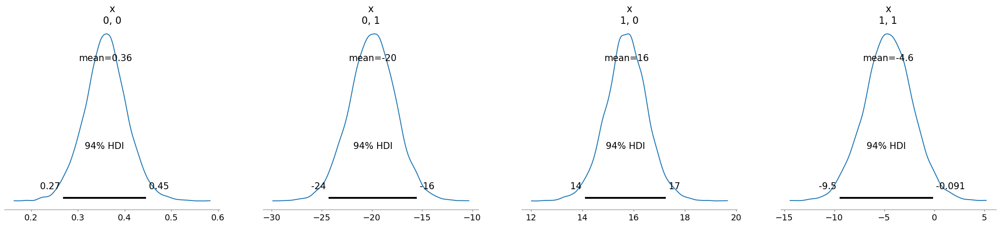

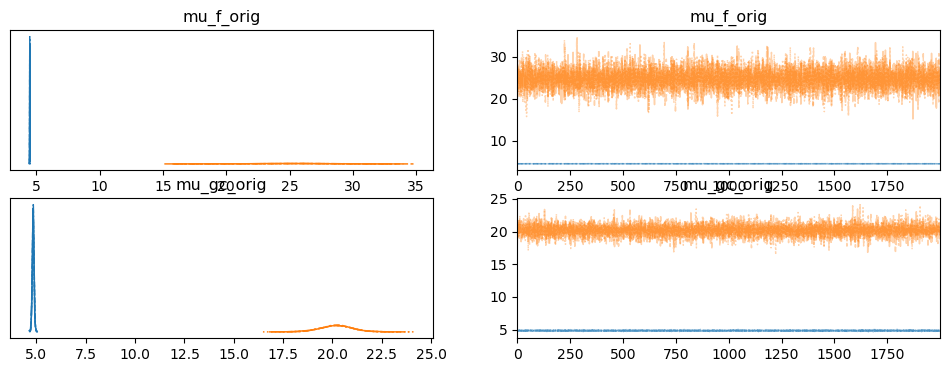

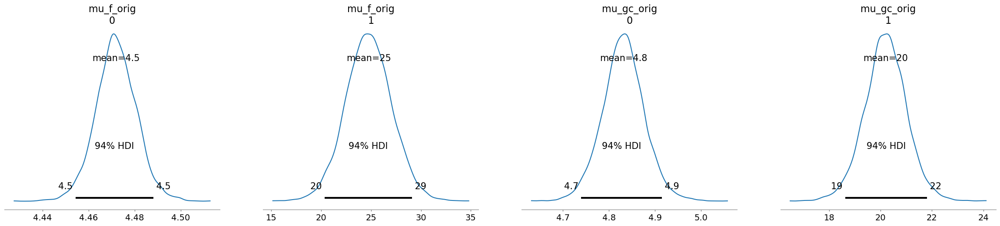

In [36]:
# Assuming you have the original data in bone_gc_trab, ocular_gc_avg, bone_f_trab, ocular_f_avg
mean_gc_trab = np.mean(bone_gc_trab)
mean_ocular_gc = np.mean(ocular_gc_avg)
std_gc_trab = np.std(bone_gc_trab)
std_ocular_gc = np.std(ocular_gc_avg)

mean_f_trab = np.mean(bone_f_trab)
mean_ocular_f = np.mean(ocular_f_avg)
std_f_trab = np.std(bone_f_trab)
std_ocular_f = np.std(ocular_f_avg)

# Standardize the data
scaler = StandardScaler()
data_gc = scaler.fit_transform(np.vstack([bone_gc_trab, ocular_gc_avg]).T)
data_f = scaler.fit_transform(np.vstack([bone_f_trab, ocular_f_avg]).T)

# Model parameters
n_features = 2
n_chains = 4  
n_draws = 2000

# Create the model
with pm.Model() as model:
    # Priors for the means
    mu_gc = pm.Normal('mu_gc', mu=np.mean(data_gc, axis=0), sigma=np.std(data_gc, axis=0), shape=n_features)
    mu_f = pm.Normal('mu_f', mu=np.mean(data_f, axis=0), sigma=np.std(data_f, axis=0), shape=n_features)
    
    # LKJ prior for the covariance matrices
    sd_dist = pm.HalfCauchy.dist(beta=2.5, shape=n_features)
    
    chol_gc, corr_gc, stds_gc = pm.LKJCholeskyCov('chol_gc', n=n_features, eta=4, sd_dist=sd_dist, compute_corr=True)
    cov_gc = pm.Deterministic('cov_gc', chol_gc @ chol_gc.T)
    
    chol_f, corr_f, stds_f = pm.LKJCholeskyCov('chol_f', n=n_features, eta=4, sd_dist=sd_dist, compute_corr=True)
    cov_f = pm.Deterministic('cov_f', chol_f @ chol_f.T)
    
    # Likelihood
    likelihood_gc = pm.MvNormal('likelihood_gc', mu=mu_gc, chol=chol_gc, observed=data_gc)
    likelihood_f = pm.MvNormal('likelihood_f', mu=mu_f, chol=chol_f, observed=data_f)
    
    # Sample from the posterior
    trace = pm.sample(draws=n_draws, tune=1000, chains=n_chains, return_inferencedata=True)

# Reverse the standardization for mu_gc and mu_f to get back to the original scale
mu_gc_orig = trace.posterior['mu_gc'] * np.array([std_gc_trab, std_ocular_gc]) + np.array([mean_gc_trab, mean_ocular_gc])
mu_f_orig = trace.posterior['mu_f'] * np.array([std_f_trab, std_ocular_f]) + np.array([mean_f_trab, mean_ocular_f])

# Calculate the difference between mu_gc_orig and mu_f_orig
mu_diff = mu_gc_orig - mu_f_orig

# Print the summary of the difference in means
print(az.summary(mu_diff, hdi_prob=0.94))  # 94% HDI for the difference

# Visualize the difference in means
az.plot_posterior(mu_diff)

# Optional: You can also visualize the original mu_gc and mu_f if needed
az.plot_trace({'mu_gc_orig': mu_gc_orig, 'mu_f_orig': mu_f_orig})
az.plot_posterior({'mu_gc_orig': mu_gc_orig, 'mu_f_orig': mu_f_orig})


In [31]:
# 从协方差矩阵中提取协方差和方差，计算相关系数
cov_gc = trace.posterior['cov_gc'].sel(chain=0, draw=slice(None))
cov_f = trace.posterior['cov_f'].sel(chain=0, draw=slice(None))

# 计算协方差矩阵的标准差（对角线的平方根）
std_gc = np.sqrt(cov_gc[:, 0, 0] * cov_gc[:, 1, 1])
std_f = np.sqrt(cov_f[:, 0, 0] * cov_f[:, 1, 1])

# 计算相关系数 (协方差/标准差乘积)
corr_gc = cov_gc[:, 0, 1] / std_gc
corr_f = cov_f[:, 0, 1] / std_f

# 计算地面控制组相关系数大于太空飞行组的概率
prob_corr_gc_greater = (corr_gc > corr_f).mean()
print(f"Probability that ground control has a higher correlation between the two features: {prob_corr_gc_greater}")

# 计算太空飞行组相关系数大于地面控制组的概率
prob_corr_f_greater = (corr_f > corr_gc).mean()
print(f"Probability that space flight has a higher correlation between the two features: {prob_corr_f_greater}")


Probability that ground control has a higher correlation between the two features: <xarray.DataArray ()> Size: 8B
array(0.7575)
Coordinates:
    chain         int64 8B 0
    cov_gc_dim_0  int64 8B 0
    cov_gc_dim_1  int64 8B 1
    cov_f_dim_0   int64 8B 0
    cov_f_dim_1   int64 8B 1
Probability that space flight has a higher correlation between the two features: <xarray.DataArray ()> Size: 8B
array(0.2425)
Coordinates:
    chain         int64 8B 0
    cov_f_dim_0   int64 8B 0
    cov_f_dim_1   int64 8B 1
    cov_gc_dim_0  int64 8B 0
    cov_gc_dim_1  int64 8B 1


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Extract samples for GC and F
samples_gc = trace.posterior['mu_gc'].stack(draws=("chain", "draw"))
samples_f = trace.posterior['mu_f'].stack(draws=("chain", "draw"))

# Create joint distribution plots
plt.figure(figsize=(10, 5))
sns.jointplot(x=samples_gc[0], y=samples_gc[1], kind="kde", color="blue", label="GC")
sns.jointplot(x=samples_f[0], y=samples_f[1], kind="kde", color="red", label="F")
plt.legend()
plt.show()


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_gc, mu_f, chol_gc, chol_f]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 24 seconds.


               mean      sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
mu_gc[0]     -0.006   0.351  -0.660    0.664      0.004    0.004   10009.0   
mu_gc[1]     -0.001   0.339  -0.652    0.642      0.003    0.004   10968.0   
mu_f[0]       0.006   0.338  -0.627    0.629      0.004    0.004    9290.0   
mu_f[1]      -0.001   0.335  -0.651    0.611      0.004    0.004    9474.0   
cov_gc[0, 0]  1.561   0.920   0.407    3.024      0.012    0.009    8839.0   
cov_gc[0, 1]  0.013   0.417  -0.764    0.785      0.005    0.005    8165.0   
cov_gc[1, 0]  0.013   0.417  -0.764    0.785      0.005    0.005    8165.0   
cov_gc[1, 1]  1.542   0.947   0.464    3.075      0.014    0.010    6309.0   
cov_f[0, 0]   1.458   0.824   0.451    2.830      0.010    0.007   10273.0   
cov_f[0, 1]  -0.297   0.384  -1.094    0.361      0.005    0.004    7415.0   
cov_f[1, 0]  -0.297   0.384  -1.094    0.361      0.005    0.004    7415.0   
cov_f[1, 1]   1.460   0.813   0.440    2.852      0.011    0.008

<Axes: title={'center': 'ratio'}>

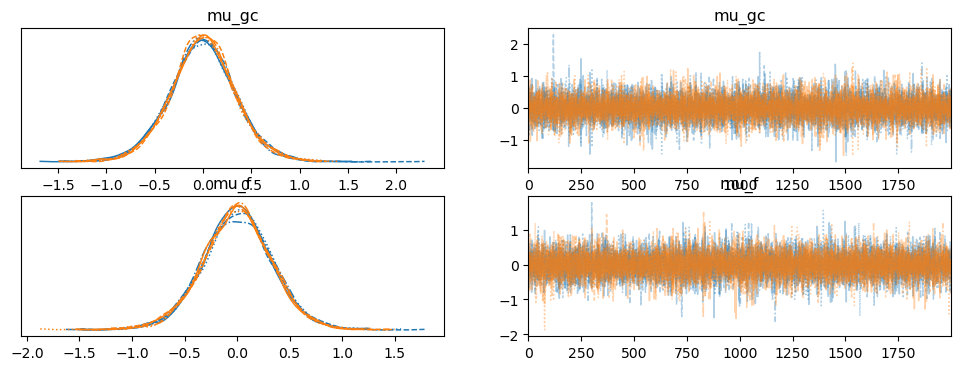

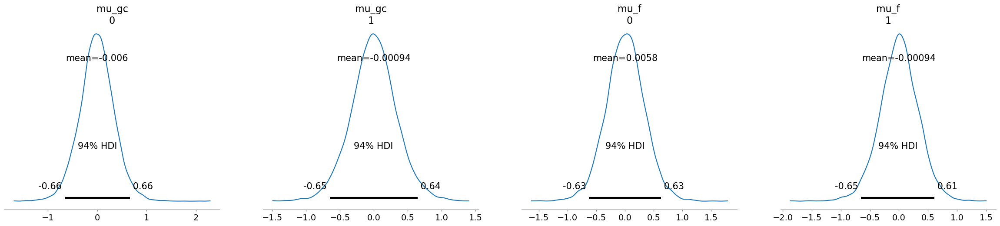

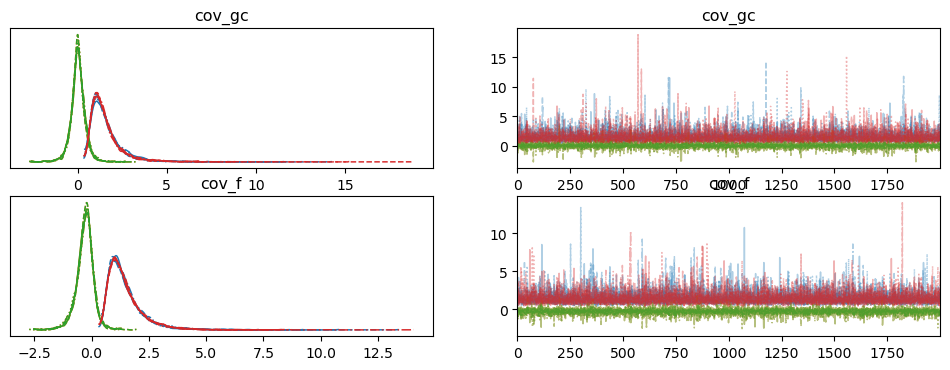

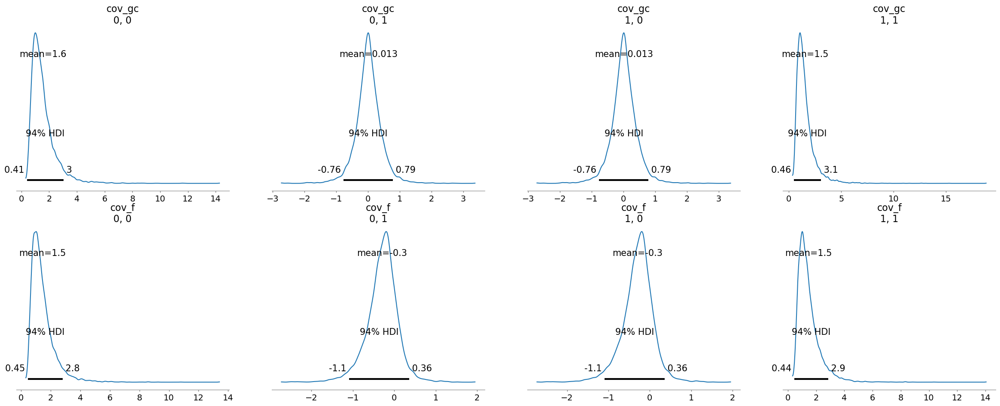

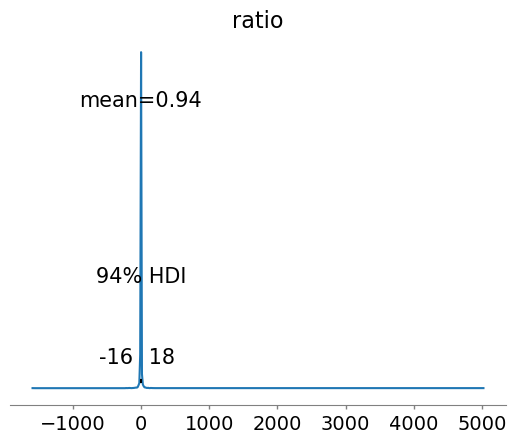

In [10]:
import pymc as pm
import arviz as az
import numpy as np
from sklearn.preprocessing import StandardScaler
import xarray as xr

n_features = 2
n_chains = 4  
n_draws = 2000

# Define the data
bone_gc_trab = bone_gc['total_perimeter_millimeter']
bone_f_trab = bone_f['total_perimeter_millimeter']
ocular_gc_avg = ocular_gc['sumEC']
ocular_f_avg = ocular_f['sumEC']

scaler = StandardScaler()
data_gc = scaler.fit_transform(np.vstack([bone_gc_trab, ocular_gc_avg]).T)
data_f = scaler.fit_transform(np.vstack([bone_f_trab, ocular_f_avg]).T)

# Creating the model
with pm.Model() as model:
    # Mean priors based on data mean and standard deviation
    mu_gc = pm.Normal('mu_gc', mu=np.mean(data_gc, axis=0), sigma=np.std(data_gc, axis=0), shape=n_features)
    mu_f = pm.Normal('mu_f', mu=np.mean(data_f, axis=0), sigma=np.std(data_f, axis=0), shape=n_features)
    
    # Defining the covariance matrix prior using LKJCholeskyCov
    # LKJCholeskyCov prior parameters
    sd_dist = pm.HalfCauchy.dist(beta=2.5, shape=n_features)

    # For GC group
    chol_gc, corr_gc, stds_gc = pm.LKJCholeskyCov(
        'chol_gc', n=n_features, eta=4, sd_dist=sd_dist, compute_corr=True
    )
    cov_gc = pm.Deterministic('cov_gc', chol_gc @ chol_gc.T)

    # For F group
    chol_f, corr_f, stds_f = pm.LKJCholeskyCov(
        'chol_f', n=n_features, eta=4, sd_dist=sd_dist, compute_corr=True
    )
    cov_f = pm.Deterministic('cov_f', chol_f @ chol_f.T)

    # Defining the likelihood using the covariance matrix from the LKJCholeskyCov
    likelihood_gc = pm.MvNormal('likelihood_gc', mu=mu_gc, chol=chol_gc, observed=data_gc)
    likelihood_f = pm.MvNormal('likelihood_f', mu=mu_f, chol=chol_f, observed=data_f)

    # MCMC sampling using the NUTS sampler
    trace = pm.sample(draws=n_draws, tune=1000, chains=n_chains, return_inferencedata=True)

# Calculate the ratio of posterior cov_f[0, 1] to cov_gc[0, 1]
cov_f_samples = trace.posterior['cov_f']
cov_gc_samples = trace.posterior['cov_gc']

ratio = cov_f_samples[:,:,0,1] / cov_gc_samples[:,:,0,1]

# Add the ratio to the InferenceData object
ratio_dataarray = xr.DataArray(
    ratio,
    dims=('chain', 'draw'),
    coords={'chain': trace.posterior.chain, 'draw': trace.posterior.draw}
)
trace.posterior['ratio'] = ratio_dataarray

# Print summary statistics including the new ratio
print(az.summary(trace, var_names=['mu_gc', 'mu_f', 'cov_gc', 'cov_f', 'ratio']))

# Visualize the results
az.plot_trace(trace, var_names=['mu_gc', 'mu_f'])
az.plot_posterior(trace, var_names=['mu_gc', 'mu_f'])
az.plot_trace(trace, var_names=['cov_gc', 'cov_f'])
az.plot_posterior(trace, var_names=['cov_gc', 'cov_f'])
az.plot_posterior(trace, var_names=['ratio'])

In [14]:
az.summary(trace, var_names=['ratio'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ratio,0.94,77.395,-16.181,18.023,0.862,0.611,7336.0,7201.0,1.0


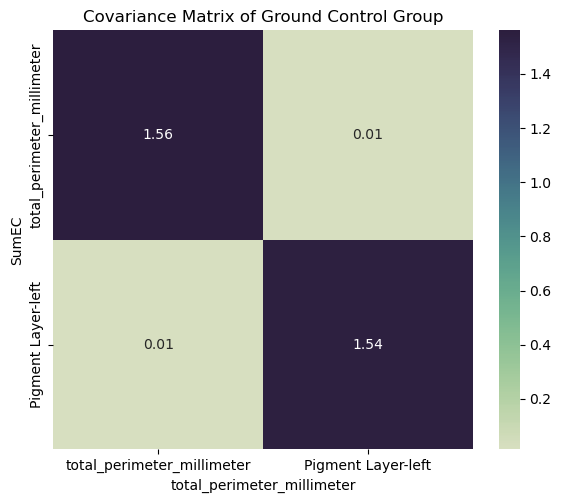

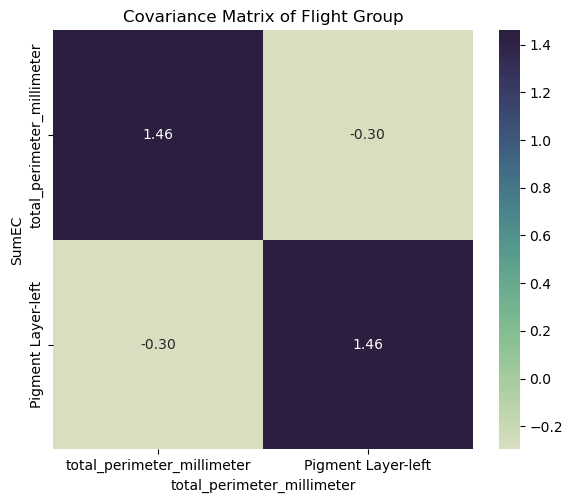

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
cov_gc_samples = trace.posterior['cov_gc'].values
cov_f_samples = trace.posterior['cov_f'].values

cov_gc_mean = cov_gc_samples.mean(axis=(0, 1)) 
cov_f_mean = cov_f_samples.mean(axis=(0, 1))

# 创建自定义的 cubehelix 颜色映射
colors = sns.cubehelix_palette(start=0.5, rot=-0.75, as_cmap=True)
n_bins = 100
color_array = colors(np.linspace(0, 1, n_bins))
color_array[:, 3] = 1.0  # 设置 alpha 通道为不透明
custom_cmap = LinearSegmentedColormap.from_list("custom_cubehelix", color_array)

feature_names = ['total_perimeter_millimeter', 'Pigment Layer-left']

# 绘制 GC 组的协方差矩阵热力图
plt.figure(figsize=(6, 5))
sns.heatmap(cov_gc_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Covariance Matrix of Ground Control Group')
plt.xlabel('total_perimeter_millimeter')
plt.ylabel('SumEC')
plt.tight_layout()
plt.show()

# 绘制 F 组的协方差矩阵热力图
plt.figure(figsize=(6, 5))
sns.heatmap(cov_f_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Covariance Matrix of Flight Group')
plt.xlabel('total_perimeter_millimeter')
plt.ylabel('SumEC')
plt.tight_layout()
plt.show()

In [ ]:
bone_gc_trab = bone_gc['total_perimeter_millimeter']
bone_f_trab = bone_f['total_perimeter_millimeter']
ocular_gc_avg = ocular_gc['sumEC']
ocular_f_avg = ocular_f['sumEC']

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_gc, mu_f, chol_gc, chol_f]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 11 seconds.


               mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
mu_gc[0]      0.005  0.343  -0.631    0.665      0.003    0.004    9991.0   
mu_gc[1]     -0.003  0.339  -0.660    0.623      0.003    0.004   10079.0   
mu_f[0]      -0.001  0.337  -0.631    0.637      0.004    0.004    8682.0   
mu_f[1]      -0.003  0.336  -0.619    0.663      0.004    0.004    9346.0   
cov_gc[0, 0]  1.508  0.815   0.504    2.900      0.009    0.007    9992.0   
cov_gc[0, 1]  0.014  0.397  -0.767    0.750      0.004    0.004    8769.0   
cov_gc[1, 0]  0.014  0.397  -0.767    0.750      0.004    0.004    8769.0   
cov_gc[1, 1]  1.522  0.866   0.459    2.994      0.012    0.009    6614.0   
cov_f[0, 0]   1.456  0.790   0.474    2.836      0.010    0.007    8765.0   
cov_f[0, 1]  -0.303  0.390  -1.106    0.358      0.004    0.004    9316.0   
cov_f[1, 0]  -0.303  0.390  -1.106    0.358      0.004    0.004    9316.0   
cov_f[1, 1]   1.453  0.801   0.466    2.807      0.011    0.008    7796.0   

array([[<Axes: title={'center': 'cov_gc\n0, 0'}>,
        <Axes: title={'center': 'cov_gc\n0, 1'}>,
        <Axes: title={'center': 'cov_gc\n1, 0'}>,
        <Axes: title={'center': 'cov_gc\n1, 1'}>],
       [<Axes: title={'center': 'cov_f\n0, 0'}>,
        <Axes: title={'center': 'cov_f\n0, 1'}>,
        <Axes: title={'center': 'cov_f\n1, 0'}>,
        <Axes: title={'center': 'cov_f\n1, 1'}>]], dtype=object)

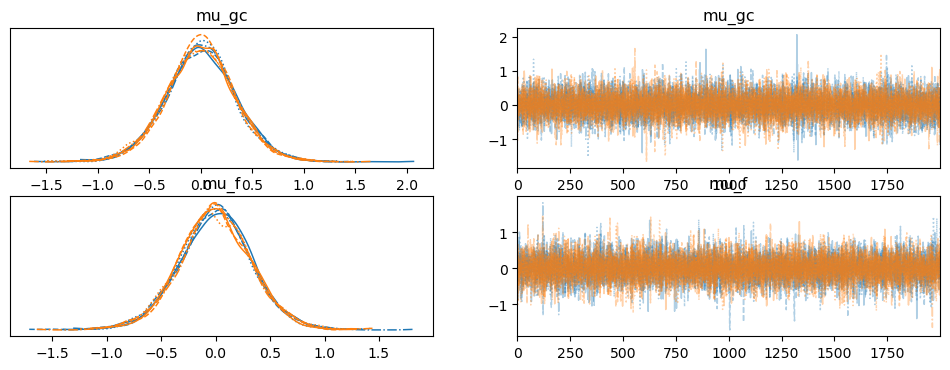

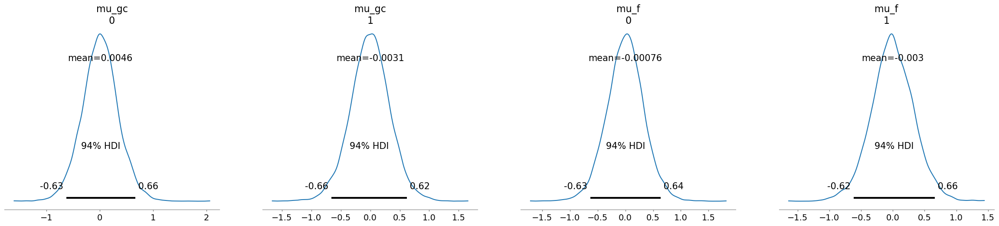

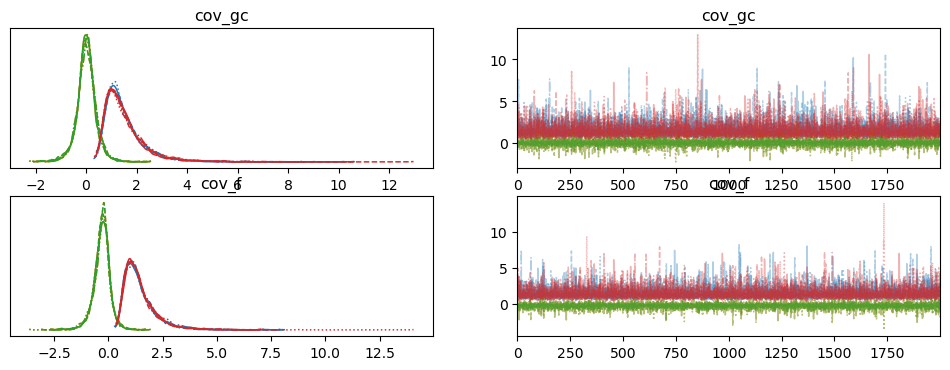

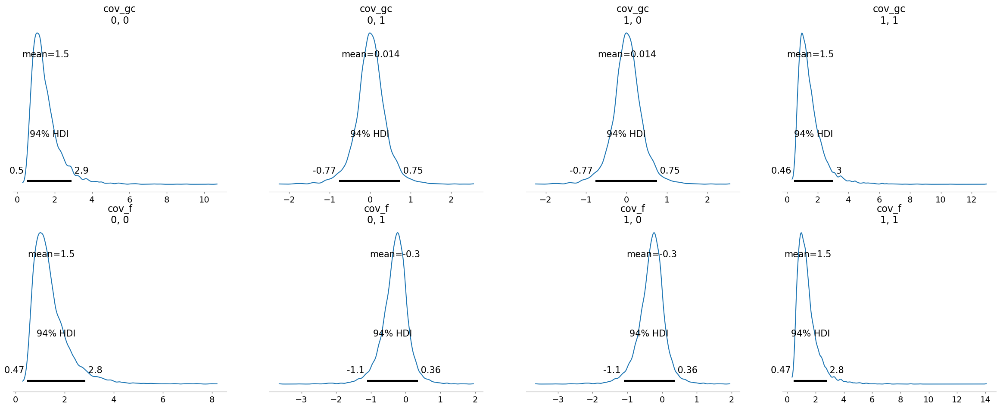

In [22]:
n_features = 2
n_chains = 4  
n_draws = 2000


scaler = StandardScaler()
data_gc = scaler.fit_transform(np.vstack([bone_gc_trab, ocular_gc_avg]).T)
data_f = scaler.fit_transform(np.vstack([bone_f_trab, ocular_f_avg]).T)
# Creating the model
with pm.Model() as model:
    # Mean priors based on data mean and standard deviation
    mu_gc = pm.Normal('mu_gc', mu=np.mean(data_gc, axis=0), sigma=np.std(data_gc, axis=0), shape=n_features)
    mu_f = pm.Normal('mu_f', mu=np.mean(data_f, axis=0), sigma=np.std(data_f, axis=0), shape=n_features)
    
    # Defining the covariance matrix prior using LKJCholeskyCov
    # LKJCholeskyCov prior parameters
    sd_dist = pm.HalfCauchy.dist(beta=2.5, shape=n_features)

    # For GC group
    chol_gc, corr_gc, stds_gc = pm.LKJCholeskyCov(
        'chol_gc', n=n_features, eta=4, sd_dist=sd_dist, compute_corr=True
    )
    cov_gc = pm.Deterministic('cov_gc', chol_gc @ chol_gc.T)

    # For F group
    chol_f, corr_f, stds_f = pm.LKJCholeskyCov(
        'chol_f', n=n_features, eta=4, sd_dist=sd_dist, compute_corr=True
    )
    cov_f = pm.Deterministic('cov_f', chol_f @ chol_f.T)

    # Defining the likelihood using the covariance matrix from the LKJCholeskyCov
    likelihood_gc = pm.MvNormal('likelihood_gc', mu=mu_gc, chol=chol_gc, observed=data_gc)
    likelihood_f = pm.MvNormal('likelihood_f', mu=mu_f, chol=chol_f, observed=data_f)

    # MCMC sampling using the NUTS sampler
    trace = pm.sample(draws=2000, tune=1000, chains=n_chains, return_inferencedata=True)

# Print summary statistics
print(az.summary(trace, var_names=['mu_gc', 'mu_f', 'cov_gc', 'cov_f']))

# Visualize the results
az.plot_trace(trace, var_names=['mu_gc', 'mu_f'])
az.plot_posterior(trace, var_names=['mu_gc', 'mu_f'])
az.plot_trace(trace, var_names=['cov_gc', 'cov_f'])
az.plot_posterior(trace, var_names=['cov_gc', 'cov_f'])

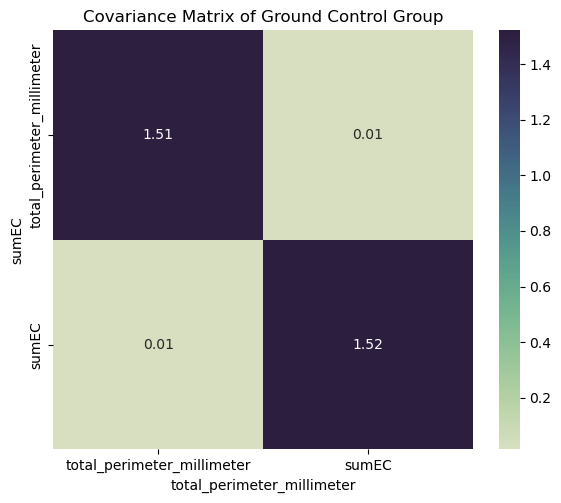

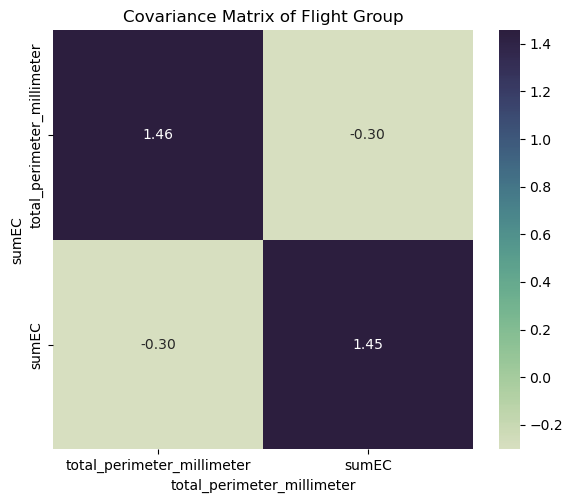

In [24]:
cov_gc_samples = trace.posterior['cov_gc'].values
cov_f_samples = trace.posterior['cov_f'].values

cov_gc_mean = cov_gc_samples.mean(axis=(0, 1)) 
cov_f_mean = cov_f_samples.mean(axis=(0, 1))

colors = sns.cubehelix_palette(start=0.5, rot=-0.75, as_cmap=True)
n_bins = 100
color_array = colors(np.linspace(0, 1, n_bins))
color_array[:, 3] = 1.0  # 设置 alpha 通道为不透明
custom_cmap = LinearSegmentedColormap.from_list("custom_cubehelix", color_array)

feature_names = ['total_perimeter_millimeter', 'sumEC']

# 绘制 GC 组的协方差矩阵热力图
plt.figure(figsize=(6, 5))
sns.heatmap(cov_gc_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Covariance Matrix of Ground Control Group')
plt.xlabel('total_perimeter_millimeter')
plt.ylabel('sumEC')
plt.tight_layout()
plt.show()

# 绘制 F 组的协方差矩阵热力图
plt.figure(figsize=(6, 5))
sns.heatmap(cov_f_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Covariance Matrix of Flight Group')
plt.xlabel('total_perimeter_millimeter')
plt.ylabel('sumEC')
plt.tight_layout()
plt.show()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_gc, mu_f, chol_gc, chol_f]


Output()

/Users/zhangxiangyu/miniconda3/envs/pymc_env/lib/python3.12/site-packages/pytensor/compile/function/types.py:970: RuntimeWarning: invalid value encountered in accumulate
  self.vm()


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 26 seconds.


                mean        sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
mu_gc[0]       0.001     0.333  -0.648    0.608      0.003    0.004    9439.0   
mu_gc[1]      -0.000     0.348  -0.656    0.652      0.004    0.004    9801.0   
mu_f[0]        0.002     0.327  -0.623    0.630      0.003    0.004    9271.0   
mu_f[1]        0.004     0.332  -0.630    0.626      0.003    0.004   10470.0   
cov_gc[0, 0]   1.521     0.824   0.473    2.981      0.010    0.007   10257.0   
cov_gc[0, 1]  -0.112     0.411  -0.889    0.669      0.005    0.005    8240.0   
cov_gc[1, 0]  -0.112     0.411  -0.889    0.669      0.005    0.005    8240.0   
cov_gc[1, 1]   1.548     0.930   0.462    3.059      0.014    0.010    6395.0   
cov_f[0, 0]    1.436     0.835   0.449    2.771      0.011    0.008    8763.0   
cov_f[0, 1]    0.385     0.400  -0.295    1.167      0.005    0.004    8671.0   
cov_f[1, 0]    0.385     0.400  -0.295    1.167      0.005    0.004    8671.0   
cov_f[1, 1]    1.419     0.7

<Axes: title={'center': 'ratio'}>

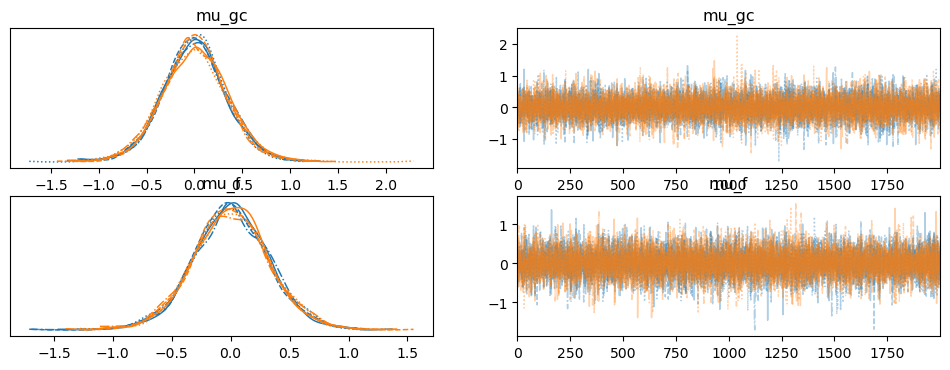

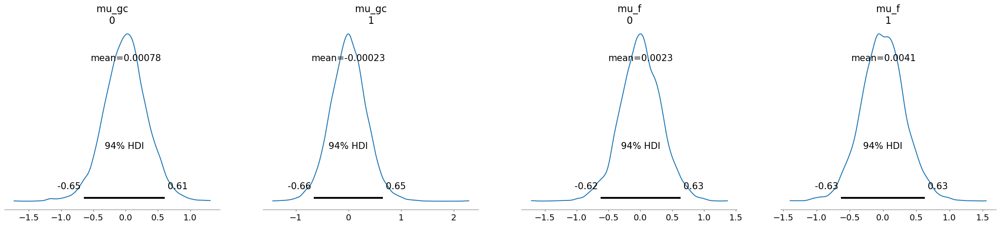

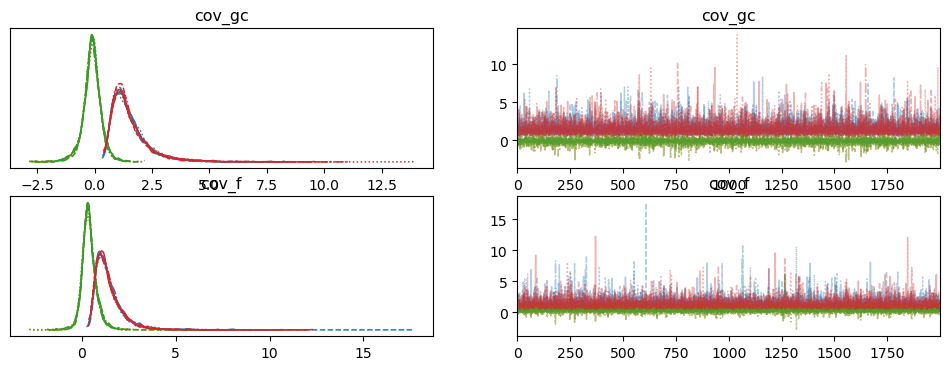

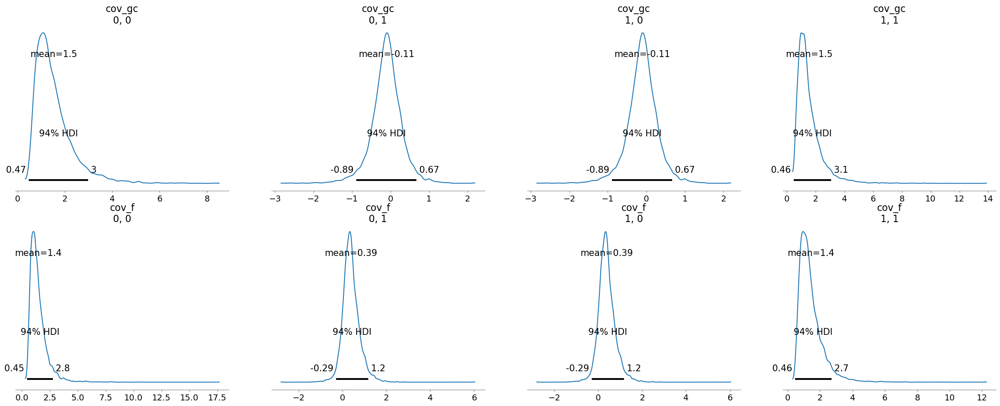

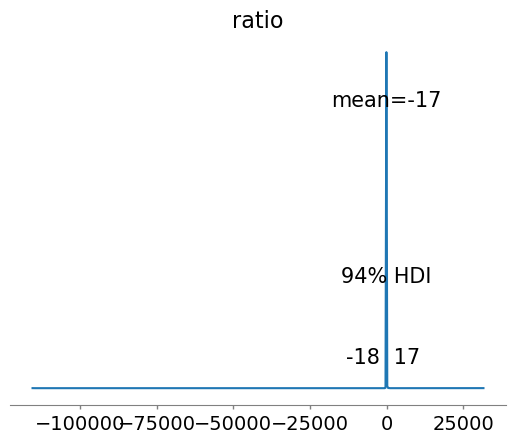

In [16]:
bone_gc_trab = bone_gc['total_perimeter_millimeter']
bone_f_trab = bone_f['total_perimeter_millimeter']
ocular_gc_avg = ocular_gc['Pigment Layer-left']
ocular_f_avg = ocular_f['Pigment Layer-left']

n_features = 2
n_chains = 4  
n_draws = 2000

scaler = StandardScaler()
data_gc = scaler.fit_transform(np.vstack([bone_gc_trab, ocular_gc_avg]).T)
data_f = scaler.fit_transform(np.vstack([bone_f_trab, ocular_f_avg]).T)

# Creating the model
with pm.Model() as model:
    # Mean priors based on data mean and standard deviation
    mu_gc = pm.Normal('mu_gc', mu=np.mean(data_gc, axis=0), sigma=np.std(data_gc, axis=0), shape=n_features)
    mu_f = pm.Normal('mu_f', mu=np.mean(data_f, axis=0), sigma=np.std(data_f, axis=0), shape=n_features)
    
    # Defining the covariance matrix prior using LKJCholeskyCov
    # LKJCholeskyCov prior parameters
    sd_dist = pm.HalfCauchy.dist(beta=2.5, shape=n_features)

    # For GC group
    chol_gc, corr_gc, stds_gc = pm.LKJCholeskyCov(
        'chol_gc', n=n_features, eta=4, sd_dist=sd_dist, compute_corr=True
    )
    cov_gc = pm.Deterministic('cov_gc', chol_gc @ chol_gc.T)

    # For F group
    chol_f, corr_f, stds_f = pm.LKJCholeskyCov(
        'chol_f', n=n_features, eta=4, sd_dist=sd_dist, compute_corr=True
    )
    cov_f = pm.Deterministic('cov_f', chol_f @ chol_f.T)

    # Defining the likelihood using the covariance matrix from the LKJCholeskyCov
    likelihood_gc = pm.MvNormal('likelihood_gc', mu=mu_gc, chol=chol_gc, observed=data_gc)
    likelihood_f = pm.MvNormal('likelihood_f', mu=mu_f, chol=chol_f, observed=data_f)

    # MCMC sampling using the NUTS sampler
    trace = pm.sample(draws=n_draws, tune=1000, chains=n_chains, return_inferencedata=True)

# Calculate the ratio of posterior cov_f[0, 1] to cov_gc[0, 1]
cov_f_samples = trace.posterior['cov_f']
cov_gc_samples = trace.posterior['cov_gc']

ratio = cov_f_samples[:,:,0,1] / cov_gc_samples[:,:,0,1]

# Add the ratio to the InferenceData object
ratio_dataarray = xr.DataArray(
    ratio,
    dims=('chain', 'draw'),
    coords={'chain': trace.posterior.chain, 'draw': trace.posterior.draw}
)
trace.posterior['ratio'] = ratio_dataarray

# Print summary statistics including the new ratio
print(az.summary(trace, var_names=['mu_gc', 'mu_f', 'cov_gc', 'cov_f', 'ratio']))

# Visualize the results
az.plot_trace(trace, var_names=['mu_gc', 'mu_f'])
az.plot_posterior(trace, var_names=['mu_gc', 'mu_f'])
az.plot_trace(trace, var_names=['cov_gc', 'cov_f'])
az.plot_posterior(trace, var_names=['cov_gc', 'cov_f'])
az.plot_posterior(trace, var_names=['ratio'])

In [18]:
az.summary(trace, var_names=['ratio'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ratio,-16.945,1402.366,-17.928,16.933,15.663,11.076,7611.0,7651.0,1.0


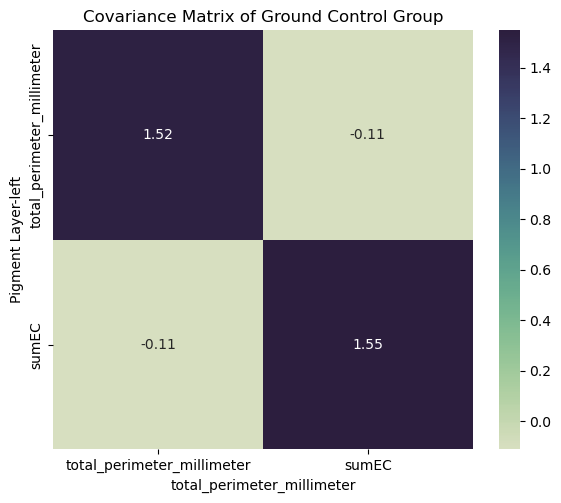

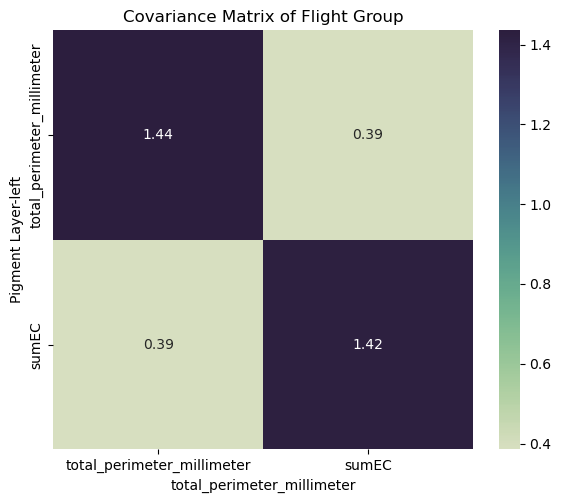

In [17]:
cov_gc_samples = trace.posterior['cov_gc'].values
cov_f_samples = trace.posterior['cov_f'].values

cov_gc_mean = cov_gc_samples.mean(axis=(0, 1)) 
cov_f_mean = cov_f_samples.mean(axis=(0, 1))

colors = sns.cubehelix_palette(start=0.5, rot=-0.75, as_cmap=True)
n_bins = 100
color_array = colors(np.linspace(0, 1, n_bins))
color_array[:, 3] = 1.0  # 设置 alpha 通道为不透明
custom_cmap = LinearSegmentedColormap.from_list("custom_cubehelix", color_array)

feature_names = ['total_perimeter_millimeter', 'sumEC']

# 绘制 GC 组的协方差矩阵热力图
plt.figure(figsize=(6, 5))
sns.heatmap(cov_gc_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Covariance Matrix of Ground Control Group')
plt.xlabel('total_perimeter_millimeter')
plt.ylabel('Pigment Layer-left')
plt.tight_layout()
plt.show()

# 绘制 F 组的协方差矩阵热力图
plt.figure(figsize=(6, 5))
sns.heatmap(cov_f_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Covariance Matrix of Flight Group')
plt.xlabel('total_perimeter_millimeter')
plt.ylabel('Pigment Layer-left')
plt.tight_layout()
plt.show()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_gc, mu_f, chol_gc, chol_f]


Output()

/Users/zhangxiangyu/miniconda3/envs/pymc_env/lib/python3.12/site-packages/pytensor/compile/function/types.py:970: RuntimeWarning: invalid value encountered in accumulate
  self.vm()


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 29 seconds.


               mean      sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
mu_gc[0]      0.005   0.320  -0.587    0.629      0.003    0.004    8836.0   
mu_gc[1]     -0.002   0.323  -0.613    0.597      0.003    0.004    9059.0   
mu_f[0]      -0.007   0.349  -0.661    0.643      0.004    0.004    9542.0   
mu_f[1]      -0.002   0.357  -0.699    0.632      0.004    0.005    8137.0   
cov_gc[0, 0]  1.309   0.697   0.400    2.466      0.008    0.007   10495.0   
cov_gc[0, 1] -0.523   0.373  -1.265    0.082      0.004    0.004    8620.0   
cov_gc[1, 0] -0.523   0.373  -1.265    0.082      0.004    0.004    8620.0   
cov_gc[1, 1]  1.314   0.682   0.405    2.504      0.009    0.006    7508.0   
cov_f[0, 0]   1.553   0.872   0.480    3.108      0.010    0.008    8814.0   
cov_f[0, 1]   0.050   0.501  -0.854    1.012      0.006    0.006    7446.0   
cov_f[1, 0]   0.050   0.501  -0.854    1.012      0.006    0.006    7446.0   
cov_f[1, 1]   1.610   1.041   0.457    3.230      0.016    0.012

<Axes: title={'center': 'ratio'}>

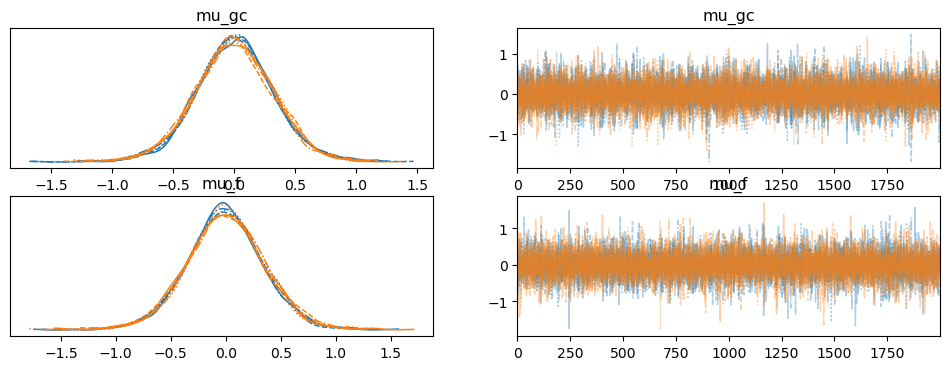

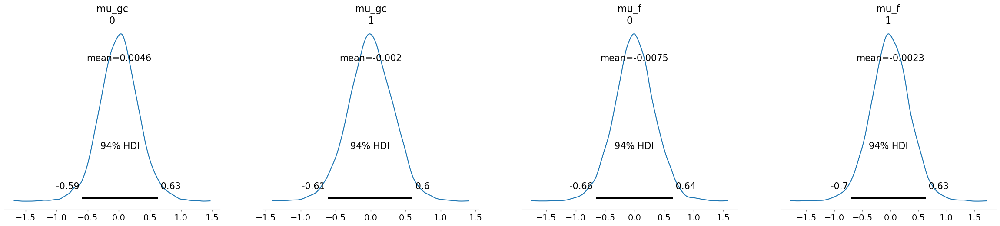

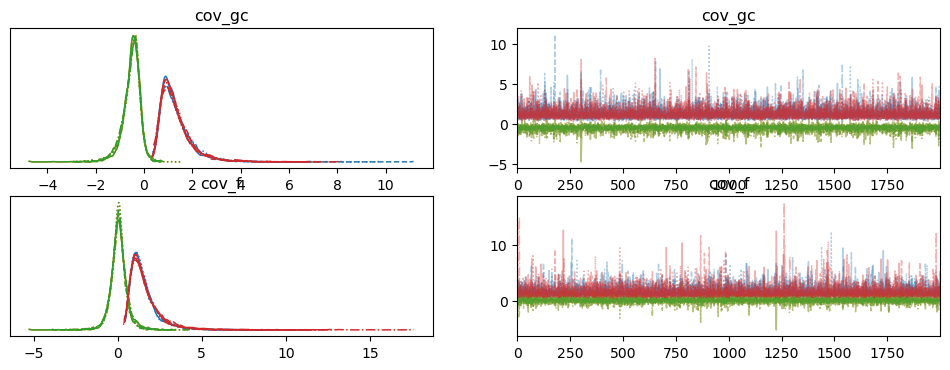

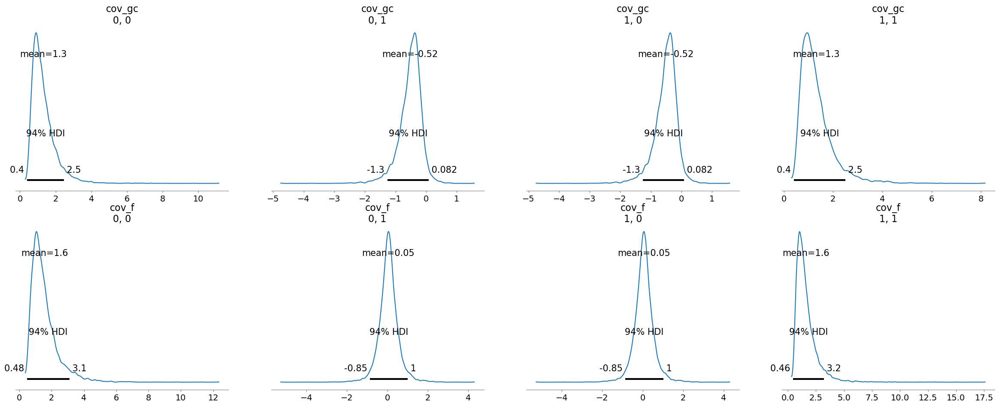

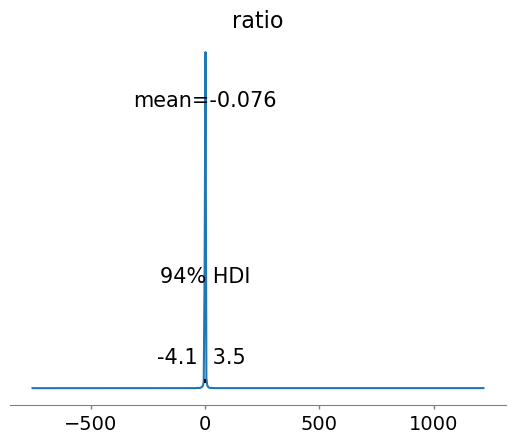

In [43]:
bone_gc_trab = bone_gc['total_perimeter_millimeter']
bone_f_trab = bone_f['total_perimeter_millimeter']
ocular_gc_avg = ocular_gc['LSDS-5_immunostaining_microscopy_PECAMtr_TRANSFORMED_Average']
ocular_f_avg = ocular_f['LSDS-5_immunostaining_microscopy_PECAMtr_TRANSFORMED_Average']

n_features = 2
n_chains = 4  
n_draws = 2000

scaler = StandardScaler()
data_gc = scaler.fit_transform(np.vstack([bone_gc_trab, ocular_gc_avg]).T)
data_f = scaler.fit_transform(np.vstack([bone_f_trab, ocular_f_avg]).T)

# Creating the model
with pm.Model() as model:
    # Mean priors based on data mean and standard deviation
    mu_gc = pm.Normal('mu_gc', mu=np.mean(data_gc, axis=0), sigma=np.std(data_gc, axis=0), shape=n_features)
    mu_f = pm.Normal('mu_f', mu=np.mean(data_f, axis=0), sigma=np.std(data_f, axis=0), shape=n_features)
    
    # Defining the covariance matrix prior using LKJCholeskyCov
    # LKJCholeskyCov prior parameters
    sd_dist = pm.HalfCauchy.dist(beta=2.5, shape=n_features)

    # For GC group
    chol_gc, corr_gc, stds_gc = pm.LKJCholeskyCov(
        'chol_gc', n=n_features, eta=4, sd_dist=sd_dist, compute_corr=True
    )
    cov_gc = pm.Deterministic('cov_gc', chol_gc @ chol_gc.T)

    # For F group
    chol_f, corr_f, stds_f = pm.LKJCholeskyCov(
        'chol_f', n=n_features, eta=2, sd_dist=sd_dist, compute_corr=True
    )
    cov_f = pm.Deterministic('cov_f', chol_f @ chol_f.T)

    # Defining the likelihood using the covariance matrix from the LKJCholeskyCov
    likelihood_gc = pm.MvNormal('likelihood_gc', mu=mu_gc, chol=chol_gc, observed=data_gc)
    likelihood_f = pm.MvNormal('likelihood_f', mu=mu_f, chol=chol_f, observed=data_f)

    # MCMC sampling using the NUTS sampler
    trace = pm.sample(draws=n_draws, tune=1000, chains=n_chains, return_inferencedata=True)

# Calculate the ratio of posterior cov_f[0, 1] to cov_gc[0, 1]
cov_f_samples = trace.posterior['cov_f']
cov_gc_samples = trace.posterior['cov_gc']

ratio = cov_f_samples[:,:,0,1] / cov_gc_samples[:,:,0,1]

# Add the ratio to the InferenceData object
ratio_dataarray = xr.DataArray(
    ratio,
    dims=('chain', 'draw'),
    coords={'chain': trace.posterior.chain, 'draw': trace.posterior.draw}
)
trace.posterior['ratio'] = ratio_dataarray

# Print summary statistics including the new ratio
print(az.summary(trace, var_names=['mu_gc', 'mu_f', 'cov_gc', 'cov_f', 'ratio']))

# Visualize the results
az.plot_trace(trace, var_names=['mu_gc', 'mu_f'])
az.plot_posterior(trace, var_names=['mu_gc', 'mu_f'])
az.plot_trace(trace, var_names=['cov_gc', 'cov_f'])
az.plot_posterior(trace, var_names=['cov_gc', 'cov_f'])
az.plot_posterior(trace, var_names=['ratio'])

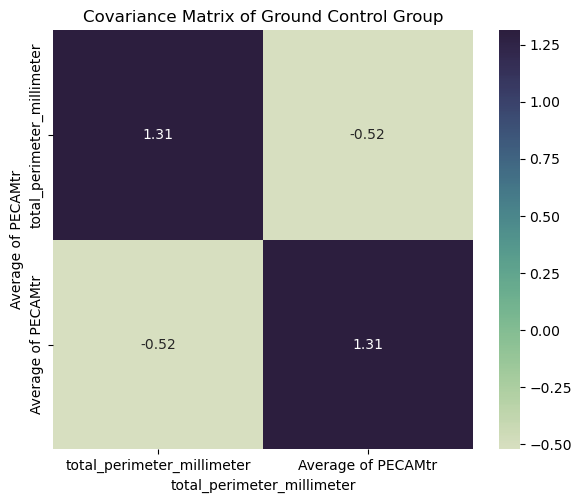

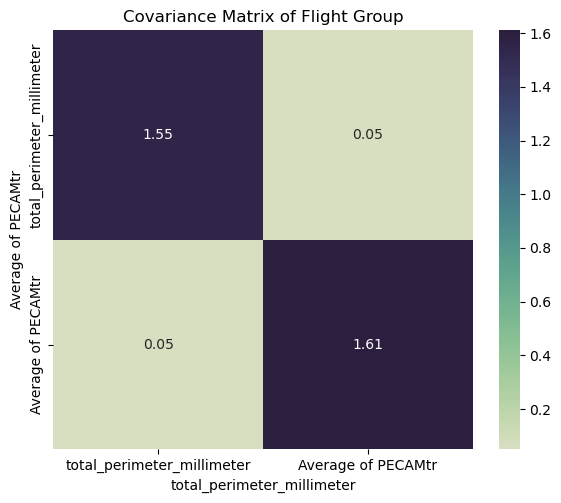

In [44]:
cov_gc_samples = trace.posterior['cov_gc'].values
cov_f_samples = trace.posterior['cov_f'].values

cov_gc_mean = cov_gc_samples.mean(axis=(0, 1)) 
cov_f_mean = cov_f_samples.mean(axis=(0, 1))

colors = sns.cubehelix_palette(start=0.5, rot=-0.75, as_cmap=True)
n_bins = 100
color_array = colors(np.linspace(0, 1, n_bins))
color_array[:, 3] = 1.0  # 设置 alpha 通道为不透明
custom_cmap = LinearSegmentedColormap.from_list("custom_cubehelix", color_array)

feature_names = ['total_perimeter_millimeter', 'Average of PECAMtr']

# 绘制 GC 组的协方差矩阵热力图
plt.figure(figsize=(6, 5))
sns.heatmap(cov_gc_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Covariance Matrix of Ground Control Group')
plt.xlabel('total_perimeter_millimeter')
plt.ylabel('Average of PECAMtr')
plt.tight_layout()
plt.show()

# 绘制 F 组的协方差矩阵热力图
plt.figure(figsize=(6, 5))
sns.heatmap(cov_f_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Covariance Matrix of Flight Group')
plt.xlabel('total_perimeter_millimeter')
plt.ylabel('Average of PECAMtr')
plt.tight_layout()
plt.show()

In [45]:
az.summary(trace, var_names=['ratio'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ratio,-0.076,20.755,-4.124,3.525,0.229,0.164,7277.0,6109.0,1.0


# Bone vs Muscle

In [46]:
muscle = pd.read_excel('/Users/zhangxiangyu/Desktop/lab/multivariate_analysis/imputed_data/muscle_modified.xlsx')
muscle_f = muscle.iloc[0:11, 1:]
muscle_gc = muscle.iloc[11: 22, 1:]

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_gc, mu_f, chol_gc, chol_f]


Output()

/Users/zhangxiangyu/miniconda3/envs/pymc_env/lib/python3.12/site-packages/pytensor/compile/function/types.py:970: RuntimeWarning: invalid value encountered in accumulate
  self.vm()


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 29 seconds.


               mean      sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
mu_gc[0]      0.000   0.332  -0.661    0.605      0.004    0.004    9140.0   
mu_gc[1]      0.005   0.329  -0.583    0.671      0.003    0.004   10407.0   
mu_f[0]      -0.001   0.339  -0.680    0.612      0.004    0.004    9120.0   
mu_f[1]      -0.002   0.334  -0.592    0.666      0.003    0.004   10161.0   
cov_gc[0, 0]  1.409   0.766   0.423    2.681      0.009    0.007    9858.0   
cov_gc[0, 1] -0.411   0.393  -1.189    0.295      0.004    0.004    9090.0   
cov_gc[1, 0] -0.411   0.393  -1.189    0.295      0.004    0.004    9090.0   
cov_gc[1, 1]  1.397   0.731   0.435    2.640      0.010    0.007    7046.0   
cov_f[0, 0]   1.461   0.795   0.447    2.853      0.010    0.007    9115.0   
cov_f[0, 1]   0.502   0.491  -0.272    1.472      0.006    0.005    7208.0   
cov_f[1, 0]   0.502   0.491  -0.272    1.472      0.006    0.005    7208.0   
cov_f[1, 1]   1.477   0.839   0.453    2.891      0.012    0.009

<Axes: title={'center': 'ratio'}>

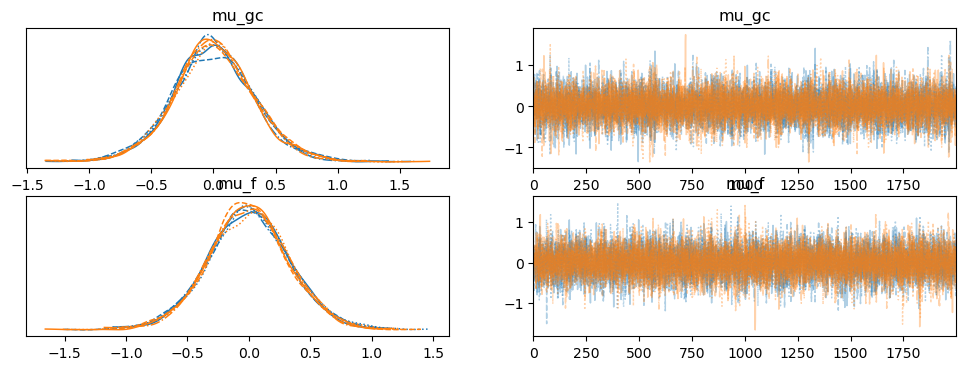

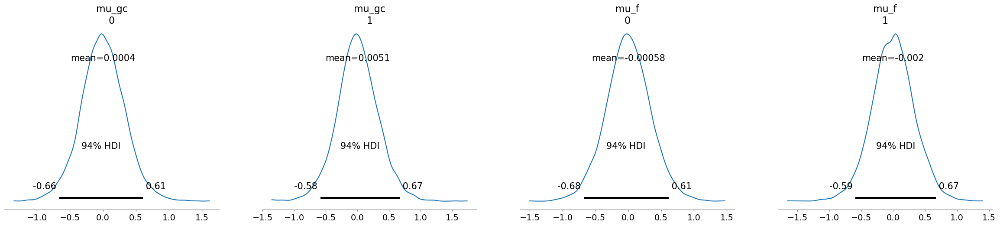

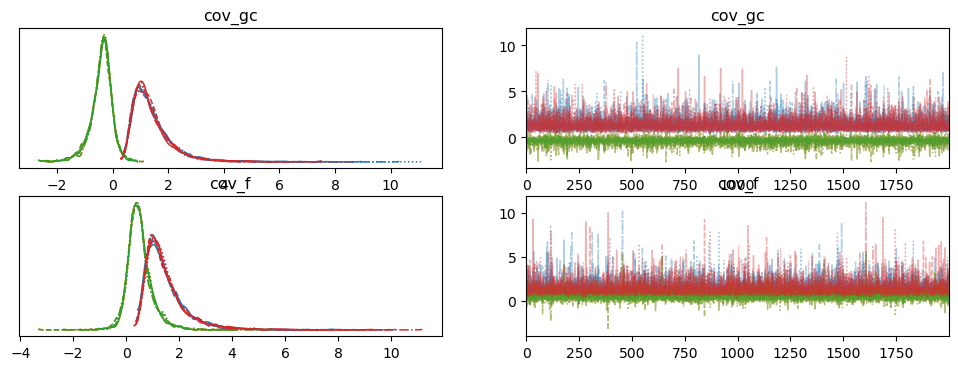

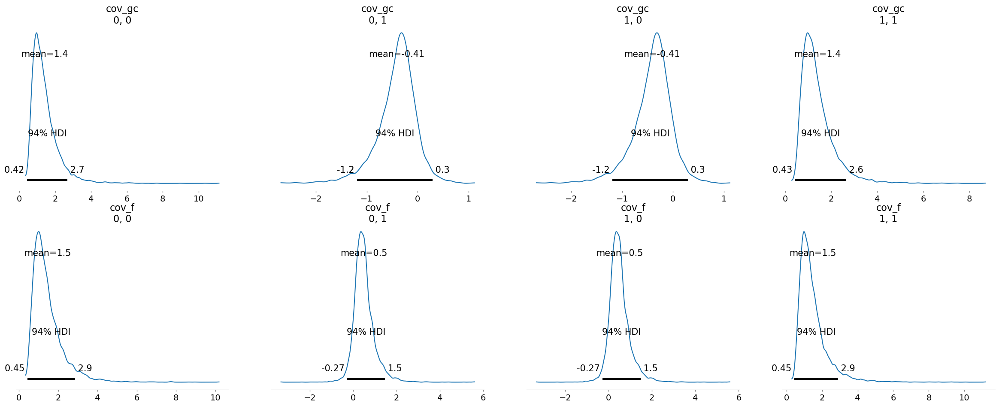

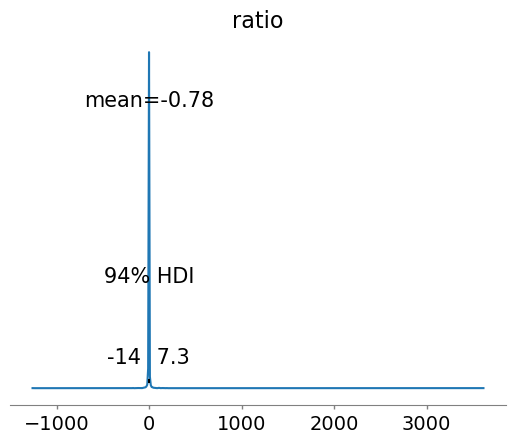

In [53]:
bone_gc_trab = bone_gc['serine9_phosphorylated_GSK3_beta_content_LSDS-70']
bone_f_trab = bone_f['serine9_phosphorylated_GSK3_beta_content_LSDS-70']
muscle_f_avg = muscle_f['GSK3_beta_content']
muscle_gc_avg = muscle_gc['GSK3_beta_content']

n_features = 2
n_chains = 4  
n_draws = 2000

scaler = StandardScaler()
data_gc = scaler.fit_transform(np.vstack([bone_gc_trab, muscle_gc_avg]).T)
data_f = scaler.fit_transform(np.vstack([bone_f_trab, muscle_f_avg]).T)

# Creating the model
with pm.Model() as model:
    # Mean priors based on data mean and standard deviation
    mu_gc = pm.Normal('mu_gc', mu=np.mean(data_gc, axis=0), sigma=np.std(data_gc, axis=0), shape=n_features)
    mu_f = pm.Normal('mu_f', mu=np.mean(data_f, axis=0), sigma=np.std(data_f, axis=0), shape=n_features)
    
    # Defining the covariance matrix prior using LKJCholeskyCov
    # LKJCholeskyCov prior parameters
    sd_dist = pm.HalfCauchy.dist(beta=2.5, shape=n_features)

    # For GC group
    chol_gc, corr_gc, stds_gc = pm.LKJCholeskyCov(
        'chol_gc', n=n_features, eta=4, sd_dist=sd_dist, compute_corr=True
    )
    cov_gc = pm.Deterministic('cov_gc', chol_gc @ chol_gc.T)

    # For F group
    chol_f, corr_f, stds_f = pm.LKJCholeskyCov(
        'chol_f', n=n_features, eta=2, sd_dist=sd_dist, compute_corr=True
    )
    cov_f = pm.Deterministic('cov_f', chol_f @ chol_f.T)

    # Defining the likelihood using the covariance matrix from the LKJCholeskyCov
    likelihood_gc = pm.MvNormal('likelihood_gc', mu=mu_gc, chol=chol_gc, observed=data_gc)
    likelihood_f = pm.MvNormal('likelihood_f', mu=mu_f, chol=chol_f, observed=data_f)

    # MCMC sampling using the NUTS sampler
    trace = pm.sample(draws=n_draws, tune=1000, chains=n_chains, return_inferencedata=True)

# Calculate the ratio of posterior cov_f[0, 1] to cov_gc[0, 1]
cov_f_samples = trace.posterior['cov_f']
cov_gc_samples = trace.posterior['cov_gc']

ratio = cov_f_samples[:,:,0,1] / cov_gc_samples[:,:,0,1]

# Add the ratio to the InferenceData object
ratio_dataarray = xr.DataArray(
    ratio,
    dims=('chain', 'draw'),
    coords={'chain': trace.posterior.chain, 'draw': trace.posterior.draw}
)
trace.posterior['ratio'] = ratio_dataarray

# Print summary statistics including the new ratio
print(az.summary(trace, var_names=['mu_gc', 'mu_f', 'cov_gc', 'cov_f', 'ratio']))

# Visualize the results
az.plot_trace(trace, var_names=['mu_gc', 'mu_f'])
az.plot_posterior(trace, var_names=['mu_gc', 'mu_f'])
az.plot_trace(trace, var_names=['cov_gc', 'cov_f'])
az.plot_posterior(trace, var_names=['cov_gc', 'cov_f'])
az.plot_posterior(trace, var_names=['ratio'])

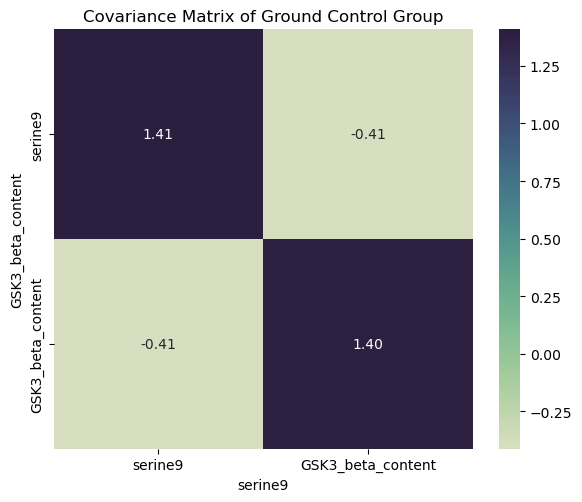

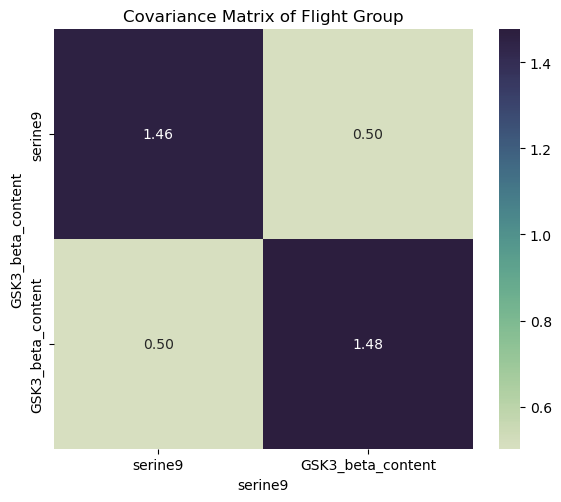

In [54]:
cov_gc_samples = trace.posterior['cov_gc'].values
cov_f_samples = trace.posterior['cov_f'].values

cov_gc_mean = cov_gc_samples.mean(axis=(0, 1)) 
cov_f_mean = cov_f_samples.mean(axis=(0, 1))

colors = sns.cubehelix_palette(start=0.5, rot=-0.75, as_cmap=True)
n_bins = 100
color_array = colors(np.linspace(0, 1, n_bins))
color_array[:, 3] = 1.0  # 设置 alpha 通道为不透明
custom_cmap = LinearSegmentedColormap.from_list("custom_cubehelix", color_array)

feature_names = ['serine9', 'GSK3_beta_content']

# 绘制 GC 组的协方差矩阵热力图
plt.figure(figsize=(6, 5))
sns.heatmap(cov_gc_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Covariance Matrix of Ground Control Group')
plt.xlabel('serine9')
plt.ylabel('GSK3_beta_content')
plt.tight_layout()
plt.show()

# 绘制 F 组的协方差矩阵热力图
plt.figure(figsize=(6, 5))
sns.heatmap(cov_f_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Covariance Matrix of Flight Group')
plt.xlabel('serine9')
plt.ylabel('GSK3_beta_content')
plt.tight_layout()
plt.show()

In [55]:
az.summary(trace, var_names=['ratio'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ratio,-0.784,54.145,-13.72,7.28,0.617,0.436,6844.0,7311.0,1.0


# Ocular vs muscle

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_gc, mu_f, chol_gc, chol_f]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 24 seconds.


               mean       sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
mu_gc[0]     -0.003    0.339  -0.637    0.650      0.004    0.004    8859.0   
mu_gc[1]     -0.002    0.343  -0.664    0.637      0.004    0.004    8744.0   
mu_f[0]       0.001    0.345  -0.627    0.674      0.004    0.004    9156.0   
mu_f[1]      -0.004    0.346  -0.688    0.613      0.004    0.004    9323.0   
cov_gc[0, 0]  1.529    0.844   0.504    2.996      0.010    0.008    8573.0   
cov_gc[0, 1] -0.079    0.414  -0.878    0.686      0.005    0.004    7570.0   
cov_gc[1, 0] -0.079    0.414  -0.878    0.686      0.005    0.004    7570.0   
cov_gc[1, 1]  1.547    0.916   0.479    3.066      0.014    0.010    6372.0   
cov_f[0, 0]   1.545    0.875   0.464    3.027      0.010    0.008    9493.0   
cov_f[0, 1]  -0.241    0.486  -1.139    0.680      0.006    0.006    8506.0   
cov_f[1, 0]  -0.241    0.486  -1.139    0.680      0.006    0.006    8506.0   
cov_f[1, 1]   1.561    0.926   0.469    3.000      0

<Axes: title={'center': 'ratio'}>

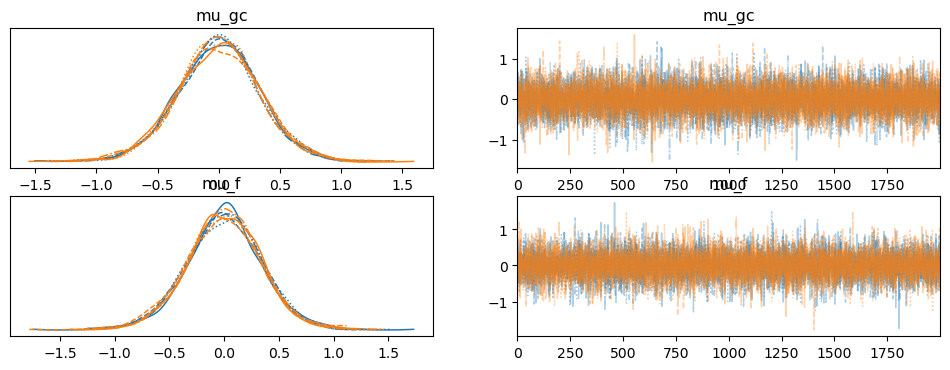

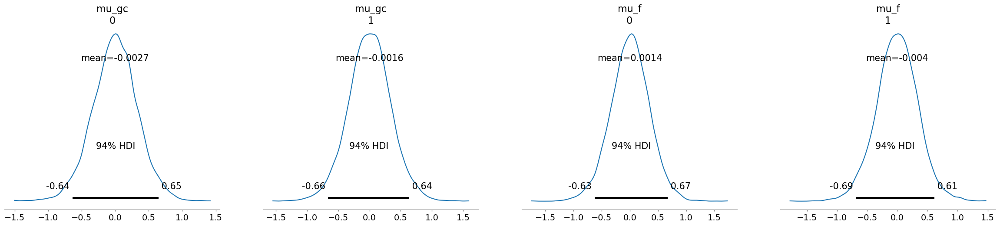

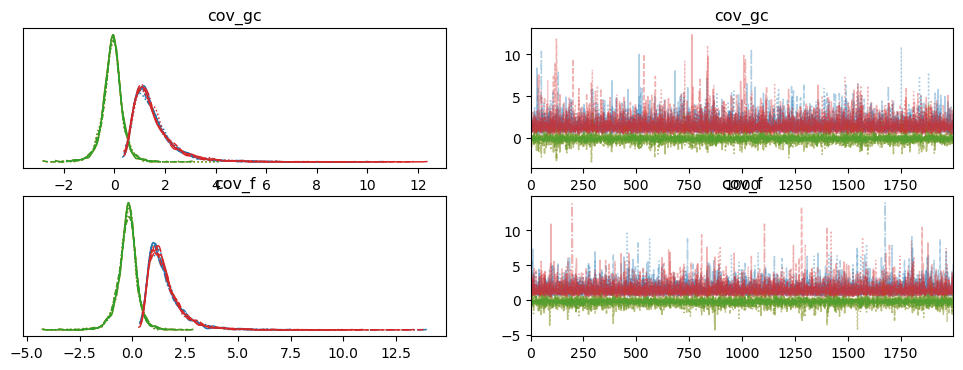

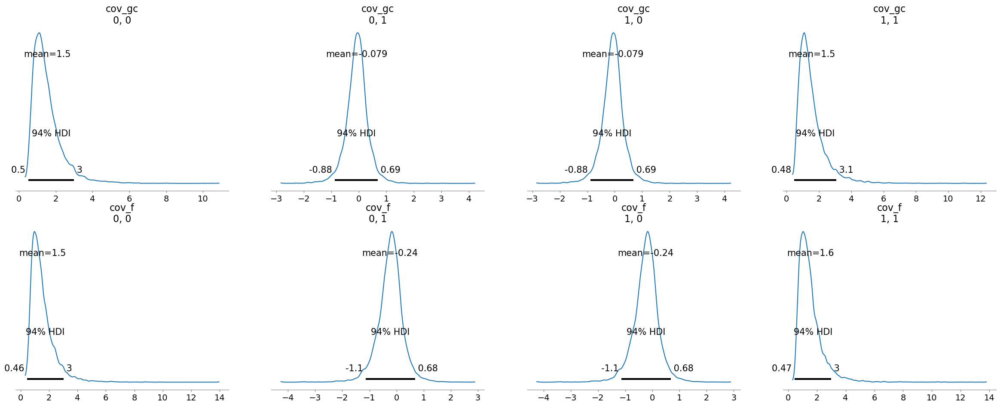

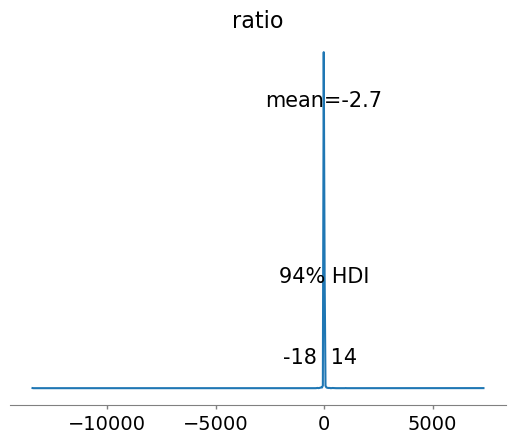

In [67]:
ocular_gc_trab = ocular_gc['Density']
ocular_f_trab = ocular_f['Density']
muscle_f_avg = muscle_f['mhc_iix']
muscle_gc_avg = muscle_gc['mhc_iix']

n_features = 2
n_chains = 4  
n_draws = 2000

scaler = StandardScaler()
data_gc = scaler.fit_transform(np.vstack([ocular_gc_trab, muscle_gc_avg]).T)
data_f = scaler.fit_transform(np.vstack([ocular_f_trab, muscle_f_avg]).T)

# Creating the model
with pm.Model() as model:
    # Mean priors based on data mean and standard deviation
    mu_gc = pm.Normal('mu_gc', mu=np.mean(data_gc, axis=0), sigma=np.std(data_gc, axis=0), shape=n_features)
    mu_f = pm.Normal('mu_f', mu=np.mean(data_f, axis=0), sigma=np.std(data_f, axis=0), shape=n_features)
    
    # Defining the covariance matrix prior using LKJCholeskyCov
    # LKJCholeskyCov prior parameters
    sd_dist = pm.HalfCauchy.dist(beta=2.5, shape=n_features)

    # For GC group
    chol_gc, corr_gc, stds_gc = pm.LKJCholeskyCov(
        'chol_gc', n=n_features, eta=4, sd_dist=sd_dist, compute_corr=True
    )
    cov_gc = pm.Deterministic('cov_gc', chol_gc @ chol_gc.T)

    # For F group
    chol_f, corr_f, stds_f = pm.LKJCholeskyCov(
        'chol_f', n=n_features, eta=2, sd_dist=sd_dist, compute_corr=True
    )
    cov_f = pm.Deterministic('cov_f', chol_f @ chol_f.T)

    # Defining the likelihood using the covariance matrix from the LKJCholeskyCov
    likelihood_gc = pm.MvNormal('likelihood_gc', mu=mu_gc, chol=chol_gc, observed=data_gc)
    likelihood_f = pm.MvNormal('likelihood_f', mu=mu_f, chol=chol_f, observed=data_f)

    # MCMC sampling using the NUTS sampler
    trace = pm.sample(draws=n_draws, tune=1000, chains=n_chains, return_inferencedata=True)

# Calculate the ratio of posterior cov_f[0, 1] to cov_gc[0, 1]
cov_f_samples = trace.posterior['cov_f']
cov_gc_samples = trace.posterior['cov_gc']

ratio = cov_f_samples[:,:,0,1] / cov_gc_samples[:,:,0,1]

# Add the ratio to the InferenceData object
ratio_dataarray = xr.DataArray(
    ratio,
    dims=('chain', 'draw'),
    coords={'chain': trace.posterior.chain, 'draw': trace.posterior.draw}
)
trace.posterior['ratio'] = ratio_dataarray

# Print summary statistics including the new ratio
print(az.summary(trace, var_names=['mu_gc', 'mu_f', 'cov_gc', 'cov_f', 'ratio']))

# Visualize the results
az.plot_trace(trace, var_names=['mu_gc', 'mu_f'])
az.plot_posterior(trace, var_names=['mu_gc', 'mu_f'])
az.plot_trace(trace, var_names=['cov_gc', 'cov_f'])
az.plot_posterior(trace, var_names=['cov_gc', 'cov_f'])
az.plot_posterior(trace, var_names=['ratio'])

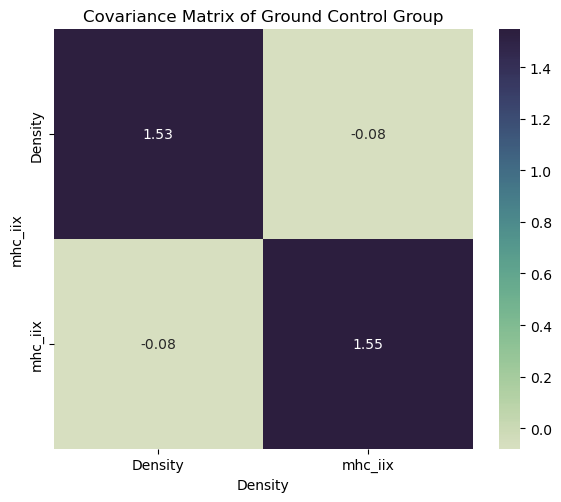

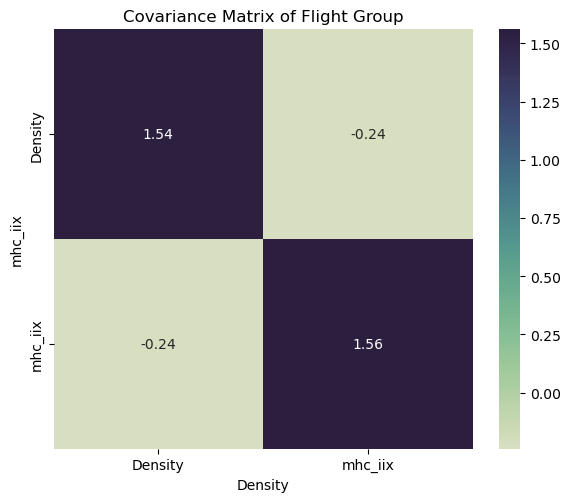

In [68]:
cov_gc_samples = trace.posterior['cov_gc'].values
cov_f_samples = trace.posterior['cov_f'].values

cov_gc_mean = cov_gc_samples.mean(axis=(0, 1)) 
cov_f_mean = cov_f_samples.mean(axis=(0, 1))

colors = sns.cubehelix_palette(start=0.5, rot=-0.75, as_cmap=True)
n_bins = 100
color_array = colors(np.linspace(0, 1, n_bins))
color_array[:, 3] = 1.0  # 设置 alpha 通道为不透明
custom_cmap = LinearSegmentedColormap.from_list("custom_cubehelix", color_array)

feature_names = ['Density', 'mhc_iix']

# 绘制 GC 组的协方差矩阵热力图
plt.figure(figsize=(6, 5))
sns.heatmap(cov_gc_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Covariance Matrix of Ground Control Group')
plt.xlabel('Density')
plt.ylabel('mhc_iix')
plt.tight_layout()
plt.show()

# 绘制 F 组的协方差矩阵热力图
plt.figure(figsize=(6, 5))
sns.heatmap(cov_f_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Covariance Matrix of Flight Group')
plt.xlabel('Density')
plt.ylabel('mhc_iix')
plt.tight_layout()
plt.show()

In [66]:
az.summary(trace, var_names=['ratio'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ratio,7.815,342.595,-21.007,25.186,3.825,2.705,6948.0,7809.0,1.0


# Standardize process 

## Bone data 

In [2]:
bone_modified = pd.read_excel('/Users/zhangxiangyu/Desktop/lab/multivariate_analysis/imputed_data/modified_bone.xlsx')
bone_modified.iloc[:, 2:].columns
bone_f = bone_modified.iloc[0:11, 2:]
bone_gc = bone_modified.iloc[11: 22, 2:]

In [3]:
bone_modified.columns

Index(['Unnamed: 0', 'Sample Name', 'trabecular_separation_millimeter',
       'trabecular_number_1_per_millimeter', 'degree_of_anisotropy',
       'connective_density', 'total_perimeter_millimeter',
       'endocortical_perimeter_millimeter',
       'medullary_area_millimeter_squared', 'eccentricity ',
       'cortical_thickness_millimeter', 'GSK3_beta_content_LSDS-70',
       'serine9_phosphorylated_GSK3_beta_content_LSDS-70',
       'ratio_of_phosphorylated_serine_9_to_total_GSK3_beta_content__LSDS-70'],
      dtype='object')

## Ocular data 

In [3]:
ocular = pd.read_excel('/Users/zhangxiangyu/Desktop/lab/multivariate_analysis/imputed_data/ocular/modified_ocular.xlsx')
ocular_f = ocular.iloc[0:11, 3:]
ocular_gc = ocular.iloc[11:22, 3:]

In [24]:
ocular.columns

Index(['Unnamed: 0', 'Source Name', 'Sample Name', 'Left_1', 'Left_2',
       'Left_3', 'Avg_Left', 'Right_1', 'Right_2', 'Right_3', 'Avg_Right',
       'Ant-Post', 'Sup-Inf', 'Retina', 'Pigment Layer', 'Choroid', 'Sclera',
       'Ant-Post-left', 'Right-left', 'Retina-left', 'Pigment Layer-left',
       'Choroid-left', 'Sclera-left', 'totct', 'totarea', 'density',
       'Average HNE Fluorescent Intensity', 'sumcount', 'sumEC', 'sunarea',
       'dentotal', 'denEC',
       'LSDS-5_immunostaining_microscopy_Zo-1tr_TRANSFORMED_Average',
       'LSDS-5_immunostaining_microscopy_PECAMtr_TRANSFORMED_Average', 'Total',
       'Total_EC', 'Total_Area', 'Density', 'Density_EC'],
      dtype='object')

## Muscle data

In [4]:
muscle = pd.read_excel('/Users/zhangxiangyu/Desktop/lab/multivariate_analysis/imputed_data/muscle_modified.xlsx')
muscle_f = muscle.iloc[0:11, 1:]
muscle_gc = muscle.iloc[11: 22, 1:]

In [5]:
muscle.columns

Index(['Sample Name', 'GSK3_beta_content',
       'serine9_phosphorylated_GSK3_beta_content',
       'ratio_of_phosphorylated_serine_9_to_total_GSK3_beta_content_',
       'GSK3_alpha_content', 'serine_21_phosphorylated_GSK3_alpha_content',
       'ratio_of_serine_21_phosphorylated_to_total_GSK3_alpha_content',
       'mhc_i', 'mhc_iia', 'mhc_iix', 'mhc_iib',
       'serine9_phosphorylated_GSK3_beta_content_LSDS-68',
       'ratio_of_phosphorylated_serine_9_to_total_GSK3_beta_content__LSDS-68',
       'GSK3_alpha_content_LSDS-68',
       'serine_21_phosphorylated_GSK3_alpha_content_LSDS-68',
       'ratio_of_serine_21_phosphorylated_to_total_GSK3_alpha_content_LSDS-68'],
      dtype='object')

## Bone vs Ocular 

In [21]:
bone_gc_trab = bone_gc['serine9_phosphorylated_GSK3_beta_content_LSDS-70']
bone_f_trab = bone_f['serine9_phosphorylated_GSK3_beta_content_LSDS-70']
ocular_gc_avg = ocular_gc['LSDS-5_immunostaining_microscopy_Zo-1tr_TRANSFORMED_Average']
ocular_f_avg = ocular_f['LSDS-5_immunostaining_microscopy_Zo-1tr_TRANSFORMED_Average']

In [22]:
log_ratio_bone = np.log(np.var(bone_f_trab) / np.var(bone_gc_trab))
log_ratio_ocular = np.log(np.var(ocular_f_avg) / np.var(ocular_gc_avg))

print(f"Log ratio of variances for bone trabecular density: {log_ratio_bone}")
print(f"Log ratio of variances for ocular Sup-Inf: {log_ratio_ocular}")

Log ratio of variances for bone trabecular density: -1.752573364600745
Log ratio of variances for ocular Sup-Inf: -0.33727806640940117


In [ ]:
# variance of the two features
var_bone_gc = bone_gc_trab.var()
var_bone_f = bone_f_trab.var()
print(f"Variance of connective_density in GC group: {var_bone_gc}")
print(f"Variance of connective_density in F group: {var_bone_f}")
print(var_bone_gc - var_bone_f)

Variance of connective_density in GC group: 1.3814348624625136e-09
Variance of connective_density in F group: 5.389128712541012e-09
-4.007693850078498e-09


In [32]:

var_ocular_gc = ocular_gc_avg.var()
var_ocular_f = ocular_f_avg.var()
print(f"Variance of Sup-Inf in GC group: {var_ocular_gc}")
print(f"Variance of Sup-Inf in F group: {var_ocular_f}")
print(var_ocular_gc - var_ocular_f)

Variance of Sup-Inf in GC group: 6.41560567633073
Variance of Sup-Inf in F group: 52.35006088021553
-45.9344552038848


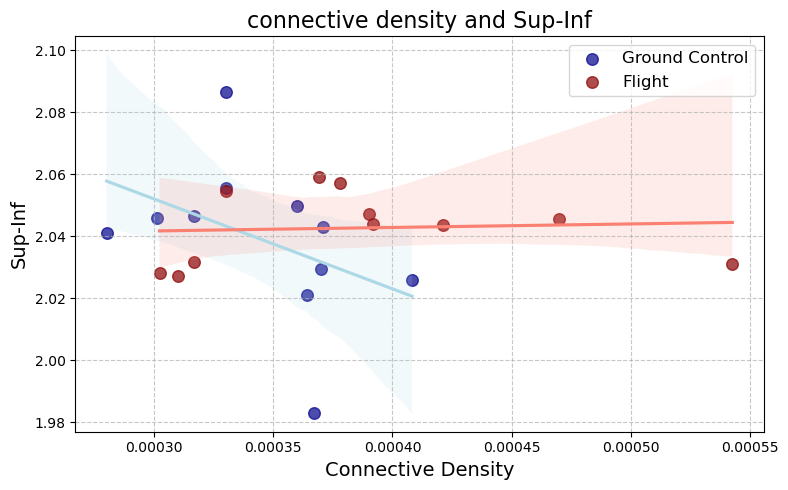

Ground Control - Correlation: -0.4224, p-value: 0.1956
Flight - Correlation: 0.0716, p-value: 0.8343


In [6]:
plt.figure(figsize=(8, 5))

sns.regplot(x=bone_gc_trab, y=ocular_gc_avg, scatter=True, 
            scatter_kws={"color": "darkblue", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "lightblue"}, 
            label="Ground Control")



# 绘制 f 组的散点图和回归线
sns.regplot(x=bone_f_trab, y=ocular_f_avg, scatter=True, 
            scatter_kws={"color": "darkred", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "salmon"}, 
            label="Flight")

# 设置图表标题和标签
plt.title('connective density and Sup-Inf', fontsize=16)
plt.xlabel('Connective Density', fontsize=14)
plt.ylabel('Sup-Inf', fontsize=14)

# 添加图例
plt.legend(fontsize=12)

# 显示网格
plt.grid(True, linestyle='--', alpha=0.7)

# 显示图表
plt.tight_layout()
plt.show()

# 计算相关系数和 p 值
r_gc, p_gc = stats.pearsonr(bone_gc_trab, ocular_gc_avg)
r_f, p_f = stats.pearsonr(bone_f_trab, ocular_f_avg)

print(f"Ground Control - Correlation: {r_gc:.4f}, p-value: {p_gc:.4f}")
print(f"Flight - Correlation: {r_f:.4f}, p-value: {p_f:.4f}")

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_gc, mu_f, chol_gc, chol_f]


Output()

/Users/zhangxiangyu/miniconda3/envs/pymc_env/lib/python3.12/site-packages/pytensor/compile/function/types.py:970: RuntimeWarning: invalid value encountered in accumulate
  self.vm()
/Users/zhangxiangyu/miniconda3/envs/pymc_env/lib/python3.12/site-packages/pytensor/compile/function/types.py:970: RuntimeWarning: invalid value encountered in accumulate
  self.vm()


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 11 seconds.


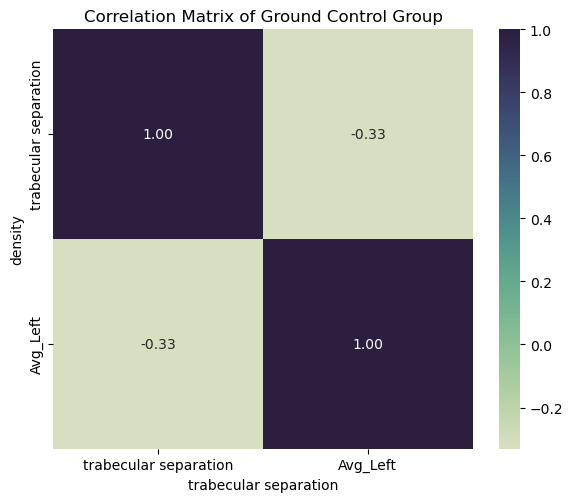

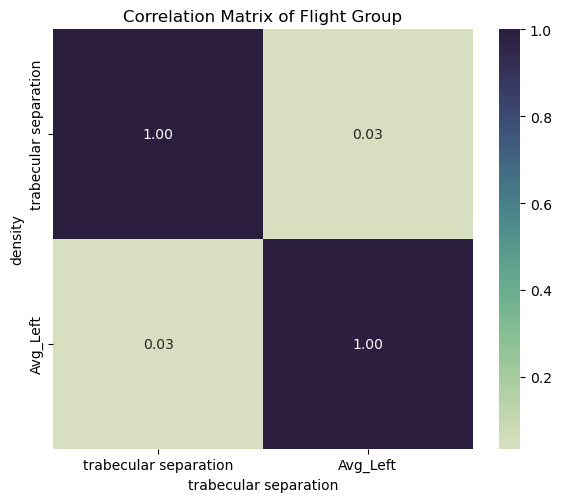

                       mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  \
mu_gc[0]              0.004  0.349  -0.653    0.678      0.004    0.004   
mu_gc[1]              0.001  0.341  -0.672    0.633      0.004    0.004   
mu_f[0]               0.007  0.344  -0.648    0.645      0.003    0.004   
mu_f[1]               0.004  0.345  -0.672    0.627      0.004    0.004   
corr_gc_matrix[0, 0]  1.000  0.000   1.000    1.000      0.000    0.000   
corr_gc_matrix[0, 1] -0.330  0.261  -0.782    0.160      0.003    0.002   
corr_gc_matrix[1, 0] -0.330  0.261  -0.782    0.160      0.003    0.002   
corr_gc_matrix[1, 1]  1.000  0.000   1.000    1.000      0.000    0.000   
corr_f_matrix[0, 0]   1.000  0.000   1.000    1.000      0.000    0.000   
corr_f_matrix[0, 1]   0.035  0.238  -0.411    0.469      0.003    0.003   
corr_f_matrix[1, 0]   0.035  0.238  -0.411    0.469      0.003    0.003   
corr_f_matrix[1, 1]   1.000  0.000   1.000    1.000      0.000    0.000   
corr_diff            -0.3

/Users/zhangxiangyu/miniconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:592: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/zhangxiangyu/miniconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:592: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


array([<Axes: title={'center': 'x\n0, 0'}>,
       <Axes: title={'center': 'x\n0, 1'}>,
       <Axes: title={'center': 'x\n1, 0'}>,
       <Axes: title={'center': 'x\n1, 1'}>], dtype=object)

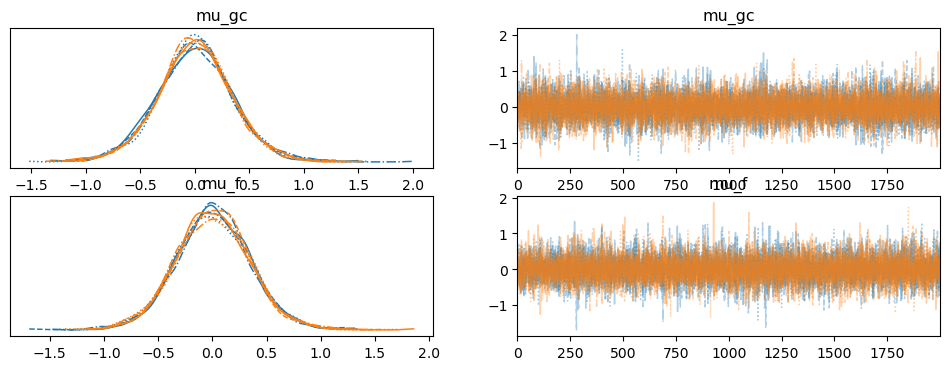

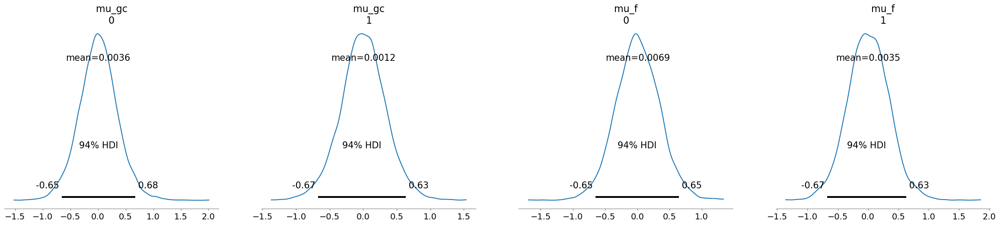

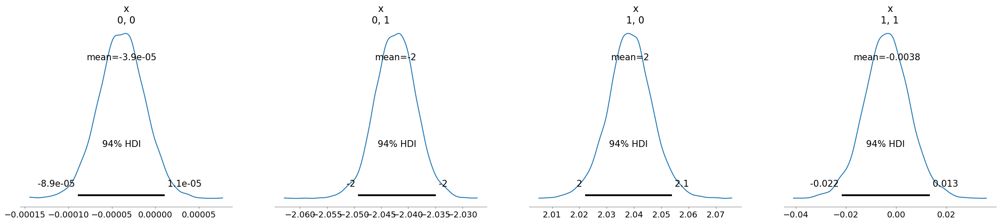

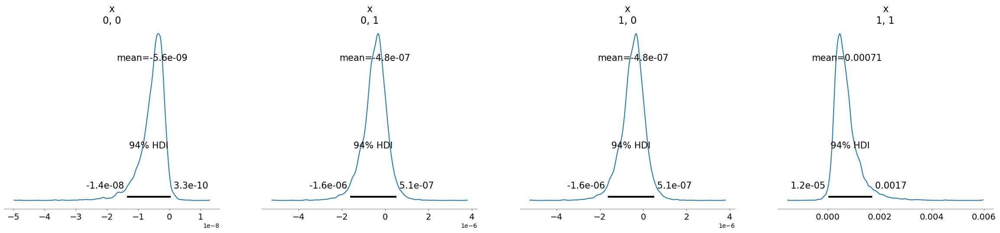

In [10]:
from matplotlib.colors import LinearSegmentedColormap
# Assuming bone_gc_trab, ocular_gc_avg, bone_f_trab, and ocular_f_avg are already defined
n_features = 2
n_chains = 4  
n_draws = 2000

# Standardizing the data
scaler = StandardScaler()
data_gc = scaler.fit_transform(np.vstack([bone_gc_trab, ocular_gc_avg]).T)
data_f = scaler.fit_transform(np.vstack([bone_f_trab, ocular_f_avg]).T)

mean_gc_trab = np.mean(bone_gc_trab)
mean_ocular_gc = np.mean(ocular_gc_avg)
std_gc_trab = np.std(bone_gc_trab)
std_ocular_gc = np.std(ocular_gc_avg)

mean_f_trab = np.mean(bone_f_trab)
mean_ocular_f = np.mean(ocular_f_avg)
std_f_trab = np.std(bone_f_trab)
std_ocular_f = np.std(ocular_f_avg)

with pm.Model() as model:
    # Priors for the means
    mu_gc = pm.Normal('mu_gc', mu=np.mean(data_gc, axis=0), sigma=np.std(data_gc, axis=0), shape=n_features)
    mu_f = pm.Normal('mu_f', mu=np.mean(data_f, axis=0), sigma=np.std(data_f, axis=0), shape=n_features)
    
    # LKJCholeskyCov for covariance matrices
    sd_dist = pm.HalfCauchy.dist(beta=2.5, shape=n_features)

    # For GC group
    chol_gc, corr_gc, stds_gc = pm.LKJCholeskyCov('chol_gc', n=n_features, eta=1, sd_dist=sd_dist, compute_corr=True)
    cov_gc = pm.Deterministic('cov_gc', chol_gc @ chol_gc.T)
    
    # Store the correlation matrix for GC group
    corr_gc_matrix = pm.Deterministic('corr_gc_matrix', corr_gc)

    # For F group
    chol_f, corr_f, stds_f = pm.LKJCholeskyCov('chol_f', n=n_features, eta=4, sd_dist=sd_dist, compute_corr=True)
    cov_f = pm.Deterministic('cov_f', chol_f @ chol_f.T)

    # Store the correlation matrix for F group
    corr_f_matrix = pm.Deterministic('corr_f_matrix', corr_f)

    # Compute the difference between the off-diagonal correlations
    corr_diff = pm.Deterministic('corr_diff', corr_gc[0, 1] - corr_f[0, 1])

    # Defining the likelihood using the covariance matrix from LKJCholeskyCov
    likelihood_gc = pm.MvNormal('likelihood_gc', mu=mu_gc, chol=chol_gc, observed=data_gc)
    likelihood_f = pm.MvNormal('likelihood_f', mu=mu_f, chol=chol_f, observed=data_f)

    # MCMC sampling using the NUTS sampler
    trace = pm.sample(draws=2000, tune=1000, chains=n_chains, return_inferencedata=True)

# Extract correlation matrices
corr_gc_values = trace.posterior['corr_gc_matrix'].values
corr_f_values = trace.posterior['corr_f_matrix'].values

# Filter out any NaN or infinity values by replacing them with 0
corr_gc_values = np.nan_to_num(corr_gc_values, nan=0.0, posinf=0.0, neginf=0.0)
corr_f_values = np.nan_to_num(corr_f_values, nan=0.0, posinf=0.0, neginf=0.0)

cov_gc_values = trace.posterior['cov_gc'].values
cov_f_values = trace.posterior['cov_f'].values


# Compute the mean correlation matrices
corr_gc_mean = corr_gc_values.mean(axis=(0, 1))
corr_f_mean = corr_f_values.mean(axis=(0, 1))



# Reverse the standardization for mu_gc and mu_f to get back to the original scale
mu_gc_orig = trace.posterior['mu_gc'] * np.array([std_gc_trab, std_ocular_gc]) + np.array([mean_gc_trab, mean_ocular_gc])
mu_f_orig = trace.posterior['mu_f'] * np.array([std_f_trab, std_ocular_f]) + np.array([mean_f_trab, mean_ocular_f])
mu_diff = mu_gc_orig - mu_f_orig

# Reverse the standardization for cov_gc and cov_f to get back to the original scale
D_gc = np.diag([std_gc_trab, std_ocular_gc])
D_f = np.diag([std_f_trab, std_ocular_f])

# 转换ground control组的协方差矩阵
cov_gc_orig = np.zeros_like(cov_gc_values)
for i in range(cov_gc_values.shape[0]):
    for j in range(cov_gc_values.shape[1]):
        cov_gc_orig[i,j] = D_gc @ cov_gc_values[i,j] @ D_gc

# 转换flight组的协方差矩阵
cov_f_orig = np.zeros_like(cov_f_values)
for i in range(cov_f_values.shape[0]):
    for j in range(cov_f_values.shape[1]):
        cov_f_orig[i,j] = D_f @ cov_f_values[i,j] @ D_f

# 计算差异
cov_diff = cov_gc_orig - cov_f_orig

# Creating custom cubehelix colormap
colors = sns.cubehelix_palette(start=0.5, rot=-0.75, as_cmap=True)
n_bins = 100
color_array = colors(np.linspace(0, 1, n_bins))
color_array[:, 3] = 1.0  # Set alpha channel to opaque
custom_cmap = LinearSegmentedColormap.from_list("custom_cubehelix", color_array)

# Feature names for the axes
feature_names = ['trabecular separation', 'Avg_Left']

# Plot the correlation matrix heatmap for the GC group
plt.figure(figsize=(6, 5))
sns.heatmap(corr_gc_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Correlation Matrix of Ground Control Group')
plt.xlabel('trabecular separation')
plt.ylabel('density')
plt.tight_layout()
plt.show()

# Plot the correlation matrix heatmap for the F group
plt.figure(figsize=(6, 5))
sns.heatmap(corr_f_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Correlation Matrix of Flight Group')
plt.xlabel('trabecular separation')
plt.ylabel('density')
plt.tight_layout()
plt.show()

# Print summary statistics for correlation and correlation difference
print(az.summary(trace, var_names=['mu_gc', 'mu_f', 'corr_gc_matrix', 'corr_f_matrix', 'corr_diff']))

# Plot trace and posterior for the correlations and difference
az.plot_trace(trace, var_names=['mu_gc', 'mu_f'])
az.plot_posterior(trace, var_names=['mu_gc', 'mu_f'])
az.plot_posterior(mu_diff)
az.plot_posterior(cov_diff)

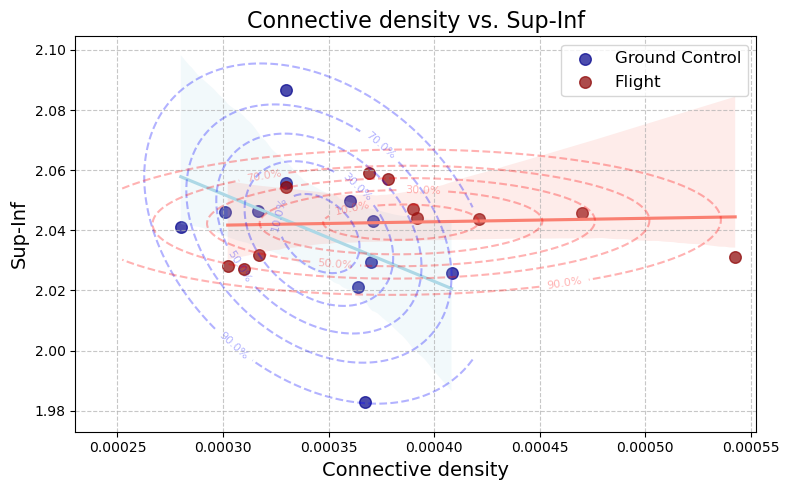

Ground Control - Correlation: -0.4224, p-value: 0.1956
Flight - Correlation: 0.0716, p-value: 0.8343


In [20]:
plt.figure(figsize=(8, 5))

# Scatter plots with regression lines
sns.regplot(x=bone_gc_trab, y=ocular_gc_avg, scatter=True, 
            scatter_kws={"color": "darkblue", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "lightblue"}, 
            label="Ground Control")

sns.regplot(x=bone_f_trab, y=ocular_f_avg, scatter=True, 
            scatter_kws={"color": "darkred", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "salmon"}, 
            label="Flight")

# Ground Control density contours
gc_mean = mu_gc_orig.mean(dim=('chain', 'draw')).values
gc_cov = cov_gc_values.mean(axis=(0, 1))
gc_cov[0,0] *= std_gc_trab**2
gc_cov[1,1] *= std_ocular_gc**2
gc_cov[0,1] *= std_gc_trab * std_ocular_gc
gc_cov[1,0] *= std_gc_trab * std_ocular_gc

x_gc, y_gc = np.mgrid[
    min(bone_gc_trab)-0.00005:max(bone_gc_trab)+0.00001:100j,
    min(ocular_gc_avg)-0.01:max(ocular_gc_avg)+0.01:100j
]
pos_gc = np.dstack((x_gc, y_gc))
rv_gc = multivariate_normal(gc_mean, gc_cov)
z_gc = rv_gc.pdf(pos_gc)

# Calculate density levels for specific probabilities
sorted_density_gc = np.sort(z_gc.flatten())
total_probability_gc = np.sum(sorted_density_gc)
cumsum_gc = np.cumsum(sorted_density_gc)
percentiles = [0.1, 0.3, 0.5, 0.7, 0.9]
density_levels_gc = []

for p in percentiles:
    idx = np.searchsorted(cumsum_gc/total_probability_gc, 1-p)
    density_levels_gc.append(sorted_density_gc[idx])

# Sort levels in ascending order
# 移除重复值
density_levels_gc = list(set(density_levels_gc))
# 确保递增排序
density_levels_gc = sorted(density_levels_gc)

contour_gc = plt.contour(x_gc, y_gc, z_gc, levels=density_levels_gc, 
                        colors='blue', alpha=0.3, linestyles='dashed')
plt.clabel(contour_gc, inline=True, fontsize=8, 
          fmt=lambda x: f'{100*(1-percentiles[density_levels_gc.index(x)]):.1f}%')

# Flight density contours
f_mean = mu_f_orig.mean(dim=('chain', 'draw')).values
f_cov = cov_f_values.mean(axis=(0, 1))
f_cov[0,0] *= std_f_trab**2
f_cov[1,1] *= std_ocular_f**2
f_cov[0,1] *= std_f_trab * std_ocular_f
f_cov[1,0] *= std_f_trab * std_ocular_f

x_f, y_f = np.mgrid[
    min(bone_f_trab)-0.00005:max(bone_f_trab)+0.00001:100j,
    min(ocular_f_avg)-0.01:max(ocular_f_avg)+0.01:100j
]
pos_f = np.dstack((x_f, y_f))
rv_f = multivariate_normal(f_mean, f_cov)
z_f = rv_f.pdf(pos_f)

# Calculate density levels for specific probabilities
sorted_density_f = np.sort(z_f.flatten())
total_probability_f = np.sum(sorted_density_f)
cumsum_f = np.cumsum(sorted_density_f)
density_levels_f = []

for p in percentiles:
    idx = np.searchsorted(cumsum_f/total_probability_f, 1-p)
    density_levels_f.append(sorted_density_f[idx])

# Sort levels in ascending order
density_levels_f = sorted(density_levels_f)

contour_f = plt.contour(x_f, y_f, z_f, levels=density_levels_f, 
                       colors='red', alpha=0.3, linestyles='dashed')
plt.clabel(contour_f, inline=True, fontsize=8, 
          fmt=lambda x: f'{100*(1-percentiles[density_levels_f.index(x)]):.1f}%')

plt.title('Connective density vs. Sup-Inf', fontsize=16)
plt.xlabel('Connective density', fontsize=14)
plt.ylabel('Sup-Inf', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Calculate correlation coefficients and p-values
r_gc, p_gc = stats.pearsonr(bone_gc_trab, ocular_gc_avg)
r_f, p_f = stats.pearsonr(bone_f_trab, ocular_f_avg)

print(f"Ground Control - Correlation: {r_gc:.4f}, p-value: {p_gc:.4f}")
print(f"Flight - Correlation: {r_f:.4f}, p-value: {p_f:.4f}")

<Axes: title={'center': 'corr_diff'}>

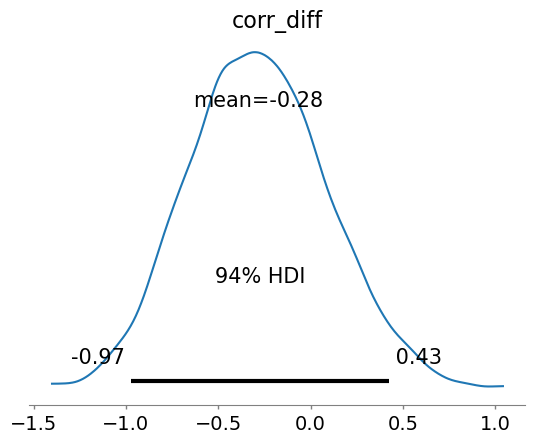

In [42]:
az.plot_posterior(trace, var_names=['corr_diff'])

In [43]:
corr_gc_values = trace.posterior['corr_gc_matrix'].values
corr_f_values = trace.posterior['corr_f_matrix'].values

gc_greater_f = (corr_gc_values[:, :, 0, 1] > corr_f_values[:, :, 0, 1]).mean()

print(f"P(corr_gc > corr_f) = {gc_greater_f:.4f}")

P(corr_gc > corr_f) = 0.2243


## Bone vs Muscle

In [ ]:
bone_gc_trab = bone_gc['serine9_phosphorylated_GSK3_beta_content_LSDS-70']
bone_f_trab = bone_f['serine9_phosphorylated_GSK3_beta_content_LSDS-70']
muscle_f_avg = muscle_f['GSK3_beta_content']
muscle_gc_avg = muscle_gc['GSK3_beta_content']

In [25]:
muscle_f_avg = muscle_f['mhc_iix']
muscle_gc_avg = muscle_gc['mhc_iix']
log_ratio_muscle = np.log(np.var(muscle_f_avg) / np.var(muscle_gc_avg))
print(f"Log ratio of variances for bone trabecular density: {log_ratio_muscle}")

Log ratio of variances for bone trabecular density: 2.6702407706242153


In [12]:
print(bone_gc_trab.var() - bone_f_trab.var())

5.032789554991522


In [13]:
print(muscle_gc_avg.var() - muscle_f_avg.var()) 

0.04546880372988218


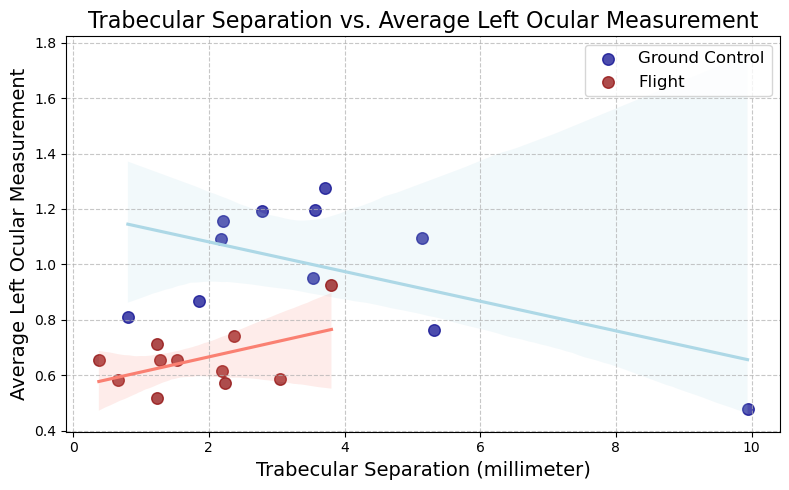

Ground Control - Correlation: -0.5506, p-value: 0.0792
Flight - Correlation: 0.5120, p-value: 0.1074


In [10]:
plt.figure(figsize=(8, 5))

# 绘制 gc 组的散点图和回归线
sns.regplot(x=bone_gc_trab, y=muscle_gc_avg, scatter=True, 
            scatter_kws={"color": "darkblue", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "lightblue"}, 
            label="Ground Control")



# 绘制 f 组的散点图和回归线
sns.regplot(x=bone_f_trab, y=muscle_f_avg, scatter=True, 
            scatter_kws={"color": "darkred", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "salmon"}, 
            label="Flight")

# 设置图表标题和标签
plt.title('Trabecular Separation vs. Average Left Ocular Measurement', fontsize=16)
plt.xlabel('Trabecular Separation (millimeter)', fontsize=14)
plt.ylabel('Average Left Ocular Measurement', fontsize=14)

# 添加图例
plt.legend(fontsize=12)

# 显示网格
plt.grid(True, linestyle='--', alpha=0.7)

# 显示图表
plt.tight_layout()
plt.show()

# 计算相关系数和 p 值
r_gc, p_gc = stats.pearsonr(bone_gc_trab, muscle_gc_avg)
r_f, p_f = stats.pearsonr(bone_f_trab, muscle_f_avg)

print(f"Ground Control - Correlation: {r_gc:.4f}, p-value: {p_gc:.4f}")
print(f"Flight - Correlation: {r_f:.4f}, p-value: {p_f:.4f}")

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_gc, mu_f, chol_gc, chol_f]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 11 seconds.


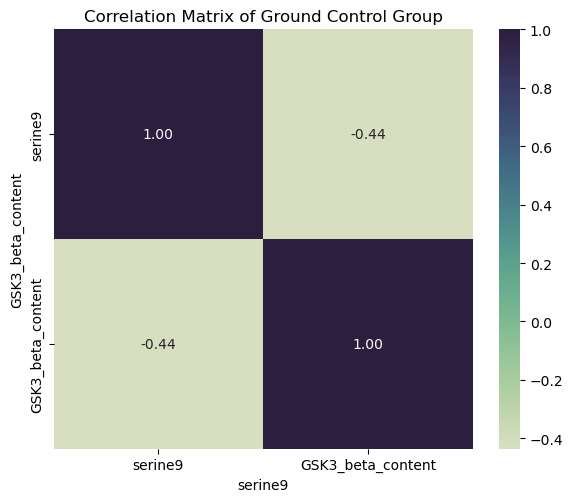

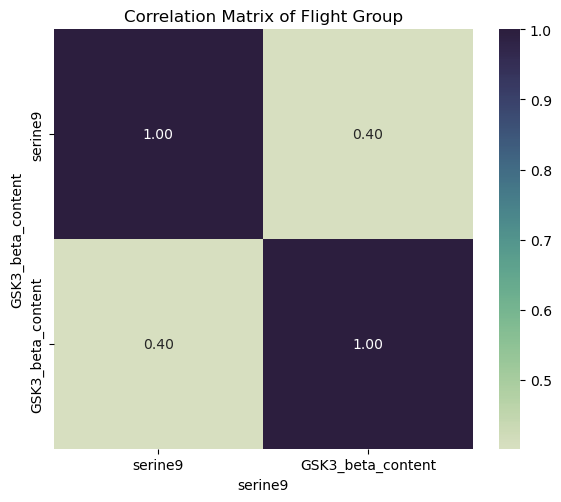

                       mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  \
mu_gc[0]              0.003  0.329  -0.628    0.624      0.004    0.003   
mu_gc[1]             -0.003  0.328  -0.632    0.616      0.004    0.003   
mu_f[0]               0.003  0.339  -0.616    0.664      0.004    0.004   
mu_f[1]               0.008  0.335  -0.644    0.633      0.004    0.004   
corr_gc_matrix[0, 0]  1.000  0.000   1.000    1.000      0.000    0.000   
corr_gc_matrix[0, 1] -0.435  0.245  -0.846    0.032      0.003    0.002   
corr_gc_matrix[1, 0] -0.435  0.245  -0.846    0.032      0.003    0.002   
corr_gc_matrix[1, 1]  1.000  0.000   1.000    1.000      0.000    0.000   
corr_f_matrix[0, 0]   1.000  0.000   1.000    1.000      0.000    0.000   
corr_f_matrix[0, 1]   0.402  0.252  -0.079    0.819      0.003    0.002   
corr_f_matrix[1, 0]   0.402  0.252  -0.079    0.819      0.003    0.002   
corr_f_matrix[1, 1]   1.000  0.000   1.000    1.000      0.000    0.000   
corr_diff            -0.8

/Users/zhangxiangyu/miniconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:592: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/zhangxiangyu/miniconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:592: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


array([<Axes: title={'center': 'x\n0, 0'}>,
       <Axes: title={'center': 'x\n0, 1'}>,
       <Axes: title={'center': 'x\n1, 0'}>,
       <Axes: title={'center': 'x\n1, 1'}>], dtype=object)

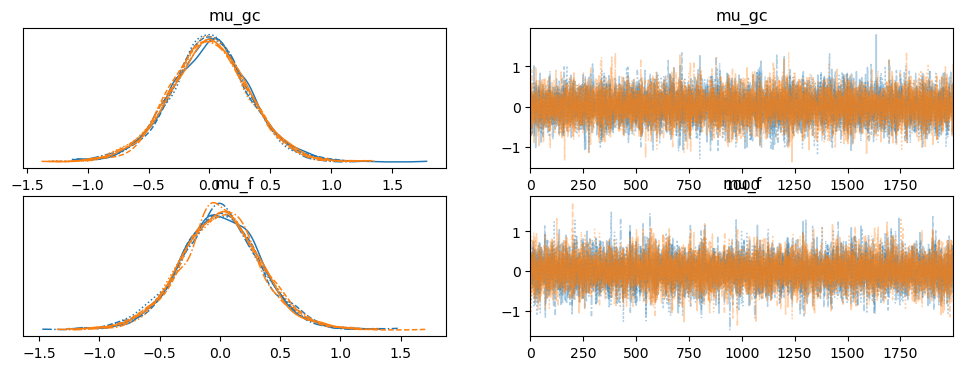

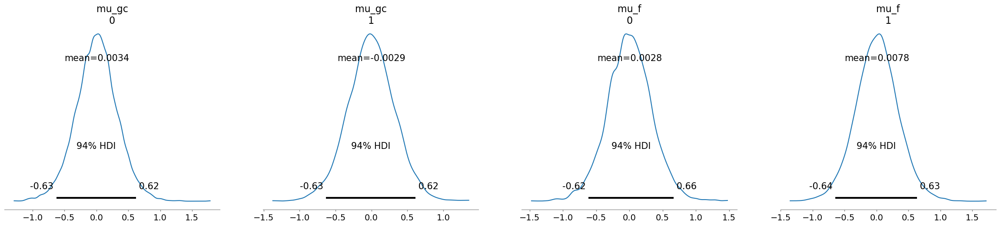

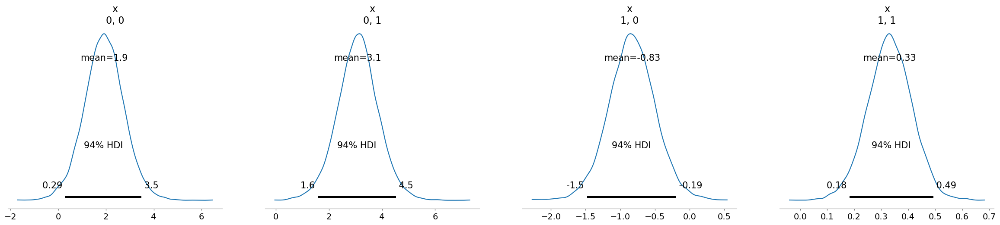

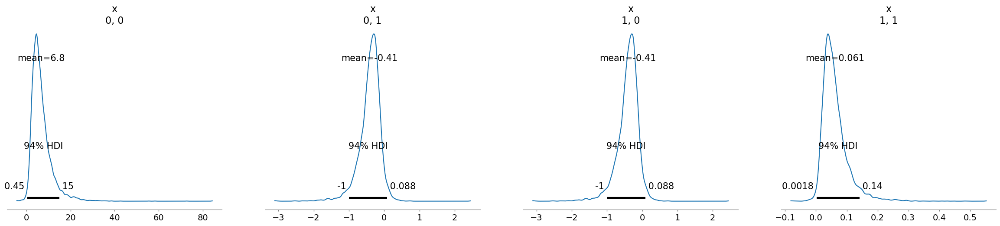

In [11]:
n_features = 2
n_chains = 4  
n_draws = 2000

# Standardizing the data
scaler = StandardScaler()
data_gc = scaler.fit_transform(np.vstack([bone_gc_trab, muscle_gc_avg]).T)
data_f = scaler.fit_transform(np.vstack([bone_f_trab, muscle_f_avg]).T)

mean_gc_trab = np.mean(bone_gc_trab)
mean_muscle_gc = np.mean(muscle_gc_avg)
std_gc_trab = np.std(bone_gc_trab)
std_muscle_gc = np.std(muscle_gc_avg)

mean_f_trab = np.mean(bone_f_trab)
mean_muscle_f = np.mean(muscle_f_avg)
std_f_trab = np.std(bone_f_trab)
std_muscle_f = np.std(muscle_f_avg)

with pm.Model() as model:
    # Priors for the means
    mu_gc = pm.Normal('mu_gc', mu=np.mean(data_gc, axis=0), sigma=np.std(data_gc, axis=0), shape=n_features)
    mu_f = pm.Normal('mu_f', mu=np.mean(data_f, axis=0), sigma=np.std(data_f, axis=0), shape=n_features)
    
    # LKJCholeskyCov for covariance matrices
    sd_dist = pm.HalfCauchy.dist(beta=2.5, shape=n_features)

    # For GC group
    chol_gc, corr_gc, stds_gc = pm.LKJCholeskyCov('chol_gc', n=n_features, eta=1, sd_dist=sd_dist, compute_corr=True)
    cov_gc = pm.Deterministic('cov_gc', chol_gc @ chol_gc.T)
    
    # Store the correlation matrix for GC group
    corr_gc_matrix = pm.Deterministic('corr_gc_matrix', corr_gc)

    # For F group
    chol_f, corr_f, stds_f = pm.LKJCholeskyCov('chol_f', n=n_features, eta=1, sd_dist=sd_dist, compute_corr=True)
    cov_f = pm.Deterministic('cov_f', chol_f @ chol_f.T)

    # Store the correlation matrix for F group
    corr_f_matrix = pm.Deterministic('corr_f_matrix', corr_f)

    # Compute the difference between the off-diagonal correlations
    corr_diff = pm.Deterministic('corr_diff', corr_gc[0, 1] - corr_f[0, 1])

    # Defining the likelihood using the covariance matrix from LKJCholeskyCov
    likelihood_gc = pm.MvNormal('likelihood_gc', mu=mu_gc, chol=chol_gc, observed=data_gc)
    likelihood_f = pm.MvNormal('likelihood_f', mu=mu_f, chol=chol_f, observed=data_f)

    # MCMC sampling using the NUTS sampler
    trace = pm.sample(draws=2000, tune=1000, chains=n_chains, return_inferencedata=True)

# Extract correlation matrices
corr_gc_values = trace.posterior['corr_gc_matrix'].values
corr_f_values = trace.posterior['corr_f_matrix'].values

cov_gc_values = trace.posterior['cov_gc'].values
cov_f_values = trace.posterior['cov_f'].values
# Filter out any NaN or infinity values by replacing them with 0
corr_gc_values = np.nan_to_num(corr_gc_values, nan=0.0, posinf=0.0, neginf=0.0)
corr_f_values = np.nan_to_num(corr_f_values, nan=0.0, posinf=0.0, neginf=0.0)

# Compute the mean correlation matrices
corr_gc_mean = corr_gc_values.mean(axis=(0, 1))
corr_f_mean = corr_f_values.mean(axis=(0, 1))

# Reverse the standardization for mu_gc and mu_f to get back to the original scale
mu_gc_orig = trace.posterior['mu_gc'] * np.array([std_gc_trab, std_muscle_gc]) + np.array([mean_gc_trab, mean_muscle_gc])
mu_f_orig = trace.posterior['mu_f'] * np.array([std_f_trab, std_muscle_f]) + np.array([mean_f_trab, mean_muscle_f])
mu_diff = mu_gc_orig - mu_f_orig

# Reverse the standardization for cov_gc and cov_f to get back to the original scale
D_gc = np.diag([std_gc_trab, std_muscle_gc])
D_f = np.diag([std_f_trab, std_muscle_f])

# 转换ground control组的协方差矩阵
cov_gc_orig = np.zeros_like(cov_gc_values)
for i in range(cov_gc_values.shape[0]):
    for j in range(cov_gc_values.shape[1]):
        cov_gc_orig[i,j] = D_gc @ cov_gc_values[i,j] @ D_gc

# 转换flight组的协方差矩阵
cov_f_orig = np.zeros_like(cov_f_values)
for i in range(cov_f_values.shape[0]):
    for j in range(cov_f_values.shape[1]):
        cov_f_orig[i,j] = D_f @ cov_f_values[i,j] @ D_f

# 计算差异
cov_diff = cov_gc_orig - cov_f_orig

# Creating custom cubehelix colormap
colors = sns.cubehelix_palette(start=0.5, rot=-0.75, as_cmap=True)
n_bins = 100
color_array = colors(np.linspace(0, 1, n_bins))
color_array[:, 3] = 1.0  # Set alpha channel to opaque
custom_cmap = LinearSegmentedColormap.from_list("custom_cubehelix", color_array)

# Feature names for the axes
feature_names = ['serine9', 'GSK3_beta_content']

# Plot the correlation matrix heatmap for the GC group
plt.figure(figsize=(6, 5))
sns.heatmap(corr_gc_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Correlation Matrix of Ground Control Group')
plt.xlabel('serine9')
plt.ylabel('GSK3_beta_content')
plt.tight_layout()
plt.show()

# Plot the correlation matrix heatmap for the F group
plt.figure(figsize=(6, 5))
sns.heatmap(corr_f_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Correlation Matrix of Flight Group')
plt.xlabel('serine9')
plt.ylabel('GSK3_beta_content')
plt.tight_layout()
plt.show()

# Print summary statistics for correlation and correlation difference
print(az.summary(trace, var_names=['mu_gc', 'mu_f', 'corr_gc_matrix', 'corr_f_matrix', 'corr_diff']))

# Plot trace and posterior for the correlations and difference
az.plot_trace(trace, var_names=['mu_gc', 'mu_f'])
az.plot_posterior(trace, var_names=['mu_gc', 'mu_f'])
az.plot_posterior(mu_diff)
az.plot_posterior(cov_diff)

<Axes: title={'center': 'corr_diff'}>

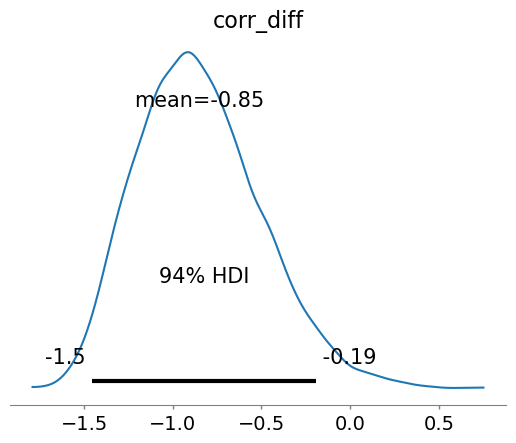

In [40]:
az.plot_posterior(trace, var_names=['corr_diff'])

In [41]:
corr_gc_values = trace.posterior['corr_gc_matrix'].values
corr_f_values = trace.posterior['corr_f_matrix'].values

gc_greater_f = (corr_gc_values[:, :, 0, 1] > corr_f_values[:, :, 0, 1]).mean()

print(f"P(corr_gc > corr_f) = {gc_greater_f:.4f}")

P(corr_gc > corr_f) = 0.0151


## Ocular vs Muscle

In [20]:
ocular_gc_trab = ocular_gc['density']
ocular_f_trab = ocular_f['density']
muscle_f_avg = muscle_f['ratio_of_phosphorylated_serine_9_to_total_GSK3_beta_content__LSDS-68']
muscle_gc_avg = muscle_gc['ratio_of_phosphorylated_serine_9_to_total_GSK3_beta_content__LSDS-68']

In [21]:
print(ocular_gc_trab.var() - ocular_f_trab.var())
print(muscle_gc_avg.var() - muscle_f_avg.var()) 

11950.906337582477
-0.028938413665883646


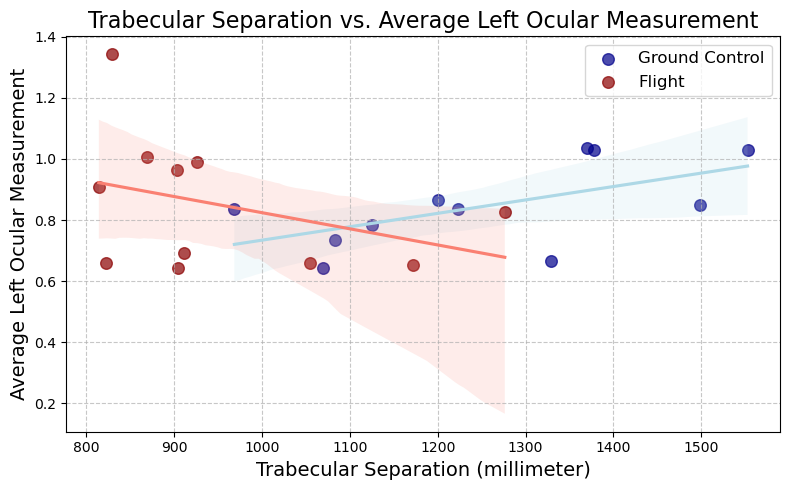

Ground Control - Correlation: 0.5890, p-value: 0.0566
Flight - Correlation: -0.3638, p-value: 0.2714


In [22]:
plt.figure(figsize=(8, 5))

# 绘制 gc 组的散点图和回归线
sns.regplot(x=ocular_gc_trab, y=muscle_gc_avg, scatter=True, 
            scatter_kws={"color": "darkblue", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "lightblue"}, 
            label="Ground Control")



# 绘制 f 组的散点图和回归线
sns.regplot(x=ocular_f_trab, y=muscle_f_avg, scatter=True, 
            scatter_kws={"color": "darkred", "alpha": 0.7, "s": 70}, 
            line_kws={"color": "salmon"}, 
            label="Flight")

# 设置图表标题和标签
plt.title('Trabecular Separation vs. Average Left Ocular Measurement', fontsize=16)
plt.xlabel('Trabecular Separation (millimeter)', fontsize=14)
plt.ylabel('Average Left Ocular Measurement', fontsize=14)

# 添加图例
plt.legend(fontsize=12)

# 显示网格
plt.grid(True, linestyle='--', alpha=0.7)

# 显示图表
plt.tight_layout()
plt.show()

# 计算相关系数和 p 值
r_gc, p_gc = stats.pearsonr(ocular_gc_trab, muscle_gc_avg)
r_f, p_f = stats.pearsonr(ocular_f_trab, muscle_f_avg)

print(f"Ground Control - Correlation: {r_gc:.4f}, p-value: {p_gc:.4f}")
print(f"Flight - Correlation: {r_f:.4f}, p-value: {p_f:.4f}")

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_gc, mu_f, chol_gc, chol_f]


Output()

/Users/zhangxiangyu/miniconda3/envs/pymc_env/lib/python3.12/site-packages/pytensor/compile/function/types.py:970: RuntimeWarning: invalid value encountered in accumulate
  self.vm()


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 11 seconds.


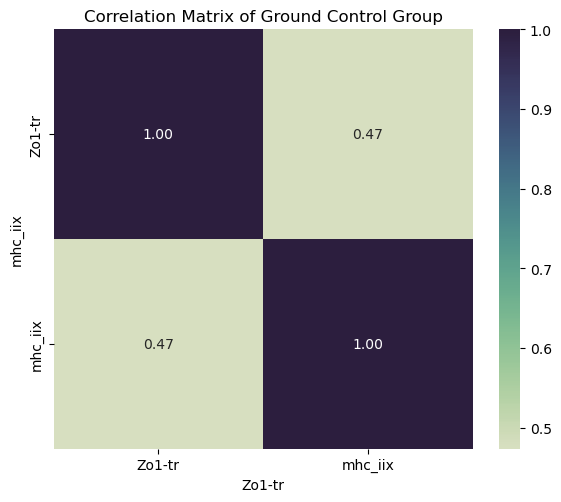

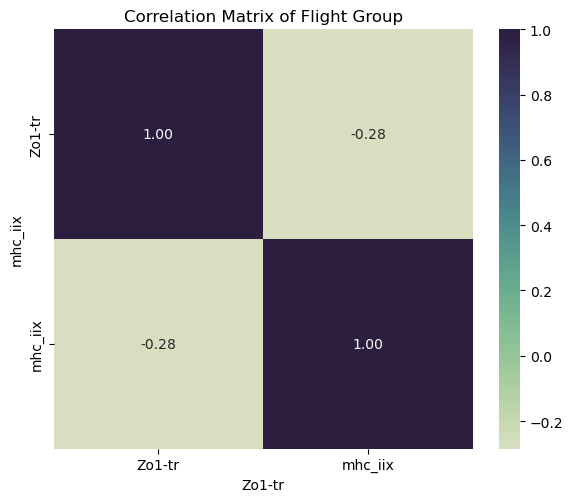

/Users/zhangxiangyu/miniconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:592: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/zhangxiangyu/miniconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:592: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                       mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  \
mu_gc[0]              0.003  0.336  -0.623    0.655      0.004    0.004   
mu_gc[1]              0.002  0.334  -0.614    0.650      0.004    0.004   
mu_f[0]               0.001  0.345  -0.645    0.664      0.004    0.004   
mu_f[1]               0.007  0.334  -0.612    0.642      0.004    0.004   
corr_gc_matrix[0, 0]  1.000  0.000   1.000    1.000      0.000    0.000   
corr_gc_matrix[0, 1]  0.474  0.235   0.041    0.870      0.003    0.002   
corr_gc_matrix[1, 0]  0.474  0.235   0.041    0.870      0.003    0.002   
corr_gc_matrix[1, 1]  1.000  0.000   1.000    1.000      0.000    0.000   
corr_f_matrix[0, 0]   1.000  0.000   1.000    1.000      0.000    0.000   
corr_f_matrix[0, 1]  -0.284  0.269  -0.758    0.211      0.003    0.002   
corr_f_matrix[1, 0]  -0.284  0.269  -0.758    0.211      0.003    0.002   
corr_f_matrix[1, 1]   1.000  0.000   1.000    1.000      0.000    0.000   
corr_diff             0.7

array([<Axes: title={'center': 'x\n0, 0'}>,
       <Axes: title={'center': 'x\n0, 1'}>,
       <Axes: title={'center': 'x\n1, 0'}>,
       <Axes: title={'center': 'x\n1, 1'}>], dtype=object)

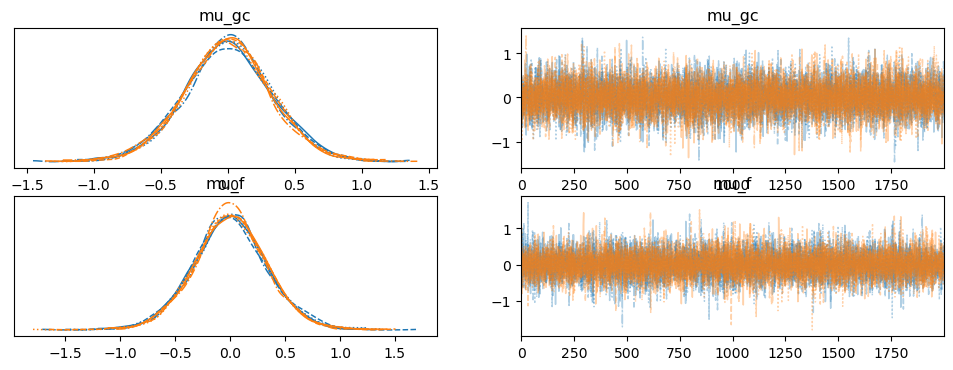

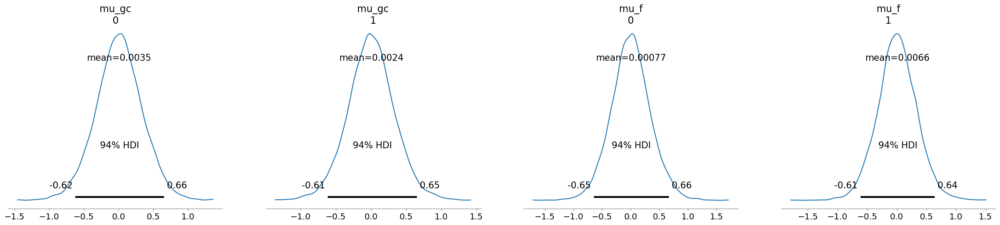

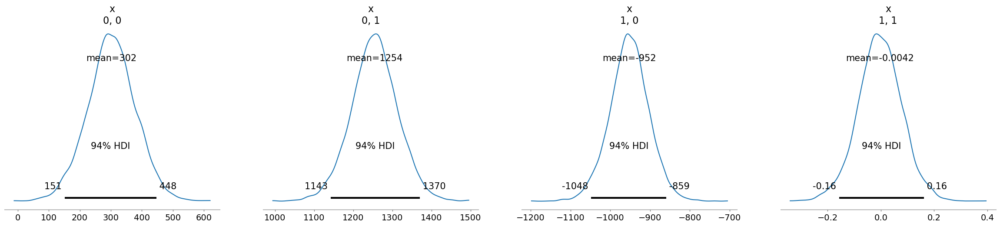

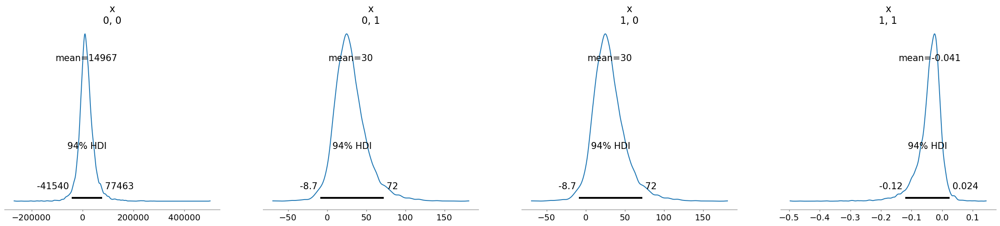

In [24]:
n_features = 2
n_chains = 4  
n_draws = 2000

# Standardizing the data
scaler = StandardScaler()
data_gc = scaler.fit_transform(np.vstack([ocular_gc_trab, muscle_gc_avg]).T)
data_f = scaler.fit_transform(np.vstack([ocular_f_trab, muscle_f_avg]).T)

mean_gc_trab = np.mean(ocular_gc_trab)
mean_muscle_gc = np.mean(muscle_gc_avg)
std_gc_trab = np.std(ocular_gc_trab)
std_muscle_gc = np.std(muscle_gc_avg)

mean_f_trab = np.mean(ocular_f_trab)
mean_muscle_f = np.mean(muscle_f_avg)
std_f_trab = np.std(ocular_f_trab)
std_muscle_f = np.std(muscle_f_avg)

with pm.Model() as model:
    # Priors for the means
    mu_gc = pm.Normal('mu_gc', mu=np.mean(data_gc, axis=0), sigma=np.std(data_gc, axis=0), shape=n_features)
    mu_f = pm.Normal('mu_f', mu=np.mean(data_f, axis=0), sigma=np.std(data_f, axis=0), shape=n_features)
    
    # LKJCholeskyCov for covariance matrices
    sd_dist = pm.HalfCauchy.dist(beta=2.5, shape=n_features)

    # For GC group
    chol_gc, corr_gc, stds_gc = pm.LKJCholeskyCov('chol_gc', n=n_features, eta=1, sd_dist=sd_dist, compute_corr=True)
    cov_gc = pm.Deterministic('cov_gc', chol_gc @ chol_gc.T)
    
    # Store the correlation matrix for GC group
    corr_gc_matrix = pm.Deterministic('corr_gc_matrix', corr_gc)

    # For F group
    chol_f, corr_f, stds_f = pm.LKJCholeskyCov('chol_f', n=n_features, eta=1, sd_dist=sd_dist, compute_corr=True)
    cov_f = pm.Deterministic('cov_f', chol_f @ chol_f.T)

    # Store the correlation matrix for F group
    corr_f_matrix = pm.Deterministic('corr_f_matrix', corr_f)

    # Compute the difference between the off-diagonal correlations
    corr_diff = pm.Deterministic('corr_diff', corr_gc[0, 1] - corr_f[0, 1])

    # Defining the likelihood using the covariance matrix from LKJCholeskyCov
    likelihood_gc = pm.MvNormal('likelihood_gc', mu=mu_gc, chol=chol_gc, observed=data_gc)
    likelihood_f = pm.MvNormal('likelihood_f', mu=mu_f, chol=chol_f, observed=data_f)

    # MCMC sampling using the NUTS sampler
    trace = pm.sample(draws=2000, tune=1000, chains=n_chains, return_inferencedata=True)

# Extract correlation matrices
corr_gc_values = trace.posterior['corr_gc_matrix'].values
corr_f_values = trace.posterior['corr_f_matrix'].values

# Filter out any NaN or infinity values by replacing them with 0
corr_gc_values = np.nan_to_num(corr_gc_values, nan=0.0, posinf=0.0, neginf=0.0)
corr_f_values = np.nan_to_num(corr_f_values, nan=0.0, posinf=0.0, neginf=0.0)

# Compute the mean correlation matrices
corr_gc_mean = corr_gc_values.mean(axis=(0, 1))
corr_f_mean = corr_f_values.mean(axis=(0, 1))

cov_gc_values = trace.posterior['cov_gc'].values
cov_f_values = trace.posterior['cov_f'].values

# Reverse the standardization for cov_gc and cov_f to get back to the original scale
D_gc = np.diag([std_gc_trab, std_muscle_gc])
D_f = np.diag([std_f_trab, std_muscle_f])

# 转换ground control组的协方差矩阵
cov_gc_orig = np.zeros_like(cov_gc_values)
for i in range(cov_gc_values.shape[0]):
    for j in range(cov_gc_values.shape[1]):
        cov_gc_orig[i,j] = D_gc @ cov_gc_values[i,j] @ D_gc

# 转换flight组的协方差矩阵
cov_f_orig = np.zeros_like(cov_f_values)
for i in range(cov_f_values.shape[0]):
    for j in range(cov_f_values.shape[1]):
        cov_f_orig[i,j] = D_f @ cov_f_values[i,j] @ D_f

# 计算差异
cov_diff = cov_gc_orig - cov_f_orig

# Reverse the standardization for mu_gc and mu_f to get back to the original scale
mu_gc_orig = trace.posterior['mu_gc'] * np.array([std_gc_trab, std_muscle_gc]) + np.array([mean_gc_trab, mean_muscle_gc])
mu_f_orig = trace.posterior['mu_f'] * np.array([std_f_trab, std_muscle_f]) + np.array([mean_f_trab, mean_muscle_f])
mu_diff = mu_gc_orig - mu_f_orig
# Creating custom cubehelix colormap
colors = sns.cubehelix_palette(start=0.5, rot=-0.75, as_cmap=True)
n_bins = 100
color_array = colors(np.linspace(0, 1, n_bins))
color_array[:, 3] = 1.0  # Set alpha channel to opaque
custom_cmap = LinearSegmentedColormap.from_list("custom_cubehelix", color_array)

# Feature names for the axes
feature_names = ['Zo1-tr', 'mhc_iix']

# Plot the correlation matrix heatmap for the GC group
plt.figure(figsize=(6, 5))
sns.heatmap(corr_gc_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Correlation Matrix of Ground Control Group')
plt.xlabel('Zo1-tr')
plt.ylabel('mhc_iix')
plt.tight_layout()
plt.show()

# Plot the correlation matrix heatmap for the F group
plt.figure(figsize=(6, 5))
sns.heatmap(corr_f_mean, annot=True, fmt=".2f", cmap=custom_cmap, square=True,
            xticklabels=feature_names, yticklabels=feature_names)
plt.title('Correlation Matrix of Flight Group')
plt.xlabel('Zo1-tr')
plt.ylabel('mhc_iix')
plt.tight_layout()
plt.show()

# Print summary statistics for correlation and correlation difference
print(az.summary(trace, var_names=['mu_gc', 'mu_f', 'corr_gc_matrix', 'corr_f_matrix', 'corr_diff']))

# Plot trace and posterior for the correlations and difference
az.plot_trace(trace, var_names=['mu_gc', 'mu_f'])
az.plot_posterior(trace, var_names=['mu_gc', 'mu_f'])
az.plot_posterior(mu_diff)
az.plot_posterior(cov_diff)

<Axes: title={'center': 'corr_diff'}>

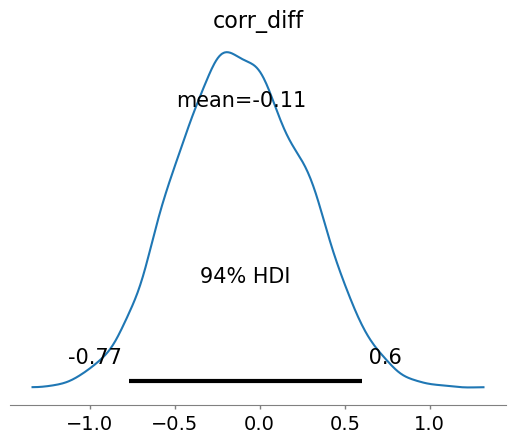

In [76]:
az.plot_posterior(trace, var_names=['corr_diff'])

In [77]:
corr_gc_values = trace.posterior['corr_gc_matrix'].values
corr_f_values = trace.posterior['corr_f_matrix'].values

gc_greater_f = (corr_gc_values[:, :, 0, 1] > corr_f_values[:, :, 0, 1]).mean()

print(f"P(corr_gc > corr_f) = {gc_greater_f:.4f}")

P(corr_gc > corr_f) = 0.3845
